## Project Title: Analysis of UK 2020 RTA Dataset

Here, we shall analyze and cluster the UK's 2020 Road Traffic Accident (RTA) dataset, employing SQL, pandas, and machine learning models such as Random Forest Classifier and Gradient Boosting Classifier. We will cluster the accidents using K-means and indicate the accident locations on a geographical map using the Folium library in Python. Additionally, we will recommend solutions to reduce RTA accidents.

## Import Libraries 

In [1]:
# Import libraries 
import sqlite3
import pandas as pd
import numpy as np
import seaborn as sns 
from datetime import datetime
import matplotlib.pyplot as plt 
from mlxtend.preprocessing import TransactionEncoder
from mlxtend.frequent_patterns import apriori, association_rules
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import geopandas as gpd
from shapely.geometry import Point
import folium
from folium import plugins
from sklearn.ensemble import IsolationForest
from numpy import quantile, where
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
from sklearn.neighbors import LocalOutlierFactor
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import warnings
%matplotlib inline
warnings.filterwarnings("ignore")

## Connect to the SQL (accident) database 

In [2]:
# Connect to the database (accident data)

con = sqlite3.connect("accident_data_v1.0.0_2023.db")

In [3]:
# Create a cur object 

cur = con.cursor()

## Getting the Data from the SQL Database 

### Accident Table

In [4]:
# Execute an SQL query on the connected database (accident data) 
# To obtain all information in the accident table

accident_info = cur.execute(f"PRAGMA table_info(accident)")

In [5]:
# Fetch all information about the columns in the accident table 

accident_info.fetchall()

[(0, 'accident_index', '', 0, None, 1),
 (1, 'accident_year', '', 0, None, 0),
 (2, 'accident_reference', '', 0, None, 0),
 (3, 'location_easting_osgr', '', 0, None, 0),
 (4, 'location_northing_osgr', '', 0, None, 0),
 (5, 'longitude', '', 0, None, 0),
 (6, 'latitude', '', 0, None, 0),
 (7, 'police_force', '', 0, None, 0),
 (8, 'accident_severity', '', 0, None, 0),
 (9, 'number_of_vehicles', '', 0, None, 0),
 (10, 'number_of_casualties', '', 0, None, 0),
 (11, 'date', '', 0, None, 0),
 (12, 'day_of_week', '', 0, None, 0),
 (13, 'time', '', 0, None, 0),
 (14, 'local_authority_district', '', 0, None, 0),
 (15, 'local_authority_ons_district', '', 0, None, 0),
 (16, 'local_authority_highway', '', 0, None, 0),
 (17, 'first_road_class', '', 0, None, 0),
 (18, 'first_road_number', '', 0, None, 0),
 (19, 'road_type', '', 0, None, 0),
 (20, 'speed_limit', '', 0, None, 0),
 (21, 'junction_detail', '', 0, None, 0),
 (22, 'junction_control', '', 0, None, 0),
 (23, 'second_road_class', '', 0, None,

### To View the Attributes (Columns) in the Accident Table

In [6]:
# obtain all information in the accident table 
cur.execute("PRAGMA table_info(accident)")

# list of all attributes (columns) in the accident table 
accident_table = [row[1] for row in cur.fetchall()]

In [7]:
# view the attributes  
print(accident_table)            

['accident_index', 'accident_year', 'accident_reference', 'location_easting_osgr', 'location_northing_osgr', 'longitude', 'latitude', 'police_force', 'accident_severity', 'number_of_vehicles', 'number_of_casualties', 'date', 'day_of_week', 'time', 'local_authority_district', 'local_authority_ons_district', 'local_authority_highway', 'first_road_class', 'first_road_number', 'road_type', 'speed_limit', 'junction_detail', 'junction_control', 'second_road_class', 'second_road_number', 'pedestrian_crossing_human_control', 'pedestrian_crossing_physical_facilities', 'light_conditions', 'weather_conditions', 'road_surface_conditions', 'special_conditions_at_site', 'carriageway_hazards', 'urban_or_rural_area', 'did_police_officer_attend_scene_of_accident', 'trunk_road_flag', 'lsoa_of_accident_location']


The information provided shows the attributes (columns) in the accident table. The accident table also has 'accident index' as its primary key 

### To Determine the Length of the Accident Table in the SQL (Accident) Database

In [8]:
# Execute an SQL query to retrieve the count of records (rows) in the "accident" table from the connected database using the cursor (cur)
cur.execute("SELECT COUNT(*) from accident")

# To fetch the counts of a single row (firt element of the fetched row) from the result set obtained the SQL query above
accident_length = cur.fetchone()[0]     

In [9]:
# The length (count) of records in the accident table
accident_length

461352

According to the given information, there are 461,352 records in the accident table

### Vehicle Table

In [10]:
# Execute an SQL query on the connected database (accident data) 
# To obtain all information in the vehicle table

vehicle_info = cur.execute(f"PRAGMA table_info(vehicle)")

In [11]:
# Fetch all information about the columns in the vehicle table 

vehicle_info.fetchall()

[(0, 'vehicle_index', '', 0, None, 1),
 (1, 'accident_index', '', 0, None, 0),
 (2, 'accident_year', '', 0, None, 0),
 (3, 'accident_reference', '', 0, None, 0),
 (4, 'vehicle_reference', '', 0, None, 0),
 (5, 'vehicle_type', '', 0, None, 0),
 (6, 'towing_and_articulation', '', 0, None, 0),
 (7, 'vehicle_manoeuvre', '', 0, None, 0),
 (8, 'vehicle_direction_from', '', 0, None, 0),
 (9, 'vehicle_direction_to', '', 0, None, 0),
 (10, 'vehicle_location_restricted_lane', '', 0, None, 0),
 (11, 'junction_location', '', 0, None, 0),
 (12, 'skidding_and_overturning', '', 0, None, 0),
 (13, 'hit_object_in_carriageway', '', 0, None, 0),
 (14, 'vehicle_leaving_carriageway', '', 0, None, 0),
 (15, 'hit_object_off_carriageway', '', 0, None, 0),
 (16, 'first_point_of_impact', '', 0, None, 0),
 (17, 'vehicle_left_hand_drive', '', 0, None, 0),
 (18, 'journey_purpose_of_driver', '', 0, None, 0),
 (19, 'sex_of_driver', '', 0, None, 0),
 (20, 'age_of_driver', '', 0, None, 0),
 (21, 'age_band_of_driver', 

### To View the Attributes (Columns) in the Vehicle Table

In [12]:
# obtain all information in the vehicle table 
cur.execute("PRAGMA table_info(vehicle)")

# list of all attributes (columns) in the vehicle table 
vehicle_table = [row[1] for row in cur.fetchall()]

In [13]:
# view the attributes  
print(vehicle_table)            

['vehicle_index', 'accident_index', 'accident_year', 'accident_reference', 'vehicle_reference', 'vehicle_type', 'towing_and_articulation', 'vehicle_manoeuvre', 'vehicle_direction_from', 'vehicle_direction_to', 'vehicle_location_restricted_lane', 'junction_location', 'skidding_and_overturning', 'hit_object_in_carriageway', 'vehicle_leaving_carriageway', 'hit_object_off_carriageway', 'first_point_of_impact', 'vehicle_left_hand_drive', 'journey_purpose_of_driver', 'sex_of_driver', 'age_of_driver', 'age_band_of_driver', 'engine_capacity_cc', 'propulsion_code', 'age_of_vehicle', 'generic_make_model', 'driver_imd_decile', 'driver_home_area_type']


The given information reveals the attributes (columns) in the vehicle table. The vehicle table also has 'vehicle index' as its primary key and 'accident index' as a foreign key. 

### To Determine the Length of the Vehicle Table in the SQL (Accident) Database

In [14]:
# Execute an SQL query to retrieve the count of records (rows) in the "vehicle" table from the connected database using the cursor (cur)
cur.execute("SELECT COUNT(*) from vehicle")

# To fetch the counts of a single row (firt element of the fetched row) from the result set obtained the SQL query above
vehicle_length = cur.fetchone()[0]     

In [15]:
# The length (count) of records in the vehicle table
vehicle_length

849091

According to the information provided, there are 849,091 records in the vehicle table 

### Casualty Table

In [16]:
# Execute an SQL query on the connected database (accident data) 
# To obtain all information in the casualty table

casualty_info = cur.execute(f"PRAGMA table_info(casualty)")

In [17]:
# Fetch all information about the columns in the casualty table 

casualty_info.fetchall()

[(0, 'casualty_index', '', 0, None, 1),
 (1, 'accident_index', '', 0, None, 0),
 (2, 'accident_year', '', 0, None, 0),
 (3, 'accident_reference', '', 0, None, 0),
 (4, 'vehicle_reference', '', 0, None, 0),
 (5, 'casualty_reference', '', 0, None, 0),
 (6, 'casualty_class', '', 0, None, 0),
 (7, 'sex_of_casualty', '', 0, None, 0),
 (8, 'age_of_casualty', '', 0, None, 0),
 (9, 'age_band_of_casualty', '', 0, None, 0),
 (10, 'casualty_severity', '', 0, None, 0),
 (11, 'pedestrian_location', '', 0, None, 0),
 (12, 'pedestrian_movement', '', 0, None, 0),
 (13, 'car_passenger', '', 0, None, 0),
 (14, 'bus_or_coach_passenger', '', 0, None, 0),
 (15, 'pedestrian_road_maintenance_worker', '', 0, None, 0),
 (16, 'casualty_type', '', 0, None, 0),
 (17, 'casualty_home_area_type', '', 0, None, 0),
 (18, 'casualty_imd_decile', '', 0, None, 0)]

### To View the Attributes (Columns) in the Casualty Table

In [18]:
# obtain all information in the casualty table 
cur.execute("PRAGMA table_info(casualty)")

# list of all attributes (columns) in the casualty table 
casualty_table = [row[1] for row in cur.fetchall()]

In [19]:
# view the attributes  
print(casualty_table)            

['casualty_index', 'accident_index', 'accident_year', 'accident_reference', 'vehicle_reference', 'casualty_reference', 'casualty_class', 'sex_of_casualty', 'age_of_casualty', 'age_band_of_casualty', 'casualty_severity', 'pedestrian_location', 'pedestrian_movement', 'car_passenger', 'bus_or_coach_passenger', 'pedestrian_road_maintenance_worker', 'casualty_type', 'casualty_home_area_type', 'casualty_imd_decile']


The given information reveals the attributes (columns) in the casualty table. The casualty index has 'casualty index' as its primary key and 'accident index' as a foreign key.

### To Determine the Length of the Casualty Table in the SQL (Accident) Database

In [20]:
# Execute an SQL query to retrieve the count of records (rows) in the "casualty" table from the connected database using the cursor (cur)
cur.execute("SELECT COUNT(*) from casualty")

# To fetch the counts of a single row (firt element of the fetched row) from the result set obtained the SQL query above
casualty_length = cur.fetchone()[0]     

In [21]:
# The length (count) of records in the casualty table
casualty_length

600332

According to the given information, there are 600,332 records in the casualty table

### LSOA Table

In [22]:
# Execute an SQL query on the connected database (accident data) 
# To obtain all information in the LSOA table

lsoa_info = cur.execute(f"PRAGMA table_info(lsoa)")

In [23]:
# Fetch all information about the columns in the LSOA table 

lsoa_info.fetchall()

[(0, 'objectid', '', 0, None, 1),
 (1, 'lsoa01cd', '', 0, None, 0),
 (2, 'lsoa01nm', '', 0, None, 0),
 (3, 'lsoa01nmw', '', 0, None, 0),
 (4, 'shape__area', '', 0, None, 0),
 (5, 'shape__length', '', 0, None, 0),
 (6, 'globalid', '', 0, None, 0)]

### To View the Attributes (Columns) in the LSOA Table

In [24]:
# obtain all information in the LSOA table 
cur.execute("PRAGMA table_info(lsoa)")

# list of all attributes (columns) in the LSOA table 
lsoa_table = [row[1] for row in cur.fetchall()]

In [25]:
# view the attributes  
print(lsoa_table) 

['objectid', 'lsoa01cd', 'lsoa01nm', 'lsoa01nmw', 'shape__area', 'shape__length', 'globalid']


The information provided reveals the attributes (columns) in the LSOA table. The LSOA table has 'objectid' as its primary key.

### To Determine the Length of the LSOA Table in the SQL (Accident) Database

In [26]:
# Execute an SQL query to retrieve the count of records (rows) in the "LSOA" table from the connected database using the cursor (cur)
cur.execute("SELECT COUNT(*) from lsoa")

# To fetch the counts of a single row (firt element of the fetched row) from the result set obtained the SQL query above
lsoa_length = cur.fetchone()[0]     

In [27]:
# The length (count) of records in the LSOA table
lsoa_length

34378

According to the information provided, there are 34,378 records in the LSOA table

## Execute an SQL command on the database (using the cursor object) that returns all the columns and all of the rows corresponding to the accident_year 2020, for the accident, vehicle and casualty tables.

### Accident Table

In [28]:
# Send an SQL query to the database using the cursor (cur) to fetch all columns (*) from the "accident" table where accident year is 2020

cur.execute("SELECT * FROM accident WHERE accident_year = 2020;")

In [29]:
# Retrieve and save result in the variable 'accident_accident_year_2020'

accident_accident_year_2020 = cur.fetchall()

In [30]:
# View the result

accident_accident_year_2020

[('2020010219808',
  2020,
  '010219808',
  521389.0,
  175144.0,
  -0.254001,
  51.462262,
  1,
  3,
  1,
  1,
  '04/02/2020',
  3,
  '09:00',
  10,
  'E09000032',
  'E09000032',
  6,
  0,
  6,
  20,
  0,
  -1,
  0,
  -1,
  9,
  9,
  1,
  9,
  9,
  0,
  0,
  1,
  3,
  2,
  'E01004576'),
 ('2020010220496',
  2020,
  '010220496',
  529337.0,
  176237.0,
  -0.139253,
  51.470327,
  1,
  3,
  1,
  2,
  '27/04/2020',
  2,
  '13:55',
  9,
  'E09000022',
  'E09000022',
  3,
  3036,
  6,
  20,
  9,
  2,
  6,
  0,
  0,
  4,
  1,
  1,
  1,
  0,
  0,
  1,
  1,
  2,
  'E01003034'),
 ('2020010228005',
  2020,
  '010228005',
  526432.0,
  182761.0,
  -0.178719,
  51.529614,
  1,
  3,
  1,
  1,
  '01/01/2020',
  4,
  '01:25',
  1,
  'E09000033',
  'E09000033',
  5,
  0,
  6,
  30,
  3,
  1,
  6,
  0,
  0,
  0,
  4,
  1,
  2,
  0,
  0,
  1,
  1,
  2,
  'E01004726'),
 ('2020010228006',
  2020,
  '010228006',
  538676.0,
  184371.0,
  -0.001683,
  51.54121,
  1,
  2,
  1,
  1,
  '01/01/2020',
  4,
  '0

### Create a Pandas DataFrame to store the result 'accident_accident_year_2020' 

In [31]:
# saving/storing the result in Pandas DataFrame

accident_df = pd.DataFrame(accident_accident_year_2020, columns=accident_table)

In [32]:
# view the result
accident_df

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location
0,2020010219808,2020,010219808,521389.0,175144.0,-0.254001,51.462262,1,3,1,...,9,1,9,9,0,0,1,3,2,E01004576
1,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,1,3,1,...,4,1,1,1,0,0,1,1,2,E01003034
2,2020010228005,2020,010228005,526432.0,182761.0,-0.178719,51.529614,1,3,1,...,0,4,1,2,0,0,1,1,2,E01004726
3,2020010228006,2020,010228006,538676.0,184371.0,-0.001683,51.541210,1,2,1,...,4,4,1,1,0,0,1,1,2,E01003617
4,2020010228011,2020,010228011,529324.0,181286.0,-0.137592,51.515704,1,3,1,...,0,4,1,1,0,0,1,1,2,E01004763
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91194,2020991027064,2020,991027064,343034.0,731654.0,-2.926320,56.473539,99,2,2,...,0,1,1,1,0,0,1,1,-1,-1
91195,2020991029573,2020,991029573,257963.0,658891.0,-4.267565,55.802353,99,3,1,...,0,1,1,1,0,0,1,2,-1,-1
91196,2020991030297,2020,991030297,383664.0,810646.0,-2.271903,57.186317,99,2,2,...,0,1,1,1,0,0,2,1,-1,-1
91197,2020991030900,2020,991030900,277161.0,674852.0,-3.968753,55.950940,99,3,2,...,0,1,1,1,0,0,1,2,-1,-1


According to the provided information, the accident table for the year 2020 contains 91,119 rows and 36 columns. However, there are some entries of -1, which was indicated as "Data missing or out of range" in the Road Safety Open Dataset Guide. 

### Vehicle Table

In [33]:
# Send an SQL query to the database using the cursor (cur) to fetch all columns (*) from the "vehicle" table where accident year is 2020

cur.execute("SELECT * FROM vehicle WHERE accident_year = 2020;")

In [34]:
# Retrieve and save result in the variable 'vehicle_accident_year_2020'

vehicle_accident_year_2020 = cur.fetchall()

In [35]:
# View the result

vehicle_accident_year_2020

[(681716,
  '2020010219808',
  2020,
  '010219808',
  1,
  9,
  9,
  5,
  1,
  5,
  0,
  0,
  0,
  0,
  0,
  0,
  4,
  9,
  6,
  2,
  32,
  6,
  1968,
  2,
  6,
  'AUDI Q5',
  4,
  1),
 (681717,
  '2020010220496',
  2020,
  '010220496',
  1,
  9,
  0,
  4,
  2,
  6,
  0,
  2,
  0,
  0,
  0,
  0,
  1,
  1,
  2,
  1,
  45,
  7,
  1395,
  1,
  2,
  'AUDI A1',
  7,
  1),
 (681718,
  '2020010228005',
  2020,
  '010228005',
  1,
  9,
  0,
  18,
  -1,
  -1,
  0,
  0,
  0,
  0,
  0,
  0,
  1,
  1,
  6,
  3,
  -1,
  -1,
  -1,
  -1,
  -1,
  '-1',
  -1,
  -1),
 (681719,
  '2020010228006',
  2020,
  '010228006',
  1,
  8,
  0,
  18,
  1,
  5,
  0,
  0,
  0,
  0,
  0,
  0,
  1,
  1,
  1,
  1,
  44,
  7,
  1798,
  8,
  8,
  'TOYOTA PRIUS',
  2,
  1),
 (681720,
  '2020010228011',
  2020,
  '010228011',
  1,
  9,
  0,
  18,
  3,
  7,
  9,
  1,
  0,
  0,
  0,
  0,
  1,
  1,
  6,
  1,
  20,
  4,
  2993,
  2,
  4,
  'BMW 4 SERIES',
  -1,
  -1),
 (681721,
  '2020010228012',
  2020,
  '010228012',
  1,
  9

### Create a Pandas DataFrame to store the result 'vehicle_accident_year_2020' 

In [36]:
# saving/storing the result in Pandas DataFrame

vehicle_df = pd.DataFrame(vehicle_accident_year_2020, columns=vehicle_table)

In [37]:
# view the result
vehicle_df

,vehicle_index,accident_index,accident_year,accident_reference,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,...,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
0,681716,2020010219808,2020,010219808,1,9,9,5,1,5,...,6,2,32,6,1968,2,6,AUDI Q5,4,1
1,681717,2020010220496,2020,010220496,1,9,0,4,2,6,...,2,1,45,7,1395,1,2,AUDI A1,7,1
2,681718,2020010228005,2020,010228005,1,9,0,18,-1,-1,...,6,3,-1,-1,-1,-1,-1,-1,-1,-1
3,681719,2020010228006,2020,010228006,1,8,0,18,1,5,...,1,1,44,7,1798,8,8,TOYOTA PRIUS,2,1
4,681720,2020010228011,2020,010228011,1,9,0,18,3,7,...,6,1,20,4,2993,2,4,BMW 4 SERIES,-1,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
167370,849086,2020991030297,2020,991030297,1,9,0,7,8,2,...,1,1,57,9,1968,2,2,AUDI A5,7,1
167371,849087,2020991030297,2020,991030297,2,5,0,16,6,2,...,5,1,38,7,1301,1,2,KTM 1290 SUPERDUKE,9,2
167372,849088,2020991030900,2020,991030900,1,9,0,7,8,2,...,6,2,68,10,1995,2,1,BMW X3,5,1
167373,849089,2020991030900,2020,991030900,2,1,0,18,6,2,...,6,1,76,11,-1,-1,-1,-1,9,1


According to the provided information, the vehicle table for the year 2020 contains 167,375 rows and 28 columns. However, -1, which was indicated as "Data missing or out of range" in the Road Safety Open Dataset Guide.

### Casualty Table

In [38]:
# Send an SQL query to the database using the cursor (cur) to fetch all columns (*) from the "casualty" table where accident year is 2020

cur.execute("SELECT * FROM casualty WHERE accident_year = 2020;")

In [39]:
# Retrieve and save result in the variable 'casualty_accident_year_2020'

casualty_accident_year_2020 = cur.fetchall()

In [40]:
# View the result

casualty_accident_year_2020

[(484748,
  '2020010219808',
  2020,
  '010219808',
  1,
  1,
  3,
  1,
  31,
  6,
  3,
  9,
  5,
  0,
  0,
  0,
  0,
  1,
  4),
 (484749,
  '2020010220496',
  2020,
  '010220496',
  1,
  1,
  3,
  2,
  2,
  1,
  3,
  1,
  1,
  0,
  0,
  0,
  0,
  1,
  2),
 (484750,
  '2020010220496',
  2020,
  '010220496',
  1,
  2,
  3,
  2,
  4,
  1,
  3,
  1,
  1,
  0,
  0,
  0,
  0,
  1,
  2),
 (484751,
  '2020010228005',
  2020,
  '010228005',
  1,
  1,
  3,
  1,
  23,
  5,
  3,
  5,
  9,
  0,
  0,
  0,
  0,
  1,
  3),
 (484752,
  '2020010228006',
  2020,
  '010228006',
  1,
  1,
  3,
  1,
  47,
  8,
  2,
  4,
  1,
  0,
  0,
  0,
  0,
  1,
  3),
 (484753,
  '2020010228011',
  2020,
  '010228011',
  1,
  1,
  3,
  2,
  32,
  6,
  3,
  6,
  9,
  0,
  0,
  0,
  0,
  1,
  8),
 (484754,
  '2020010228011',
  2020,
  '010228011',
  1,
  2,
  3,
  2,
  33,
  6,
  3,
  6,
  9,
  0,
  0,
  0,
  0,
  -1,
  -1),
 (484755,
  '2020010228012',
  2020,
  '010228012',
  1,
  1,
  1,
  1,
  25,
  5,
  3,
  0,
  0,

### Create a Pandas DataFrame to store the result 'casualty_accident_year_2020' 

In [41]:
# saving/storing the result in Pandas DataFrame

casualty_df = pd.DataFrame(casualty_accident_year_2020, columns=casualty_table)

In [42]:
# view the result
casualty_df

,casualty_index,accident_index,accident_year,accident_reference,vehicle_reference,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile
0,484748,2020010219808,2020,010219808,1,1,3,1,31,6,3,9,5,0,0,0,0,1,4
1,484749,2020010220496,2020,010220496,1,1,3,2,2,1,3,1,1,0,0,0,0,1,2
2,484750,2020010220496,2020,010220496,1,2,3,2,4,1,3,1,1,0,0,0,0,1,2
3,484751,2020010228005,2020,010228005,1,1,3,1,23,5,3,5,9,0,0,0,0,1,3
4,484752,2020010228006,2020,010228006,1,1,3,1,47,8,2,4,1,0,0,0,0,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
115579,600327,2020991027064,2020,991027064,2,1,1,1,11,3,2,0,0,0,0,0,1,1,2
115580,600328,2020991029573,2020,991029573,1,1,3,2,63,9,3,10,1,0,0,0,0,1,10
115581,600329,2020991030297,2020,991030297,2,1,1,1,38,7,2,0,0,0,0,0,5,2,9
115582,600330,2020991030900,2020,991030900,2,1,1,1,76,11,3,0,0,0,0,0,1,1,9


According to the provided information, the casualty table for the year 2020 contains 115,584 rows and 19 columns. However, -1, which was indicated as "Data missing or out of range" in the Road Safety Open Dataset Guide. 

### LSOA Table

In [43]:
# Send an SQL query to the database using the cursor (cur) to fetch all columns (*) from the "lsoa" table 

cur.execute("SELECT * FROM lsoa;")

In [44]:
# Retrieve and save result in the variable 

lsoa_df = cur.fetchall()

In [45]:
# View the result

lsoa_df

[(1,
  'E01000001',
  'City of London 001A',
  'City of London 001A',
  129865.232551575,
  2635.77200095126,
  '68cc6127-1008-4fbe-a16c-78fb089a7c43'),
 (2,
  'E01000002',
  'City of London 001B',
  'City of London 001B',
  228418.896621704,
  2707.98620166511,
  '937edbc3-c1bf-4d35-b274-b0a1480a7c09'),
 (3,
  'E01000003',
  'City of London 001C',
  'City of London 001C',
  59054.7690048218,
  1224.77447915666,
  '2686dcaf-10b9-4736-92af-4788d4feaa69'),
 (4,
  'E01000004',
  'City of London 001D',
  'City of London 001D',
  2544551.14173126,
  10718.4662400471,
  '3c493140-0b3f-4b9a-b358-22011dc5fb89'),
 (5,
  'E01000005',
  'City of London 001E',
  'City of London 001E',
  189578.164024353,
  2275.8093576013,
  'b569093d-788d-41be-816c-d6d7658b2311'),
 (6,
  'E01000006',
  'Barking and Dagenham 016A',
  'Barking and Dagenham 016A',
  146536.3332901,
  1966.13897042181,
  '0c8f097b-5cb2-4a07-a821-64159adecf58'),
 (7,
  'E01000007',
  'Barking and Dagenham 015A',
  'Barking and Dagenha

### Create a Pandas DataFrame to store the result 'lsoa_df'

In [46]:
# saving/storing the result in Pandas DataFrame

lsoa_df = pd.DataFrame(lsoa_df, columns=lsoa_table)

In [47]:
# view the result
lsoa_df

,objectid,lsoa01cd,lsoa01nm,lsoa01nmw,shape__area,shape__length,globalid
0,1,E01000001,City of London 001A,City of London 001A,1.298652e+05,2635.772001,68cc6127-1008-4fbe-a16c-78fb089a7c43
1,2,E01000002,City of London 001B,City of London 001B,2.284189e+05,2707.986202,937edbc3-c1bf-4d35-b274-b0a1480a7c09
2,3,E01000003,City of London 001C,City of London 001C,5.905477e+04,1224.774479,2686dcaf-10b9-4736-92af-4788d4feaa69
3,4,E01000004,City of London 001D,City of London 001D,2.544551e+06,10718.466240,3c493140-0b3f-4b9a-b358-22011dc5fb89
4,5,E01000005,City of London 001E,City of London 001E,1.895782e+05,2275.809358,b569093d-788d-41be-816c-d6d7658b2311
...,...,...,...,...,...,...,...
34373,34374,W01001892,Cardiff 020D,Caerdydd 020D,2.699088e+05,2537.220060,1a25aa1e-5db5-4d32-8355-473409dbd69f
34374,34375,W01001893,Cardiff 010B,Caerdydd 010B,4.288488e+06,9807.284401,b6af5e24-eb2a-404a-98a6-a282037b3e10
34375,34376,W01001894,Cardiff 010C,Caerdydd 010C,3.337511e+05,2929.546177,72d16f53-115d-4926-936d-2f1b1d659d46
34376,34377,W01001895,Cardiff 010D,Caerdydd 010D,1.360174e+06,8141.281226,8e105eb9-f68e-4cdb-bca6-b49f6592cb71


According to the information provided, there are 34378 rows and 7 columns in the LSOA table

## Data Preprocessing and Exploratory Data Analysis (EDA)

### Summary Statistics of the Accident Table for Accident_Year 2020

In [48]:
# Summary Statistics of the Accident Table for Accident_Year 2020
accident_df.describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
accident_index,91199,91199,2020010219808,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
accident_year,91199.0,NaN,NaN,NaN,2020.0,0.0,2020.0,2020.0,2020.0,2020.0,2020.0
accident_reference,91199,91199,010219808,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
location_easting_osgr,91185.0,NaN,NaN,NaN,456487.876416,93512.711807,65947.0,392890.0,465545.0,530168.0,655138.0
location_northing_osgr,91185.0,NaN,NaN,NaN,273764.496233,147351.556104,12715.0,174569.0,208599.0,378366.0,1184351.0
longitude,91185.0,NaN,NaN,NaN,-1.189258,1.367786,-7.497375,-2.107789,-1.046912,-0.125238,1.756257
latitude,91185.0,NaN,NaN,NaN,52.351073,1.327573,49.970479,51.457237,51.763385,53.297386,60.541144
police_force,91199.0,NaN,NaN,NaN,27.488043,24.548964,1.0,4.0,22.0,45.0,99.0
accident_severity,91199.0,NaN,NaN,NaN,2.768232,0.456682,1.0,3.0,3.0,3.0,3.0
number_of_vehicles,91199.0,NaN,NaN,NaN,1.835272,0.677272,1.0,1.0,2.0,2.0,13.0


Based on the summary statistics presented;

- The mean police force code is approximately 27.488043.
- The mean accident severity is approximately 2.768232.
- The mean number of vehicles involved in accidents is approximately 1.835272.
- The mean number of casualties (injuries or fatalities) is approximately 1.267382.
- The mean day of the week for accidents is approximately 4.121558, etc. 

In [49]:
# checks for duplicated entries/records

accident_df.duplicated().sum()

0

According to the given information, there are no duplicated entries or records in the accident table for accident_year 2020

In [50]:
# checks for datatypes in the accident table 

accident_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 91199 entries, 0 to 91198
Data columns (total 36 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   accident_index                               91199 non-null  object 
 1   accident_year                                91199 non-null  int64  
 2   accident_reference                           91199 non-null  object 
 3   location_easting_osgr                        91185 non-null  float64
 4   location_northing_osgr                       91185 non-null  float64
 5   longitude                                    91185 non-null  float64
 6   latitude                                     91185 non-null  float64
 7   police_force                                 91199 non-null  int64  
 8   accident_severity                            91199 non-null  int64  
 9   number_of_vehicles                           91199 non-null  int64  
 10

According to the information provided, there are 7 object, 4 float, and 25 integer datatypes in the accident table 

In [51]:
# Checks for null or missing values 

accident_df.isnull().sum()

accident_index                                  0
accident_year                                   0
accident_reference                              0
location_easting_osgr                          14
location_northing_osgr                         14
longitude                                      14
latitude                                       14
police_force                                    0
accident_severity                               0
number_of_vehicles                              0
number_of_casualties                            0
date                                            0
day_of_week                                     0
time                                            0
local_authority_district                        0
local_authority_ons_district                    0
local_authority_highway                         0
first_road_class                                0
first_road_number                               0
road_type                                       0


According to the given information, the accident table "accident_year 2020" has;
- 14 null or missing values in location_easting_osgr column 
- 14 null or missing values in location_northing_osgr column
- 14 null or missing values in longitude column, and
- 14 null or missing values in latitude column.


### Summary Statistics of the Vehicle Table for Accident_Year 2020

In [52]:
# Summary Statistics of the Vehicle Table for Accident_Year 2020
vehicle_df.describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
vehicle_index,167375.0,NaN,NaN,NaN,765403.0,48317.14499,681716.0,723559.5,765403.0,807246.5,849090.0
accident_index,167375,91199,2020430342787,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN
accident_year,167375.0,NaN,NaN,NaN,2020.0,0.0,2020.0,2020.0,2020.0,2020.0,2020.0
accident_reference,167375,91199,430342787,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN
vehicle_reference,167375.0,NaN,NaN,NaN,1.549198,2.538196,1.0,1.0,1.0,2.0,999.0
vehicle_type,167375.0,NaN,NaN,NaN,10.05131,11.692412,1.0,9.0,9.0,9.0,98.0
towing_and_articulation,167375.0,NaN,NaN,NaN,0.221664,1.34423,-1.0,0.0,0.0,0.0,9.0
vehicle_manoeuvre,167375.0,NaN,NaN,NaN,19.538987,23.661274,-1.0,9.0,18.0,18.0,99.0
vehicle_direction_from,167375.0,NaN,NaN,NaN,4.406387,2.718826,-1.0,2.0,5.0,7.0,9.0
vehicle_direction_to,167375.0,NaN,NaN,NaN,4.455068,2.696937,-1.0,2.0,5.0,7.0,9.0


According to the summary statistics presented; 

- The mean vehicle type is approximately 10.05131.
- The mean sex of driver is approximately 1.480347.
- The mean age of driver is approximately 34.509658.
- The mean age of vehicle is approximately 5.8206.
- The mean junction location is approximately 2.598303, etc.

In [53]:
# checks for duplicated entries/records

vehicle_df.duplicated().sum()

0

According to the given information, there are no duplicated entries or records in the vehicle table for accident_year 2020

In [54]:
# checks for datatypes in the vehicle table 

vehicle_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 167375 entries, 0 to 167374
Data columns (total 28 columns):
 #   Column                            Non-Null Count   Dtype 
---  ------                            --------------   ----- 
 0   vehicle_index                     167375 non-null  int64 
 1   accident_index                    167375 non-null  object
 2   accident_year                     167375 non-null  int64 
 3   accident_reference                167375 non-null  object
 4   vehicle_reference                 167375 non-null  int64 
 5   vehicle_type                      167375 non-null  int64 
 6   towing_and_articulation           167375 non-null  int64 
 7   vehicle_manoeuvre                 167375 non-null  int64 
 8   vehicle_direction_from            167375 non-null  int64 
 9   vehicle_direction_to              167375 non-null  int64 
 10  vehicle_location_restricted_lane  167375 non-null  int64 
 11  junction_location                 167375 non-null  int64 
 12  sk

According to the information provided, there are 3 object and 25 integer datatypes in the vehicle table 

In [55]:
# Checks for null or missing values 

vehicle_df.isnull().sum()

vehicle_index                       0
accident_index                      0
accident_year                       0
accident_reference                  0
vehicle_reference                   0
vehicle_type                        0
towing_and_articulation             0
vehicle_manoeuvre                   0
vehicle_direction_from              0
vehicle_direction_to                0
vehicle_location_restricted_lane    0
junction_location                   0
skidding_and_overturning            0
hit_object_in_carriageway           0
vehicle_leaving_carriageway         0
hit_object_off_carriageway          0
first_point_of_impact               0
vehicle_left_hand_drive             0
journey_purpose_of_driver           0
sex_of_driver                       0
age_of_driver                       0
age_band_of_driver                  0
engine_capacity_cc                  0
propulsion_code                     0
age_of_vehicle                      0
generic_make_model                  0
driver_imd_d

According to the given information, there are null or missing values in the vehicle table for accident year 2020

### Summary Statistics of the Casualty Table for Accident_Year 2020

In [56]:
# Summary Statistics of the Casualty Table for Accident_Year 2020
casualty_df.describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
casualty_index,115584.0,NaN,NaN,NaN,542539.5,33366.371094,484748.0,513643.75,542539.5,571435.25,600331.0
accident_index,115584,91199,2020440349165,41,NaN,NaN,NaN,NaN,NaN,NaN,NaN
accident_year,115584.0,NaN,NaN,NaN,2020.0,0.0,2020.0,2020.0,2020.0,2020.0,2020.0
accident_reference,115584,91199,440349165,41,NaN,NaN,NaN,NaN,NaN,NaN,NaN
vehicle_reference,115584.0,NaN,NaN,NaN,1.460557,2.991765,1.0,1.0,1.0,2.0,999.0
casualty_reference,115584.0,NaN,NaN,NaN,1.34779,4.036721,1.0,1.0,1.0,1.0,992.0
casualty_class,115584.0,NaN,NaN,NaN,1.441272,0.708365,1.0,1.0,1.0,2.0,3.0
sex_of_casualty,115584.0,NaN,NaN,NaN,1.354859,0.520195,-1.0,1.0,1.0,2.0,9.0
age_of_casualty,115584.0,NaN,NaN,NaN,36.489748,18.985022,-1.0,23.0,33.0,50.0,99.0
age_band_of_casualty,115584.0,NaN,NaN,NaN,6.29261,2.392856,-1.0,5.0,6.0,8.0,11.0


According to the summary statistics presented; 

- The mean casualty class is approximately 1.441272.
- The mean sex of casualty is approximately 1.354859.
- The mean age of casualty is approximately 36.489748.
- The mean age of vehicle is approximately 5.8206.
- The mean casualty severity is approximately 2.80082, etc.

In [57]:
# checks for duplicated entries/records

casualty_df.duplicated().sum()

0

Based on the given information, there are no duplicate entries/records in the casualty table for accident year 2020.

In [58]:
# checks for datatypes in the casualty table 

casualty_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 115584 entries, 0 to 115583
Data columns (total 19 columns):
 #   Column                              Non-Null Count   Dtype 
---  ------                              --------------   ----- 
 0   casualty_index                      115584 non-null  int64 
 1   accident_index                      115584 non-null  object
 2   accident_year                       115584 non-null  int64 
 3   accident_reference                  115584 non-null  object
 4   vehicle_reference                   115584 non-null  int64 
 5   casualty_reference                  115584 non-null  int64 
 6   casualty_class                      115584 non-null  int64 
 7   sex_of_casualty                     115584 non-null  int64 
 8   age_of_casualty                     115584 non-null  int64 
 9   age_band_of_casualty                115584 non-null  int64 
 10  casualty_severity                   115584 non-null  int64 
 11  pedestrian_location                 115

According to the information provided, there are 2 object and 17 integer datatypes in the casualty table 

In [59]:
# Checks for null or missing values 

casualty_df.isnull().sum()

casualty_index                        0
accident_index                        0
accident_year                         0
accident_reference                    0
vehicle_reference                     0
casualty_reference                    0
casualty_class                        0
sex_of_casualty                       0
age_of_casualty                       0
age_band_of_casualty                  0
casualty_severity                     0
pedestrian_location                   0
pedestrian_movement                   0
car_passenger                         0
bus_or_coach_passenger                0
pedestrian_road_maintenance_worker    0
casualty_type                         0
casualty_home_area_type               0
casualty_imd_decile                   0
dtype: int64

According to the given information, there are null or missing values in the casualty table for accident year 2020

### Summary Statistics of the LSOA Table for Accident_Year 2020

In [60]:
# Summary Statistics of the lsoa table for Accident_Year 2020
lsoa_df.describe(include="all")

,objectid,lsoa01cd,lsoa01nm,lsoa01nmw,shape__area,shape__length,globalid
count,34378.000000,34378,34378,34378,3.437800e+04,34378.000000,34378
unique,NaN,34378,34378,34378,NaN,NaN,34378
top,NaN,E01000001,City of London 001A,City of London 001A,NaN,NaN,68cc6127-1008-4fbe-a16c-78fb089a7c43
freq,NaN,1,1,1,NaN,NaN,1
mean,17189.500000,NaN,NaN,NaN,4.484756e+06,8672.586392,NaN
std,9924.218114,NaN,NaN,NaN,1.497949e+07,11186.682402,NaN
min,1.000000,NaN,NaN,NaN,1.836184e+04,794.752314,NaN
25%,8595.250000,NaN,NaN,NaN,2.804555e+05,3329.866718,NaN
50%,17189.500000,NaN,NaN,NaN,4.843540e+05,4605.231856,NaN
75%,25783.750000,NaN,NaN,NaN,1.509910e+06,7947.973477,NaN


According to the summary statistics presented:
- The top city is City of London 001A
- The top code is E01000001
- The top globalid is 68cc6127-1008-4fbe-a16c-78fb089a7c43, etc.

In [61]:
# checks for duplicated entries/records

lsoa_df.duplicated().sum()

0

Based on the information presented, there are no duplicated records in LSOA table for year 2020

In [62]:
# checks for datatypes in the casualty table 

lsoa_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34378 entries, 0 to 34377
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   objectid       34378 non-null  int64  
 1   lsoa01cd       34378 non-null  object 
 2   lsoa01nm       34378 non-null  object 
 3   lsoa01nmw      34378 non-null  object 
 4   shape__area    34378 non-null  float64
 5   shape__length  34378 non-null  float64
 6   globalid       34378 non-null  object 
dtypes: float64(2), int64(1), object(4)
memory usage: 1.8+ MB


According to the given information, there are 7 datatypes in LSOA table comprising of 4 object, 2 float, and 1 integer datatypes.

In [63]:
# Checks for null or missing values 

lsoa_df.isnull().sum()

objectid         0
lsoa01cd         0
lsoa01nm         0
lsoa01nmw        0
shape__area      0
shape__length    0
globalid         0
dtype: int64

Based on the given information, there are no null or missing values in LSOA table for accident year 2020

### Heatmap of the Numerical (Raw) Data: Accident Data for Year 2020

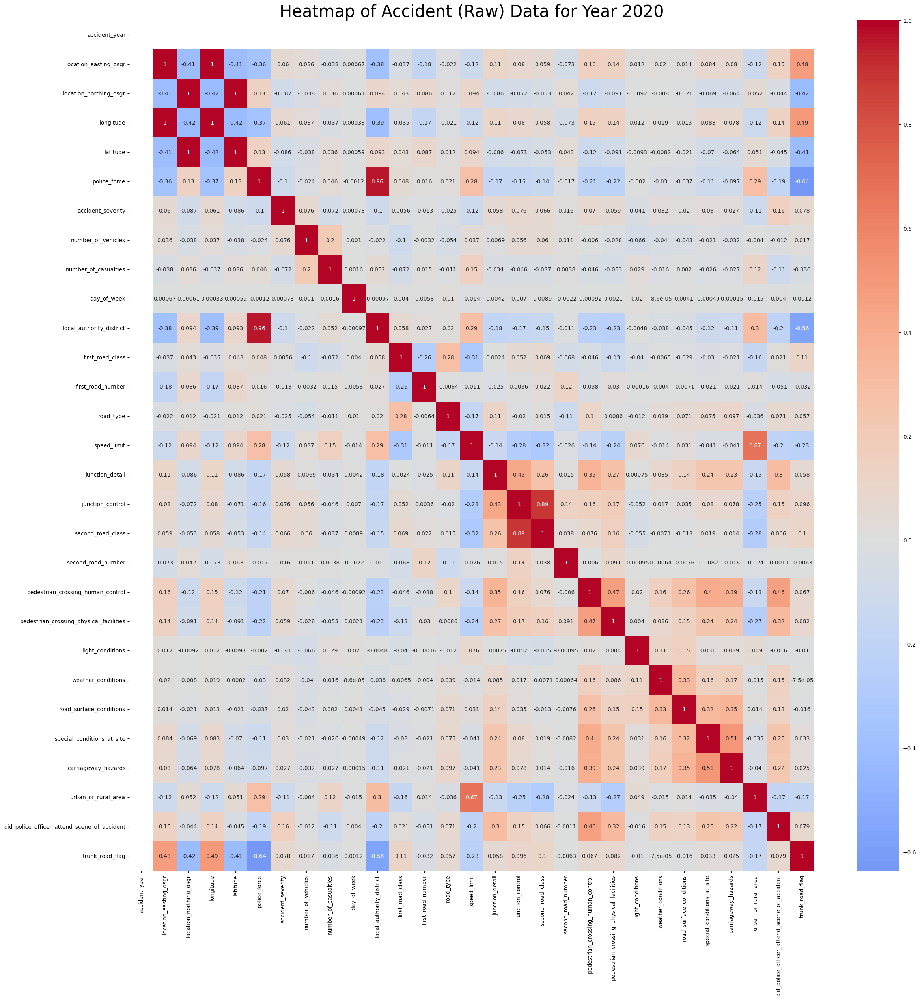

In [64]:
# Calculate the correlation matrix
corr_matrix = accident_df.corr()

# Create a heatmap using seaborn
plt.figure(figsize=(28, 28))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", center=0)
plt.title("Heatmap of Accident (Raw) Data for Year 2020", fontsize=30)
plt.grid(False)
plt.show()

The heatmap provided indicates that there is generally a low correlation between most variables within the accident dataset for year 2020.

### Heatmap of the Numerical (Raw) Data: Vehicle Data for Year 2020

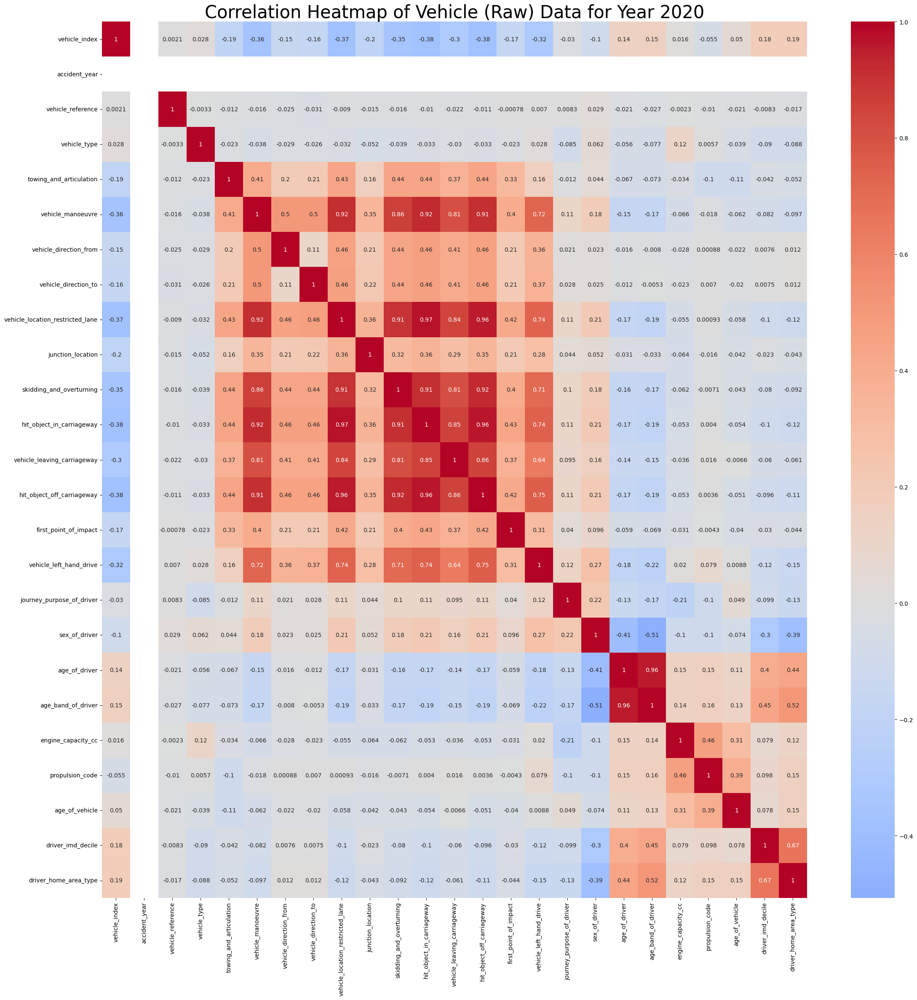

In [65]:
# Calculate the correlation matrix
corr_matrix = vehicle_df.corr()

# Create a heatmap using seaborn
plt.figure(figsize=(27, 27))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", center=0)
plt.title("Correlation Heatmap of Vehicle (Raw) Data for Year 2020", fontsize=30)
plt.grid(False)
plt.show()

The heatmap provided indicates that there is generally a strong correlation between some variables within the vehicle dataset for year 2020.

### Heatmap of the Numerical (Raw) Data: Casualty Data for Year 2020

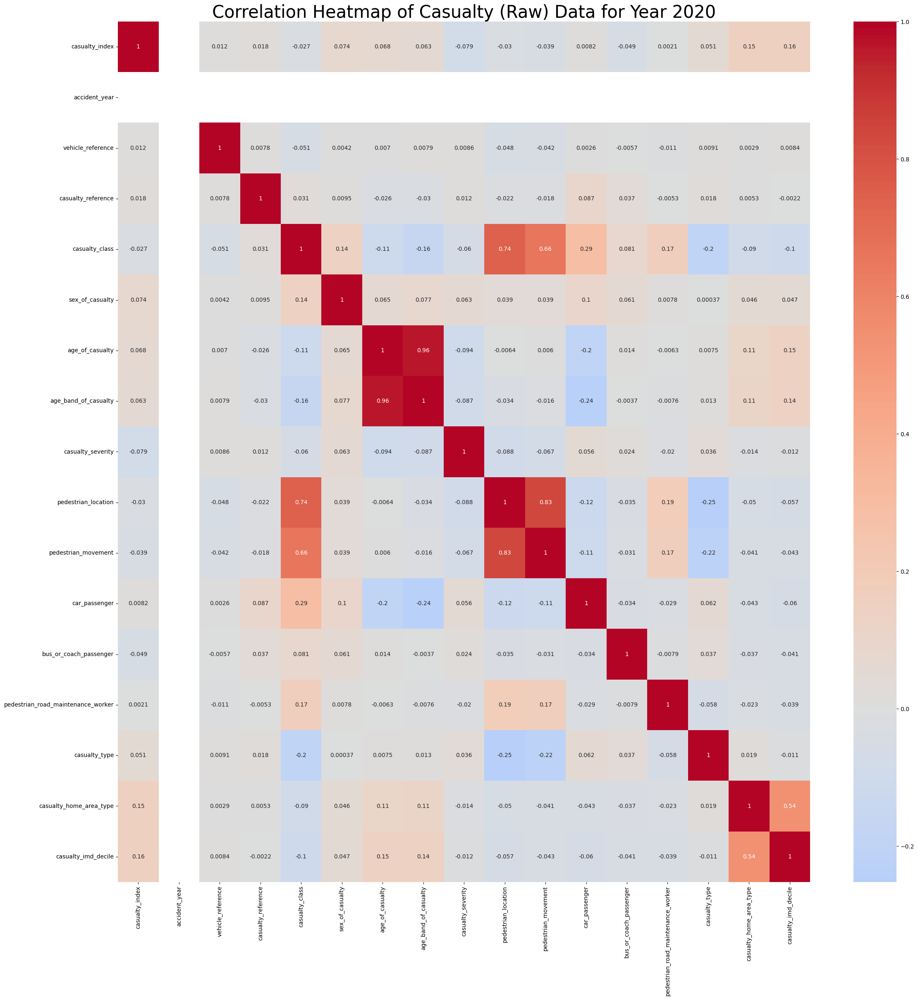

In [66]:
# Calculate the correlation matrix
corr_matrix = casualty_df.corr()

# Create a heatmap using seaborn
plt.figure(figsize=(27, 27))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", center=0)
plt.title("Correlation Heatmap of Casualty (Raw) Data for Year 2020", fontsize=30)
plt.grid(False)
plt.show()

The heatmap provided indicates that there is generally a weak correlation between variables within the casualty dataset for year 2020.

## Data Cleaning: Treating null or missing values in the accident table for accident_year 2020 

In [67]:
# Checks for columns having null or missing values in accident table for accident year 2020
rows_with_null_values = accident_df[accident_df.isnull().any(axis=1)]   
rows_with_null_values

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location
25520,2020052002442,2020,052002442,NaN,NaN,NaN,NaN,5,2,2,...,0,1,1,1,0,0,3,1,2,-1
29452,2020070769852,2020,070769852,NaN,NaN,NaN,NaN,7,3,2,...,0,1,1,1,0,0,3,1,2,-1
32689,2020122001194,2020,122001194,NaN,NaN,NaN,NaN,12,3,2,...,0,1,2,2,0,0,3,1,2,-1
33578,2020137330369,2020,137330369,NaN,NaN,NaN,NaN,13,3,2,...,0,1,1,1,0,0,3,1,1,-1
81252,2020522005114,2020,522005114,NaN,NaN,NaN,NaN,52,3,3,...,0,7,1,1,0,0,3,1,2,-1
86437,2020622001016,2020,622001016,NaN,NaN,NaN,NaN,62,3,2,...,5,4,1,1,0,0,3,1,-1,-1
86642,202063A017520,2020,63A017520,NaN,NaN,NaN,NaN,63,3,2,...,0,1,9,-1,0,0,3,2,-1,-1
86651,202063A018920,2020,63A018920,NaN,NaN,NaN,NaN,63,3,2,...,0,1,9,1,0,0,3,2,-1,-1
86668,202063A025020,2020,63A025020,NaN,NaN,NaN,NaN,63,3,2,...,0,1,2,2,0,0,3,2,-1,-1
86705,202063A035620,2020,63A035620,NaN,NaN,NaN,NaN,63,3,1,...,0,1,1,1,0,0,3,2,-1,-1


According to the given information, there are 14 rows (25520, 29452, 32689, 33578, 81252, 86437, 86642, 86651, 86668, 86705, 86785, 87018, 87030, 87296)  having null or missing values in location_easting_osgr column. These rows also have null or missing values in location_northing_osgr, longitude and latitude. Further investigation shall be conducted for resolution.

### checks for rows having "-1" entries in relevant columns for our analysis

In [68]:
# checks for rows having "-1" entries in location_easting_osgr column

accident_df[accident_df["location_easting_osgr"] == -1]

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location


In [69]:
# checks for rows having "-1" entries in location_northing_osgr column

accident_df[accident_df["location_northing_osgr"] == -1]

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location


In [70]:
# checks for rows having "-1" entries in longitude column

accident_df[accident_df["longitude"] == -1]

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location


In [71]:
# checks for rows having "-1" entries in latitude column

accident_df[accident_df["latitude"] == -1]

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location


In [72]:
# checks for rows having -1 entries in "time" column
accident_df[accident_df["time"] == "-1"]

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location


In [73]:
# checks for rows having -1 entries in "date" column
accident_df[accident_df["date"] == "-1"]

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location


In [74]:
# checks for rows having -1 entries in "vehicle_type" column
vehicle_df[vehicle_df["vehicle_type"] == -1]

,vehicle_index,accident_index,accident_year,accident_reference,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,...,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type


In [75]:
# checks for rows having -1 entries in "casualty_class" column
casualty_df[casualty_df["casualty_class"] == -1]

,casualty_index,accident_index,accident_year,accident_reference,vehicle_reference,casualty_reference,casualty_class,sex_of_casualty,age_of_casualty,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile


### View the Summary Statistics of the Columns having Missing Values 

In [76]:
# summary statistics of location_northing_osgr, location_easting_osgr, longitude, and latitude columns 
accident_df.describe(include = "float")

,location_easting_osgr,location_northing_osgr,longitude,latitude
count,91185.000000,9.118500e+04,91185.000000,91185.000000
mean,456487.876416,2.737645e+05,-1.189258,52.351073
std,93512.711807,1.473516e+05,1.367786,1.327573
min,65947.000000,1.271500e+04,-7.497375,49.970479
25%,392890.000000,1.745690e+05,-2.107789,51.457237
50%,465545.000000,2.085990e+05,-1.046912,51.763385
75%,530168.000000,3.783660e+05,-0.125238,53.297386
max,655138.000000,1.184351e+06,1.756257,60.541144


According to the information provided, the location_easting_osgr column has a minimum value of 65947, maximum value of 655138, mean value of 456487.876416, and standard deviation of 93512.711807. The location_northing_osgr columns has a minimum value of 1.271500e+04, maximum value of 1.184351e+06, mean value of 2.737645e+05, and standard deviation of 1.473516e+05. The longitude column has a minimum value of -7.497375, maximum value of 1.756257, mean value of -1.189258, and standard deviation of 1.367786. The latitude column has a minimum value of 49.970479, maximum value of 60.541144, mean value of 52.351073, and standard deviation of 1.327573. In general, it is evidential there are outliers in these columns. 

### Determine the Distribution in the Columns having Missing Values 

### Distribution of location_easting_osgr column

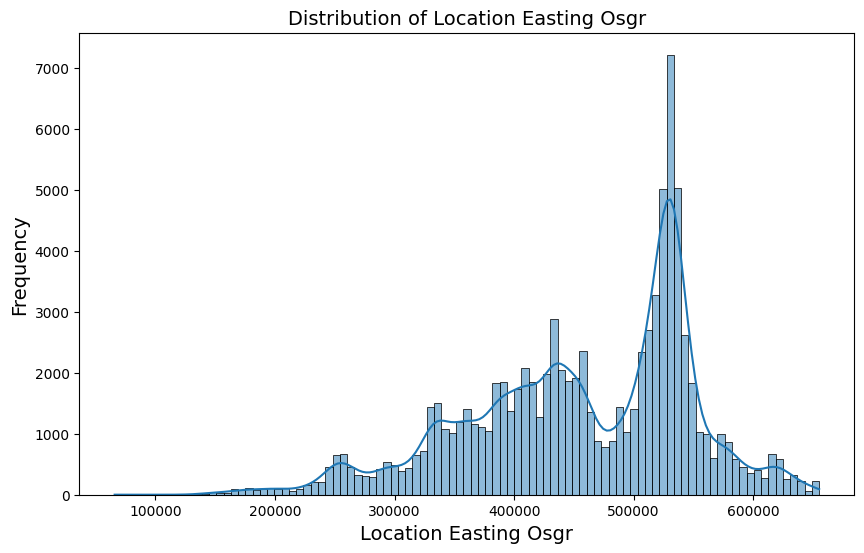

In [77]:
# histogram plot of loccation_easting_osgr (indicating density plot)

# Set the figure size before creating the plot
plt.figure(figsize=(10, 6))  # Set width=10 inches, height=6 inches

# create the seaborn plot
sns.histplot(accident_df, x="location_easting_osgr", kde=True)

# Add labels and title
plt.xlabel('Location Easting Osgr', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.title('Distribution of Location Easting Osgr', fontsize=14)
plt.grid(False)
# Show the plot
plt.show()

According to the chart provided, the distribution of data in the location_easting_osgr column is left skewed, and not normally distributed. 

### Distribution of location_northing_osgr column

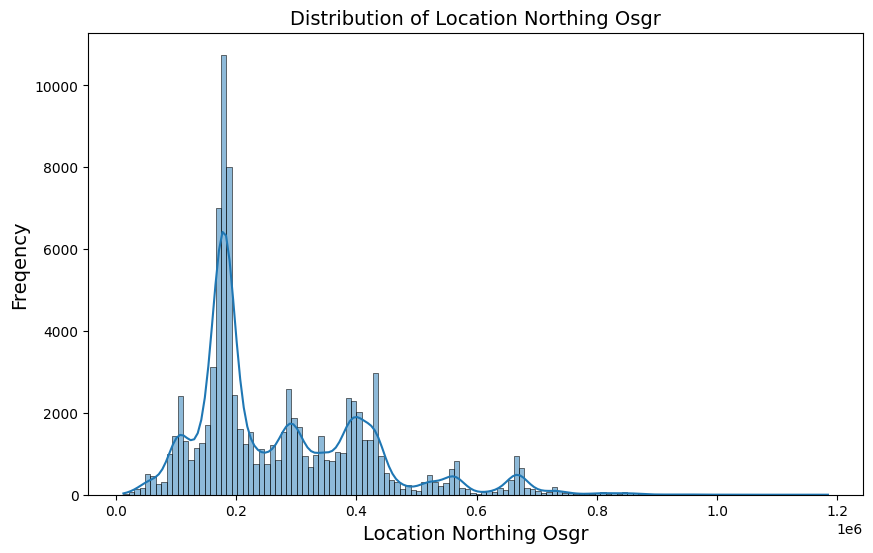

In [78]:
# histogram plot of location_northing_osgr (indicating density plot)

# Set the figure size before creating the plot
plt.figure(figsize=(10, 6))  # Set width=10 inches, height=6 inches

# create the seaborn plot
sns.histplot(accident_df, x="location_northing_osgr", kde=True)

# Add labels and title
plt.xlabel('Location Northing Osgr', fontsize=14)
plt.ylabel('Freqency', fontsize=14)
plt.title('Distribution of Location Northing Osgr', fontsize=14)
plt.grid(False)

# Show the plot
plt.show()

According to the chart provided, the distribution of data in the location_northing_osgr column is right skewed, and not normally distributed. 

### Distribution of longitude column

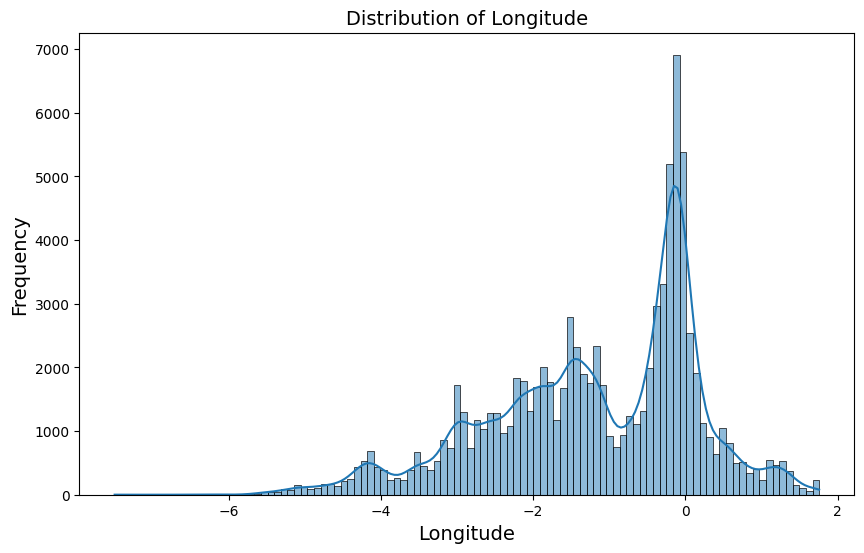

In [79]:
# histogram plot of longitude (indicating density plot)

# Set the figure size before creating the plot
plt.figure(figsize=(10, 6))  # Set width=10 inches, height=6 inches

# create the seaborn plot
sns.histplot(accident_df, x="longitude", kde=True)

# Add labels and title
plt.xlabel('Longitude', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.title('Distribution of Longitude', fontsize=14)
plt.grid(False)

# Show the plot
plt.show()

According to the given chart, the distribution of data in the longitude column is left skewed, and not normally distributed.

### Distribution of latitude column

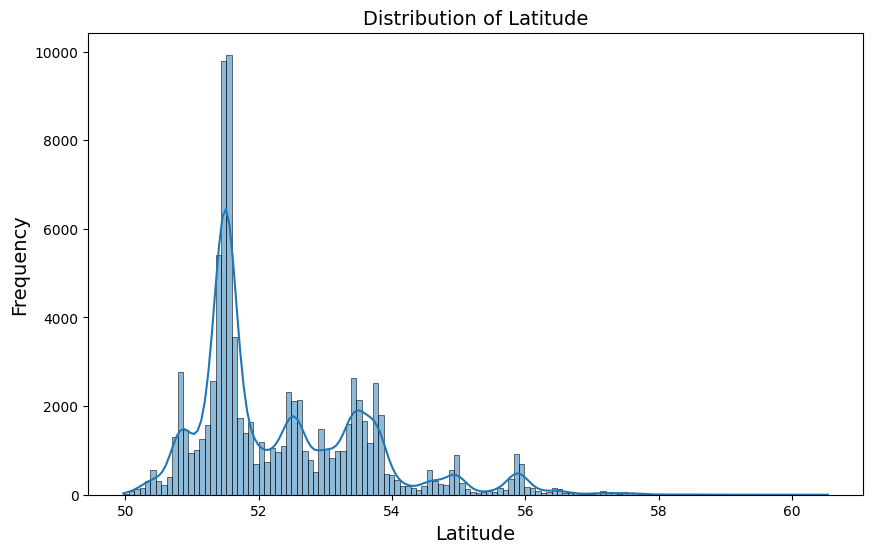

In [80]:
# histogram plot of latitude (indicating density plot)

# Set the figure size before creating the plot
plt.figure(figsize=(10, 6))  # Set width=10 inches, height=6 inches

# create the seaborn plot
sns.histplot(accident_df, x="latitude", kde=True)

# Add labels and title
plt.xlabel('Latitude', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.title('Distribution of Latitude', fontsize=14)
plt.grid(False)

# Show the plot
plt.show()

According to the chart provided, the distribution of data in the latitude column is right skewed, and not normally distributed. 

Summary;
- Consequent to the distribution (non-symmetrical) of data in the columns having missing values, we shall replace the null or missing values in these columns with the median, because the median is less affected by outliers and skewed data than the mean, and is usually the preferred measure of central tendency when the distribution is not symmetrical (Wise-Answer, 2020). 

### Replacing null or missing values in the accident table of accident_year 2020 

In [81]:
# replacing null or missing values in "location_easting_osgr" with median 
accident_df["location_easting_osgr"].fillna(accident_df["location_easting_osgr"].median(), inplace=True)

In [82]:
# replacing null or missing values in "location_northing_osgr" with median
accident_df["location_northing_osgr"].fillna(accident_df["location_northing_osgr"].median(), inplace=True)

In [83]:
# replacing null or missing values in "longitude" with median
accident_df["longitude"].fillna(accident_df["longitude"].median(), inplace=True)

In [84]:
# replacing null or missing values in "location_easting_osgr" with median
accident_df["latitude"].fillna(accident_df["latitude"].median(), inplace=True)

In [85]:
# sanity checks for null or missig values 
accident_df.isnull().sum()

accident_index                                 0
accident_year                                  0
accident_reference                             0
location_easting_osgr                          0
location_northing_osgr                         0
longitude                                      0
latitude                                       0
police_force                                   0
accident_severity                              0
number_of_vehicles                             0
number_of_casualties                           0
date                                           0
day_of_week                                    0
time                                           0
local_authority_district                       0
local_authority_ons_district                   0
local_authority_highway                        0
first_road_class                               0
first_road_number                              0
road_type                                      0
speed_limit         

According to the given information, the null or missing values in the accident table for accident_year 2020 has been treated.

## Exploratory Data Analysis (EDA) and Data Visualisation: Visualisation of Some Important Columns (Features) in the Accident Table (Cleaned Data) for Accident_Year 2020

### Summary statistics of the accident table for accident_year 2020


In [86]:
# Summary statistics of the accident table for accident_year 2020
accident_df.describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
accident_index,91199,91199,2020010219808,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
accident_year,91199.0,NaN,NaN,NaN,2020.0,0.0,2020.0,2020.0,2020.0,2020.0,2020.0
accident_reference,91199,91199,010219808,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
location_easting_osgr,91199.0,NaN,NaN,NaN,456489.266779,93505.60119,65947.0,392900.5,465545.0,530167.0,655138.0
location_northing_osgr,91199.0,NaN,NaN,NaN,273754.492648,147342.4574,12715.0,174573.5,208599.0,378343.5,1184351.0
longitude,91199.0,NaN,NaN,NaN,-1.189236,1.367682,-7.497375,-2.107417,-1.046912,-0.125277,1.756257
latitude,91199.0,NaN,NaN,NaN,52.350983,1.327491,49.970479,51.457259,51.763385,53.297063,60.541144
police_force,91199.0,NaN,NaN,NaN,27.488043,24.548964,1.0,4.0,22.0,45.0,99.0
accident_severity,91199.0,NaN,NaN,NaN,2.768232,0.456682,1.0,3.0,3.0,3.0,3.0
number_of_vehicles,91199.0,NaN,NaN,NaN,1.835272,0.677272,1.0,1.0,2.0,2.0,13.0


According to the summary statistics presented, the dataset (cleaned) reveals various mean values for different variables. Specifically:

- The mean police force code is approximately 27.488043.
- The mean accident severity is approximately 2.768232.
- The mean number of vehicles involved in accidents is approximately 1.835272.
- The mean number of casualties (injuries or fatalities) is approximately 1.267382.
- The mean day of the week for accidents is approximately 4.121558, etc. These values remains constant, except the values in the location_easting_osgr, location_northing_osgr, longitude, and latitude columns due to the treated null or missing values in these columns. 



# Analysing of some features in the RTA data for year 2020

### Police Force

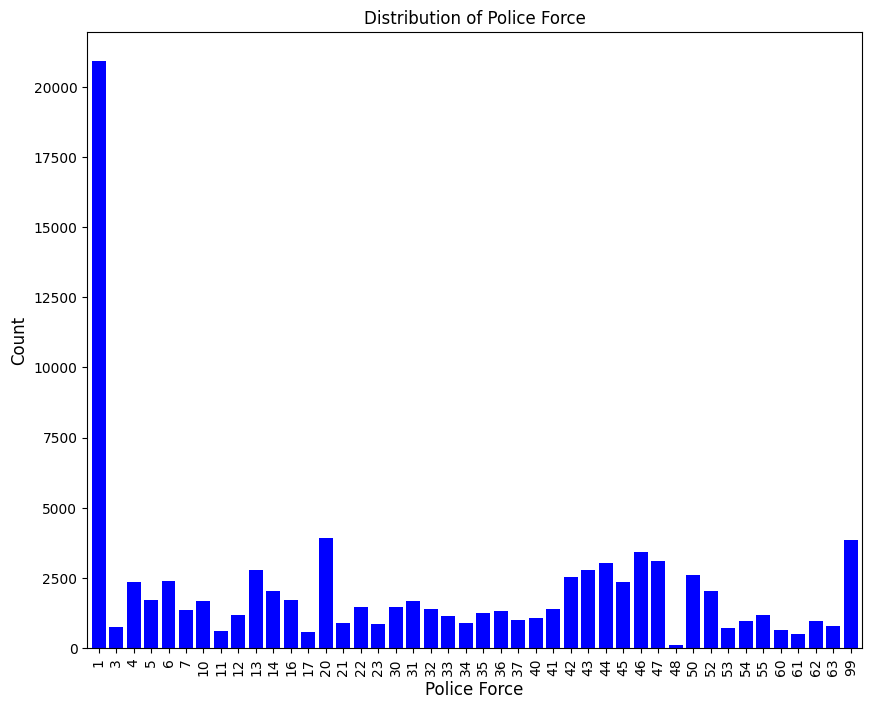

In [87]:
# Countplot of Police Force  

# get the series of unique values of police force 
police_force = accident_df["police_force"].value_counts().sort_index()

# Set up the figure and axis
fig, ax = plt.subplots(figsize=(10, 8))

# Define the bar width 
bar_width = 0.8

# Plot the bar chart with the counts of police force
police_force.plot(kind='bar', color='blue', width=bar_width)

# Add labels and title
plt.xlabel('Police Force', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Distribution of Police Force')

# Show the plot
plt.show()

According to the chart provided, Most accidents (20906) occurred at police force code number '1' (Metropolitan Police) area. 

In [88]:
# counts of series of unique values in the police force column
accident_df["police_force"].value_counts()

1     20906
20     3933
99     3836
46     3405
47     3107
44     3016
43     2767
13     2764
50     2616
42     2536
6      2399
4      2354
45     2334
52     2044
14     2021
5      1717
16     1709
10     1690
31     1677
30     1462
22     1446
41     1398
32     1396
7      1363
36     1324
35     1246
12     1180
55     1158
33     1133
40     1084
37      995
54      961
62      958
34      886
21      879
23      855
63      771
3       755
53      695
60      658
11      601
17      570
61      487
48      107
Name: police_force, dtype: int64

In [89]:
# To calculate the percentage of police force column
# Find the total number of rows in the accident (dataset)
total_rows = len(accident_df)

# Count the occurrences of each category in the police force column
counts = accident_df['police_force'].value_counts()

# Calculate the percentage for each category (police force)
percentage_df = (counts / total_rows) * 100

# Round the percentage values to a specific number of decimal places
percentage_df = percentage_df.round(2)

# Display the percentage DataFrame 'police force'
print(percentage_df)

1     22.92
20     4.31
99     4.21
46     3.73
47     3.41
44     3.31
43     3.03
13     3.03
50     2.87
42     2.78
6      2.63
4      2.58
45     2.56
52     2.24
14     2.22
5      1.88
16     1.87
10     1.85
31     1.84
30     1.60
22     1.59
41     1.53
32     1.53
7      1.49
36     1.45
35     1.37
12     1.29
55     1.27
33     1.24
40     1.19
37     1.09
54     1.05
62     1.05
34     0.97
21     0.96
23     0.94
63     0.85
3      0.83
53     0.76
60     0.72
11     0.66
17     0.63
61     0.53
48     0.12
Name: police_force, dtype: float64


According to the given information, the police force '1' (Metropolitan Police) had the highest number (aproximately 22.92%) of accident cases, then followed by police force '2' (Cumbria) which had approximately 4.31% of accident cases.  

###  Accident Severity 

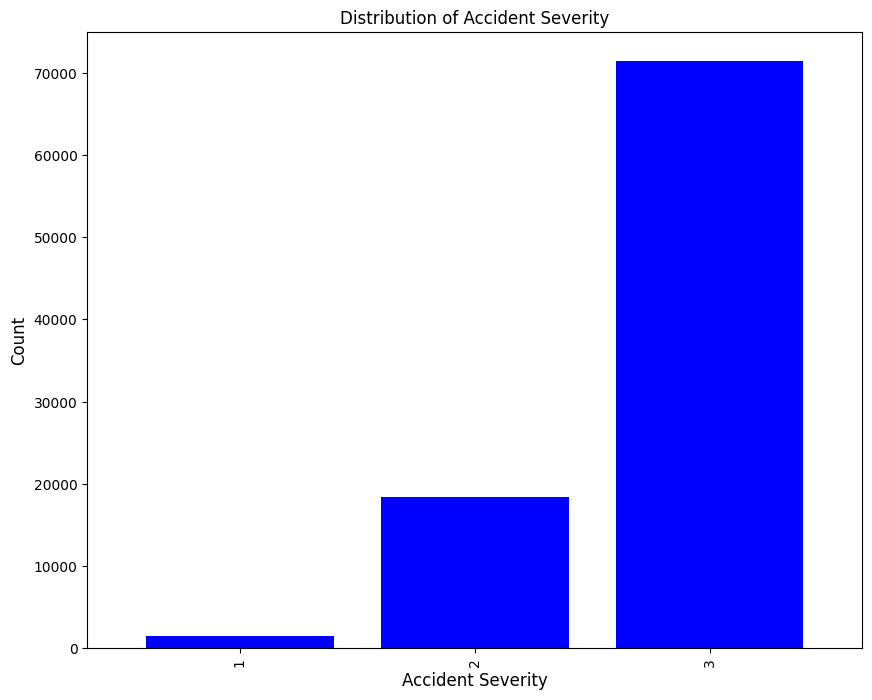

In [90]:
# Countplot of Accident Severity 

# get the series of unique values of accident severity 
accident_severity = accident_df["accident_severity"].value_counts().sort_index()

# Set up the figure and axis
fig, ax = plt.subplots(figsize=(10, 8))

# Define the bar width 
bar_width = 0.8

# Plot the bar chart with the counts of accident severity
accident_severity.plot(kind='bar', color='blue', width=bar_width)

# Add labels and title
plt.xlabel('Accident Severity', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Distribution of Accident Severity')

# Show the plot
plt.show()

According to the chart priovided, the modal value of the accident severity is 71453, representing '3' (slight). This implies that accidents in accident_year 2020 resulted in mostly slight cases

. 

In [91]:
# count of series of unique values in accident severity column 
accident_df["accident_severity"].value_counts()

3    71453
2    18355
1     1391
Name: accident_severity, dtype: int64

In [92]:
# To calculate the percentage of accident severity column
# Find the total number of rows in the accident (dataset)
total_rows = len(accident_df)

# Count the occurrences of each category in the accident severity column
counts = accident_df['accident_severity'].value_counts()

# Calculate the percentage for each category (accident severity)
percentage_df = (counts / total_rows) * 100

# Round the percentage values to a specific number of decimal places
percentage_df = percentage_df.round(2)

# Display the percentage DataFrame 'accident severity'
print(percentage_df)

3    78.35
2    20.13
1     1.53
Name: accident_severity, dtype: float64


According to the provided information, the accident severity level '3', which represents 'slight', accounts for approximately 78.35% of the cases, making it the most common severity level. On the other hand, the accident severity level '1', representing 'fatal', has the lowest percentage at approximately 1.53%. This indicates that there are relatively few fatal cases resulting from accidents, while the majority of cases are categorized as 'slight'.

### Number of Vehicles

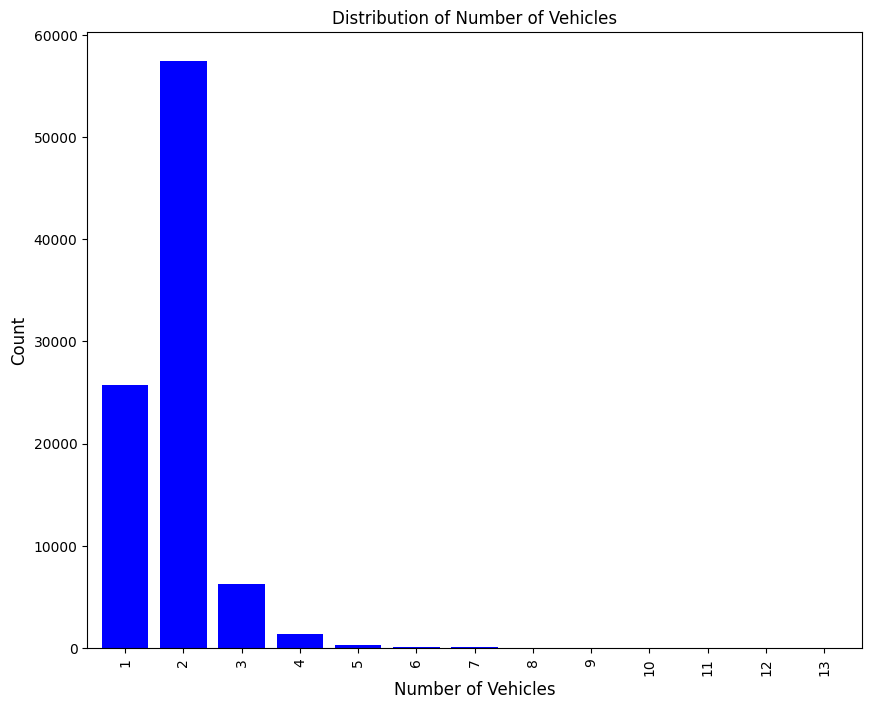

In [93]:
# get the series of unique values of number of vehicles 
number_of_vehicles = accident_df["number_of_vehicles"].value_counts().sort_index()

# Set up the figure and axis
fig, ax = plt.subplots(figsize=(10, 8))

# Define the bar width 
bar_width = 0.8

# Plot the bar chart with the counts of vehicles involved in accidents in year 2020
number_of_vehicles.plot(kind='bar', color='blue', width=bar_width)

# Add labels and title
plt.xlabel('Number of Vehicles', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Distribution of Number of Vehicles')

# Show the plot
plt.show()

According to the presented chart, it is evident that two vehicles were the most commonly involved in accidents during the year 2020.

In [94]:
# count of series of unique values in number of vehicles column 
accident_df["number_of_vehicles"].value_counts()

2     57392
1     25730
3      6241
4      1334
5       331
6        99
7        47
8        15
9         3
10        3
11        2
13        1
12        1
Name: number_of_vehicles, dtype: int64

In [95]:
# To calculate the percentage of number of vehicles column
# Find the total number of rows in the accident (dataset)
total_rows = len(accident_df)

# Count the occurrences of each category in the number of vehicles column
counts = accident_df['number_of_vehicles'].value_counts()

# Calculate the percentage for each category (number of vehicles)
percentage_df = (counts / total_rows) * 100

# Round the percentage values to a specific number of decimal places
percentage_df = percentage_df.round(2)

# Display the percentage DataFrame 'number of vehicles'
print(percentage_df)

2     62.93
1     28.21
3      6.84
4      1.46
5      0.36
6      0.11
7      0.05
8      0.02
9      0.00
10     0.00
11     0.00
13     0.00
12     0.00
Name: number_of_vehicles, dtype: float64


According to the given information, in the year 2020, two vehicles were involved in approximately 62.93% of all accidents, making them the most common scenario in terms of the total number of vehicles involved.

### Number of Casualties 

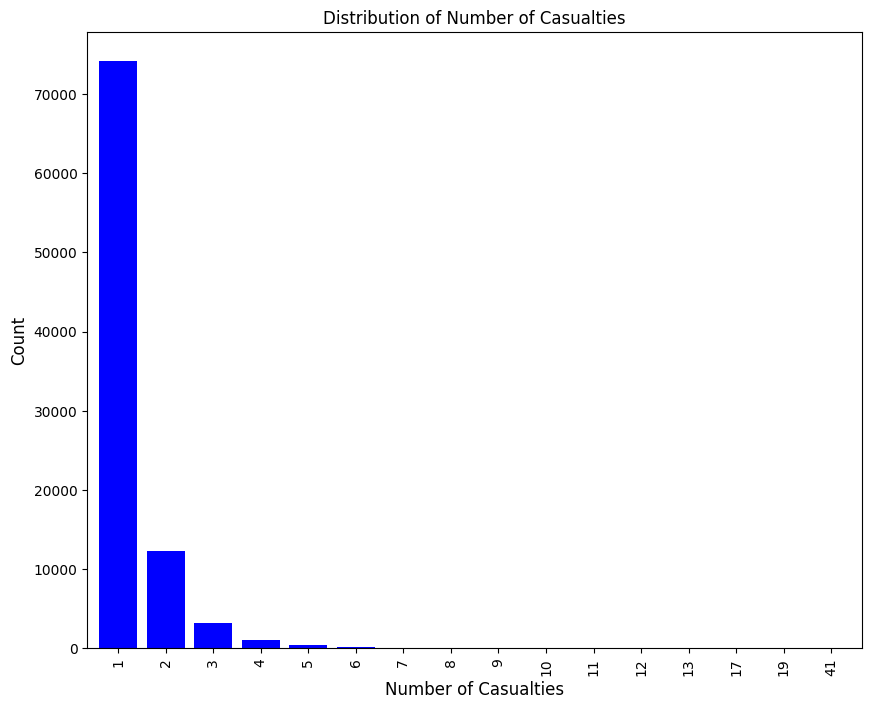

In [96]:
# get the series of unique values of number of casualties 
number_of_casualties = accident_df["number_of_casualties"].value_counts().sort_index()

# Set up the figure and axis
fig, ax = plt.subplots(figsize=(10, 8))

# Define the bar width 
bar_width = 0.8

# Plot the bar chart with the counts of casualties resulted from accidents in year 2020
number_of_casualties.plot(kind='bar', color='blue', width=bar_width)

# Add labels and title
plt.xlabel('Number of Casualties', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Distribution of Number of Casualties')
plt.grid(False)

# Show the plot
plt.show()

In [97]:
# counts od series of unique values in number of casualties column 
accident_df["number_of_casualties"].value_counts()

1     74161
2     12221
3      3214
4      1063
5       349
6       115
7        43
8        14
9         7
11        4
10        3
17        1
41        1
13        1
12        1
19        1
Name: number_of_casualties, dtype: int64

According to the given information, most accidents resulted in one casualty

### Sex of Driver

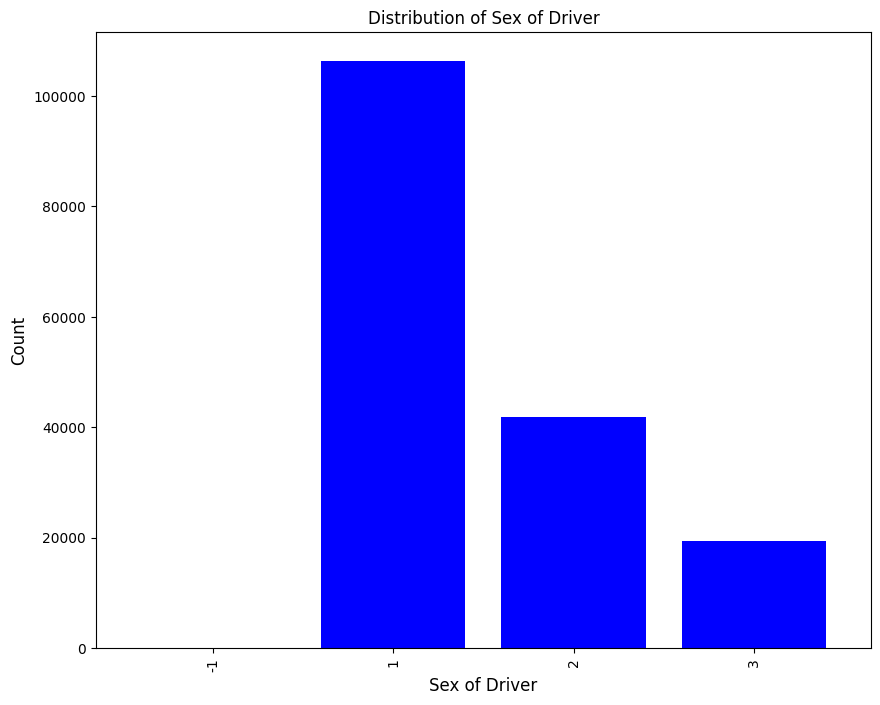

In [98]:
# get the series of unique values of sex of driver
sex_of_driver = vehicle_df["sex_of_driver"].value_counts().sort_index()

# Set up the figure and axis
fig, ax = plt.subplots(figsize=(10, 8))

# Define the bar width 
bar_width = 0.8

# Plot the bar chart with the counts of sex of driver in year 2020
sex_of_driver.plot(kind='bar', color='blue', width=bar_width)

# Add labels and title
plt.xlabel('Sex of Driver', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Distribution of Sex of Driver')
plt.grid(False)

# Show the plot
plt.show()

In [99]:
# counts of series of unique values in sex of driver column
vehicle_df["sex_of_driver"].value_counts()

 1    106240
 2     41820
 3     19302
-1        13
Name: sex_of_driver, dtype: int64

According to the information provided, males were mostly involved involved in accidents in year 2020, there are also 13 records of -1 in the sex of driver column

### Age of Driver

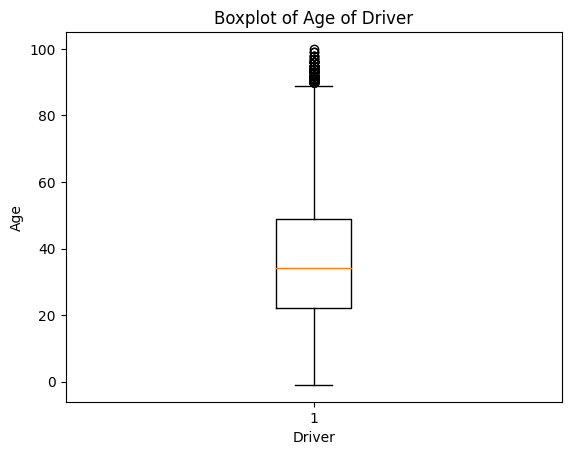

In [100]:
# Create a boxplot
plt.boxplot(vehicle_df["age_of_driver"])

# Add labels and title
plt.xlabel('Driver')
plt.ylabel('Age')
plt.title('Boxplot of Age of Driver')

# Display the plot
plt.show()

Based on the boxplot provided, there is a clear indication of ages which are above the norm.  

In [101]:
# count of series of unique values in age of driver column
vehicle_df["age_of_driver"].value_counts()

-1      23344
 30      5308
 29      3672
 28      3622
 25      3599
        ...  
 97         3
 98         3
 3          2
 99         2
 100        1
Name: age_of_driver, Length: 99, dtype: int64

According to the information provided, the modal speed limit of vehicles involved in accidents in year 2020 is 5308, and there are 23344 records of '-1'.

In [102]:
# check for unique values in age of driver column
vehicle_df["age_of_driver"].unique()

array([ 32,  45,  -1,  44,  20,  25,  41,  19,  26,  62,  37,  40,  33,
        51,  30,  18,  29,  24,  38,  77,  48,  50,  79,  42,  52,  22,
        31,  28,  57,  81,  59,  67,  34,  23,  54,  53,  27,  39,  56,
        43,  88,  35,  46,  16,  49,  21,  80,  66,  55,  47,  60,  36,
        58,  70,  71,  17,  85,  69,  61,  87,  73,  64,  65,  63,  83,
        78,  72,  68,  14,  82,  74,  75,  11,  76,  15,  86,  90,   9,
        10,  91,  84,  13,   8,  89,  93,  94,  92,   6,  12,   5,   4,
         7,  97,  95,   3,  98, 100,  99,  96], dtype=int64)

Referring to the provided details, it appears that the oldest driver involved in the accident is recorded as 100 years old. Additionally, there are instances of minors aged 13 and below being listed as drivers, which may indicate potential data entry errors or anomalies.

In [103]:
### Investigating records of age of driver of ages 13 and below
vehicle_df[vehicle_df["age_of_driver"]<=13]

,vehicle_index,accident_index,accident_year,accident_reference,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,...,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
2,681718,2020010228005,2020,010228005,1,9,0,18,-1,-1,...,6,3,-1,-1,-1,-1,-1,-1,-1,-1
11,681727,2020010228018,2020,010228018,2,9,0,2,0,0,...,6,3,-1,-1,1984,1,1,AUDI Q5,-1,-1
14,681730,2020010228022,2020,010228022,1,9,0,18,7,3,...,6,1,-1,-1,-1,-1,-1,-1,-1,-1
19,681735,2020010228031,2020,010228031,2,9,9,99,9,9,...,6,3,-1,-1,1229,1,8,VAUXHALL CORSA,-1,-1
21,681737,2020010228032,2020,010228032,2,9,0,2,0,0,...,6,3,-1,-1,1984,1,9,VOLKSWAGEN GOLF,-1,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
167302,849018,2020991012311,2020,991012311,2,19,0,2,0,0,...,6,3,-1,-1,2402,2,12,FORD TRANSIT,-1,-1
167340,849056,2020991016099,2020,991016099,2,9,0,2,0,0,...,6,3,-1,-1,-1,-1,-1,-1,-1,-1
167341,849057,2020991016099,2020,991016099,3,9,0,2,0,0,...,6,3,-1,-1,-1,-1,-1,-1,-1,-1
167342,849058,2020991016099,2020,991016099,4,9,0,2,0,0,...,6,3,-1,-1,-1,-1,-1,-1,-1,-1


According to the details provided, there are 24407 records of driver of ages 13 and below. 

###  Age of Casualty

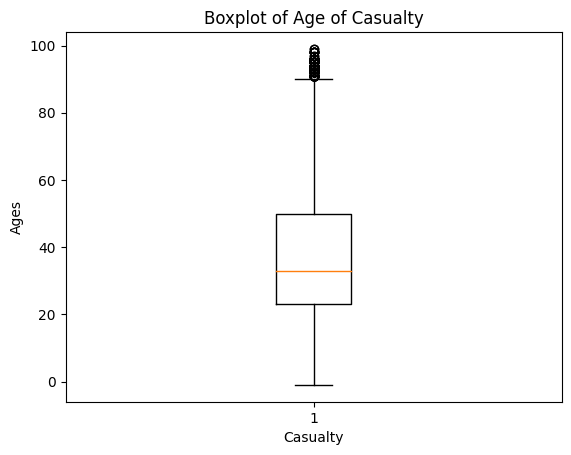

In [104]:
# Visualisation of age of casualty
# Create a boxplot
plt.boxplot(casualty_df["age_of_casualty"])

# Add labels and title
plt.xlabel('Casualty')
plt.ylabel('Ages')
plt.title('Boxplot of Age of Casualty')

# Display the plot
plt.show()

Based on the boxplot provided, there is a clear indication of ages which are above the norm.  

In [105]:
# count of series of unique values in age of casualty column
casualty_df["age_of_casualty"].value_counts()

30    3135
19    2881
20    2796
25    2749
26    2739
      ... 
94      17
96      13
98       7
99       2
97       2
Name: age_of_casualty, Length: 101, dtype: int64

According to the information provided, most casualties are of ages 30, and the least age of casualty is 2

In [106]:
# check for unique values in age of casualty column
casualty_df["age_of_casualty"].unique()

array([31,  2,  4, 23, 47, 32, 33, 25, 41, 50, 62, 37, -1, 20, 42, 30, 18,
       26, 29, 38, 39, 80, 19, 21, 48,  7, 79, 45, 27, 44, 51, 83, 52, 43,
       22, 59, 60, 77, 12, 54, 10, 40, 56, 24, 88, 11,  9, 35,  5,  3, 16,
       57, 67,  6, 49, 46, 53, 28, 69, 15, 76, 36, 55, 61, 85, 34,  8, 87,
       58, 73, 64, 65,  0, 78, 71, 14, 13, 17,  1, 68, 91, 66, 92, 74, 75,
       63, 70, 84, 86, 94, 72, 90, 81, 82, 89, 93, 96, 95, 98, 99, 97],
      dtype=int64)

According to the information provided, the minimum ages of casualty is 2 and the maximum age 99, there are also '-1' entries. 

### Sex of Casualty

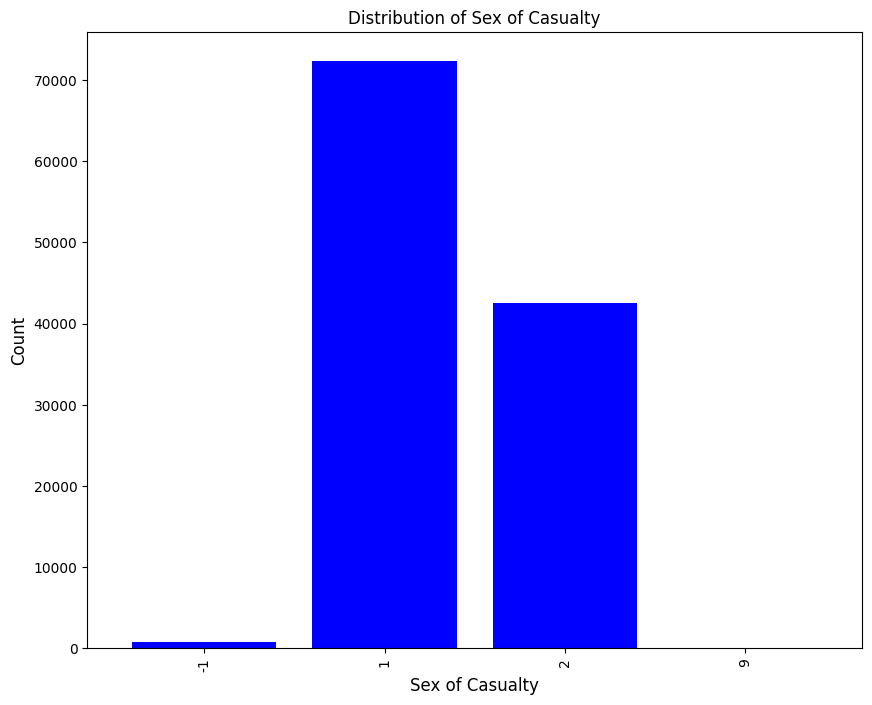

In [107]:
# get the series of unique values of sex of casualty
sex_of_casualty = casualty_df["sex_of_casualty"].value_counts().sort_index()

# Set up the figure and axis
fig, ax = plt.subplots(figsize=(10, 8))

# Define the bar width 
bar_width = 0.8

# Plot the bar chart with the counts of sex of casualty in year 2020
sex_of_casualty.plot(kind='bar', color='blue', width=bar_width)

# Add labels and title
plt.xlabel('Sex of Casualty', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Distribution of Sex of Casualty')
plt.grid(False)

# Show the plot
plt.show()

In [108]:
# count of series of unique values in sex of casualty column
casualty_df["sex_of_casualty"].value_counts()

 1    72335
 2    42488
-1      756
 9        5
Name: sex_of_casualty, dtype: int64

According to the information provided, males are the most casualties of accidents, there are '-1' entries, and 5 records are unknown(self reported).

In [109]:
# check for unique values in sex of casualty column
casualty_df["sex_of_casualty"].unique()

array([ 1,  2, -1,  9], dtype=int64)

###  Road Type

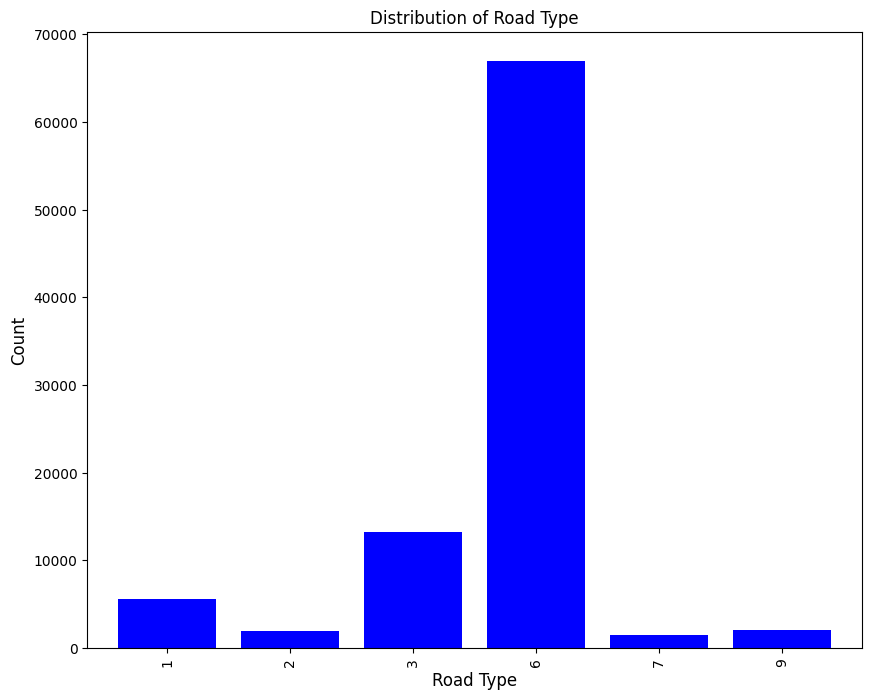

In [110]:
# get the series of unique values of road type
road_type = accident_df["road_type"].value_counts().sort_index()

# Set up the figure and axis
fig, ax = plt.subplots(figsize=(10, 8))

# Define the bar width 
bar_width = 0.8

# Plot the bar chart with the counts of road type in year 2020
road_type.plot(kind='bar', color='blue', width=bar_width)

# Add labels and title
plt.xlabel('Road Type', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Distribution of Road Type')
plt.grid(False)

# Show the plot
plt.show()

In [111]:
# count of series of unique values in road type column
accident_df["road_type"].value_counts()

6    66929
3    13206
1     5580
9     2006
2     1966
7     1512
Name: road_type, dtype: int64

According to the given information, most accidents (66929 records) occurred on single carriageway.

### Road Surface Conditions 

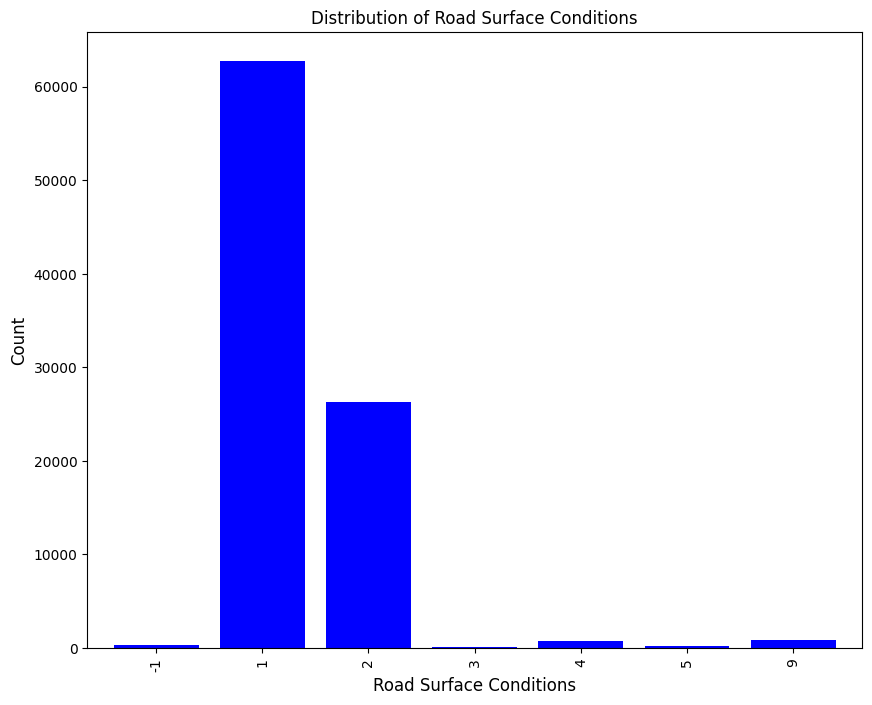

In [112]:
# get the series of unique values of road surface conditions
road_surface_conditions = accident_df["road_surface_conditions"].value_counts().sort_index()

# Set up the figure and axis
fig, ax = plt.subplots(figsize=(10, 8))

# Define the bar width 
bar_width = 0.8

# Plot the bar chart with the counts of road surface conditions in year 2020
road_surface_conditions.plot(kind='bar', color='blue', width=bar_width)

# Add labels and title
plt.xlabel('Road Surface Conditions', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Distribution of Road Surface Conditions')
plt.grid(False)

# Show the plot
plt.show()

In [113]:
# count of series of unique values 
accident_df["road_surface_conditions"].value_counts()

 1    62698
 2    26240
 9      847
 4      764
-1      316
 5      184
 3      150
Name: road_surface_conditions, dtype: int64

According to the given information, most accidents (62698 records) occurred on roads with oil or diesel. There also 316 '-1' entries. 

### Weather Conditions

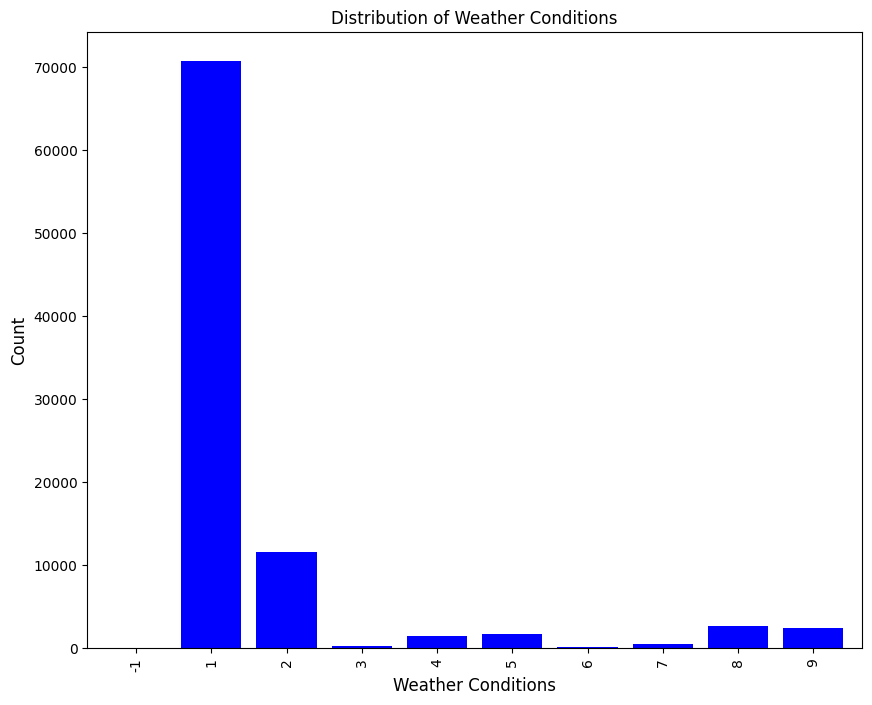

In [114]:
# get the series of unique values of weather conditions
weather_conditions = accident_df["weather_conditions"].value_counts().sort_index()

# Set up the figure and axis
fig, ax = plt.subplots(figsize=(10, 8))

# Define the bar width 
bar_width = 0.8

# Plot the bar chart with the counts of weather conditions in year 2020
weather_conditions.plot(kind='bar', color='blue', width=bar_width)

# Add labels and title
plt.xlabel('Weather Conditions', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Distribution of Weather Conditions')
plt.grid(False)

# Show the plot
plt.show()

In [115]:
# count of series of unique values in weather conditions column
accident_df["weather_conditions"].value_counts()

 1    70729
 2    11583
 8     2629
 9     2423
 5     1665
 4     1401
 7      510
 3      185
 6       73
-1        1
Name: weather_conditions, dtype: int64

Based on the details provided, most accidents (70729 records) occurred during fine with no high winds conditions. There is also one '-1' entry

### Light Conditions

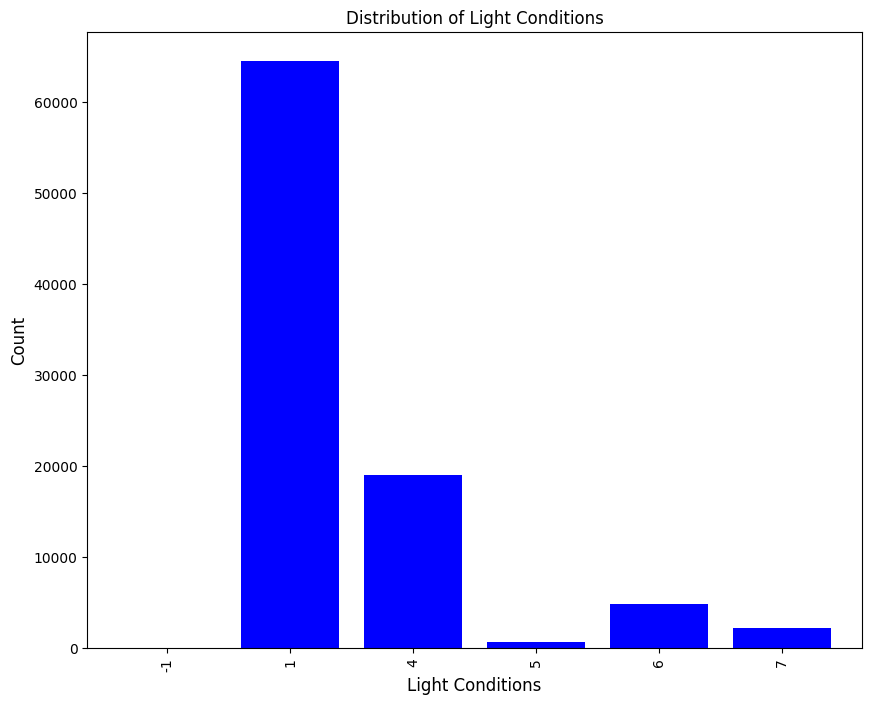

In [116]:
# get the series of unique values of light conditions
light_conditions = accident_df["light_conditions"].value_counts().sort_index()

# Set up the figure and axis
fig, ax = plt.subplots(figsize=(10, 8))

# Define the bar width 
bar_width = 0.8

# Plot the bar chart with the counts of light conditions in year 2020
light_conditions.plot(kind='bar', color='blue', width=bar_width)

# Add labels and title
plt.xlabel('Light Conditions', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Distribution of Light Conditions')
plt.grid(False)

# Show the plot
plt.show()

In [117]:
# Count of series of unique values in light condtions
accident_df["light_conditions"].value_counts()

 1    64458
 4    19026
 6     4835
 7     2194
 5      685
-1        1
Name: light_conditions, dtype: int64

According to the information provided, most accidents (64458 records) occurred in daylight, there is also one '-1' entry

### Vehicle Type


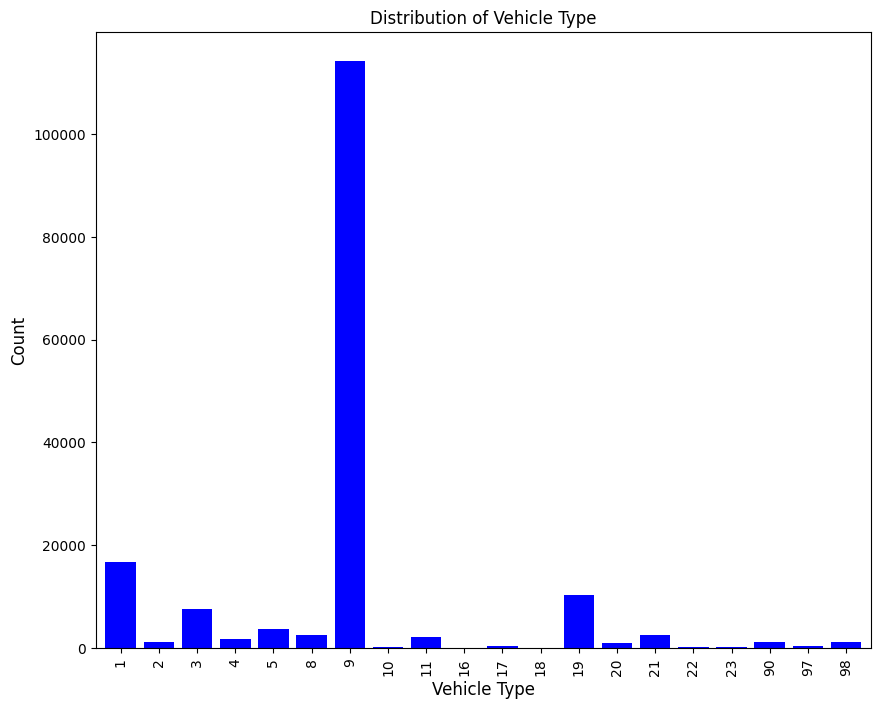

In [118]:
# get the series of unique values of vehicle type
vehicle_type = vehicle_df["vehicle_type"].value_counts().sort_index()

# Set up the figure and axis
fig, ax = plt.subplots(figsize=(10, 8))

# Define the bar width 
bar_width = 0.8

# Plot the bar chart with the counts of vehicle_type in year 2020
vehicle_type.plot(kind='bar', color='blue', width=bar_width)

# Add labels and title
plt.xlabel('Vehicle Type', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Distribution of Vehicle Type')
plt.grid(False)

# Show the plot
plt.show()

In [119]:
# count of series of unique values in vehicle type 
vehicle_df["vehicle_type"].value_counts()

9     114145
1      16766
19     10338
3       7523
5       3784
8       2612
21      2501
11      2213
4       1691
90      1185
2       1128
98      1072
20       898
97       478
17       435
10       225
22       189
23        93
16        90
18         9
Name: vehicle_type, dtype: int64

According to the details provided, most accidents involved cars 

### Junction Control

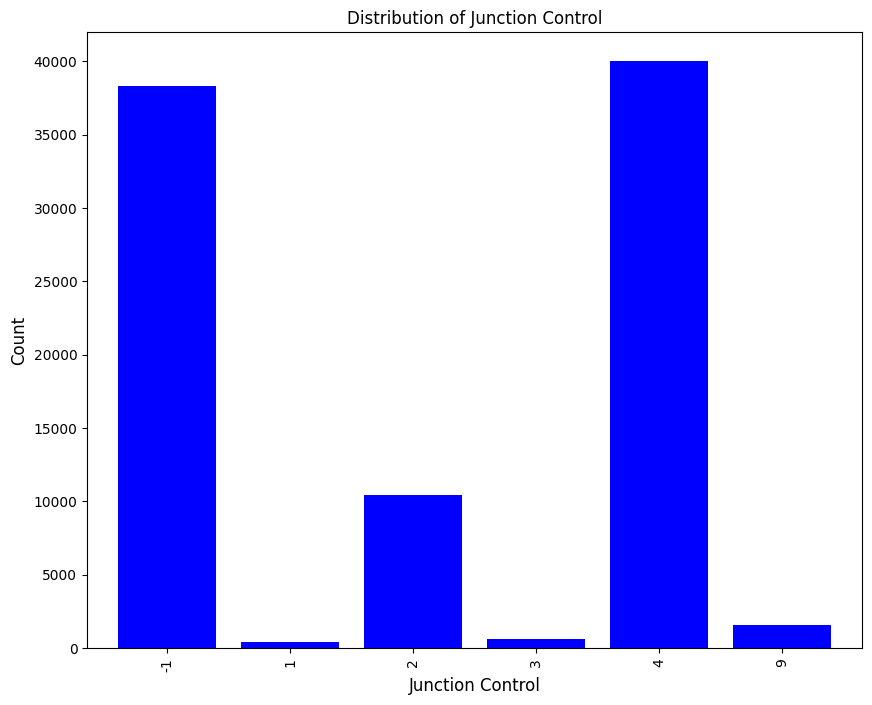

In [120]:
# get the series of unique values of junction control
junction_control = accident_df["junction_control"].value_counts().sort_index()

# Set up the figure and axis
fig, ax = plt.subplots(figsize=(10, 8))

# Define the bar width 
bar_width = 0.8

# Plot the bar chart with the counts of junction_control in year 2020
junction_control.plot(kind='bar', color='blue', width=bar_width)

# Add labels and title
plt.xlabel('Junction Control', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Distribution of Junction Control')
plt.grid(False)

# Show the plot
plt.show()

In [121]:
# count of series of unique values in junction control column
accident_df["junction_control"].value_counts()

 4    39998
-1    38298
 2    10407
 9     1536
 3      583
 1      377
Name: junction_control, dtype: int64

According to the information provided, most accident (39998 records) happened at 'Give way or uncontrolled' junctions. There are also 38298 '-1' entries

### Junction Detail 

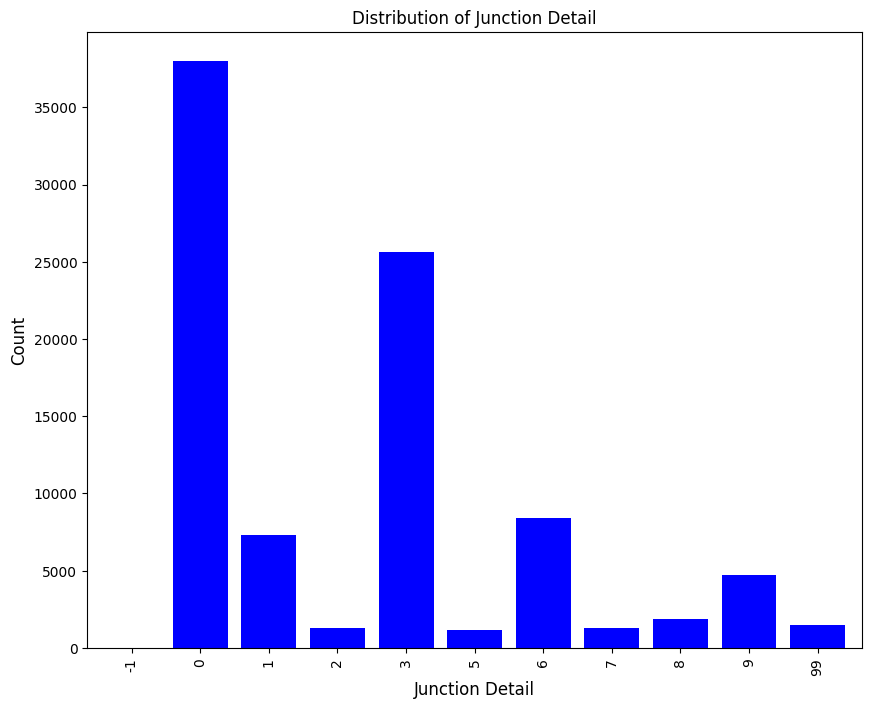

In [122]:
# get the series of unique values of junction detail
junction_detail = accident_df["junction_detail"].value_counts().sort_index()

# Set up the figure and axis
fig, ax = plt.subplots(figsize=(10, 8))

# Define the bar width 
bar_width = 0.8

# Plot the bar chart with the counts of junction_detail in year 2020
junction_detail.plot(kind='bar', color='blue', width=bar_width)

# Add labels and title
plt.xlabel('Junction Detail', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Distribution of Junction Detail')
plt.grid(False)

# Show the plot
plt.show()

In [123]:
# count of series of unique values in junction detail column
accident_df["junction_detail"].value_counts()

 0     37978
 3     25626
 6      8429
 1      7326
 9      4705
 8      1887
 99     1508
 2      1300
 7      1279
 5      1159
-1         2
Name: junction_detail, dtype: int64

According to the given information, there are 2 '-1' entries, and most accidents (37978 records) did not occur at junction or within 20 metres

### Casualty Class

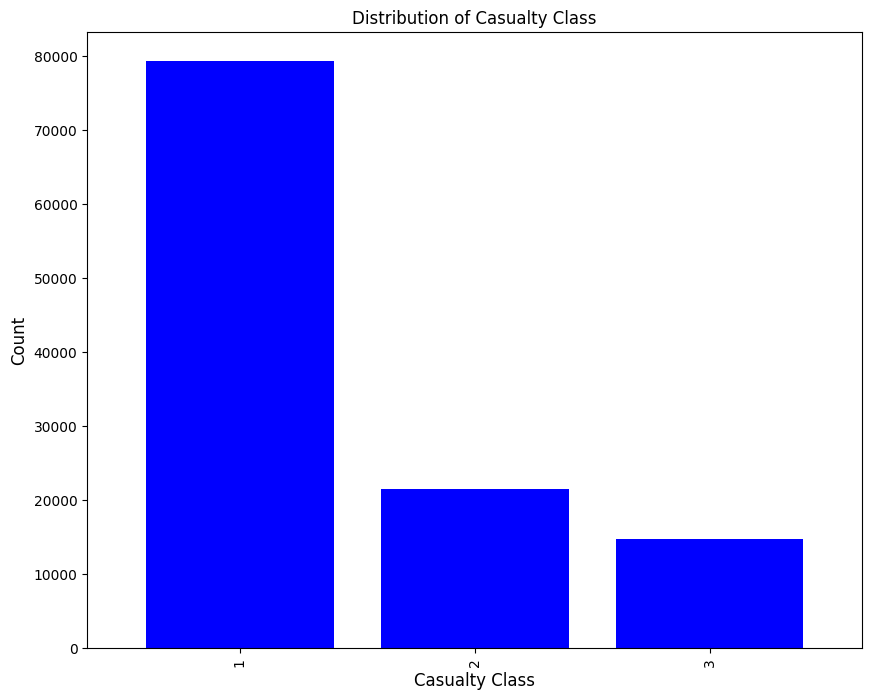

In [124]:
# get the series of unique values of casualty_class
casualty_class = casualty_df["casualty_class"].value_counts().sort_index()

# Set up the figure and axis
fig, ax = plt.subplots(figsize=(10, 8))

# Define the bar width 
bar_width = 0.8

# Plot the bar chart with the counts of casualty_class in year 2020
casualty_class.plot(kind='bar', color='blue', width=bar_width)

# Add labels and title
plt.xlabel('Casualty Class', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Distribution of Casualty Class')
plt.grid(False)

# Show the plot
plt.show()

In [125]:
# count of series if unique values in casualty class
casualty_df["casualty_class"].value_counts()

1    79330
2    21504
3    14750
Name: casualty_class, dtype: int64

According to the information provided, most accidents (79330 records) involved drivers or riders

### Urban or Rural Area

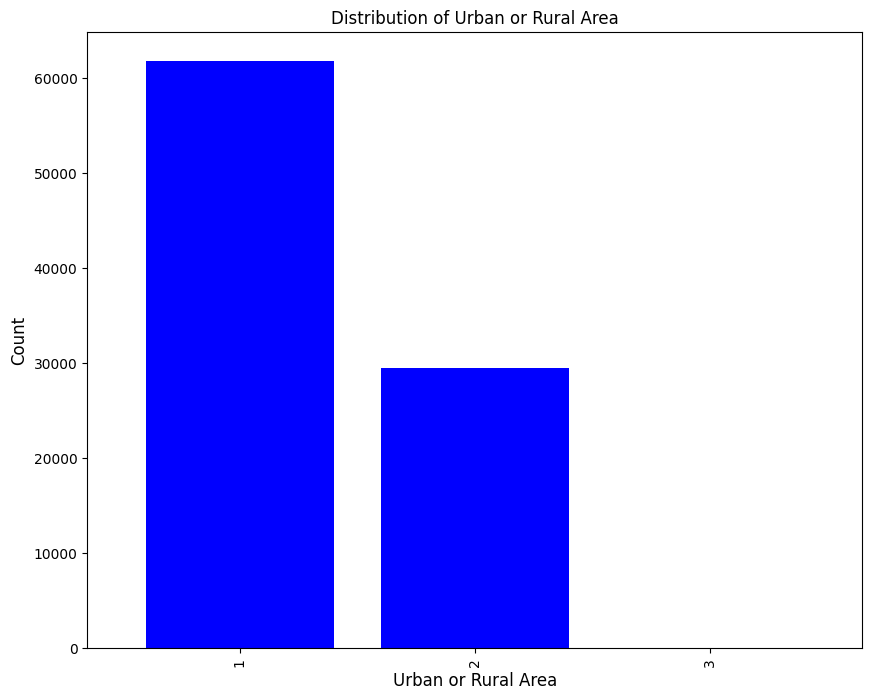

In [126]:
# get the series of unique values of urban_or_rural_area
urban_or_rural_area = accident_df["urban_or_rural_area"].value_counts().sort_index()

# Set up the figure and axis
fig, ax = plt.subplots(figsize=(10, 8))

# Define the bar width 
bar_width = 0.8

# Plot the bar chart with the counts of urban_or_rural_area in year 2020
urban_or_rural_area.plot(kind='bar', color='blue', width=bar_width)

# Add labels and title
plt.xlabel('Urban or Rural Area', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Distribution of Urban or Rural Area')
plt.grid(False)

# Show the plot
plt.show()

In [127]:
# count of series of unique values in Urban or Rural Area
accident_df["urban_or_rural_area"].value_counts()

1    61737
2    29448
3       14
Name: urban_or_rural_area, dtype: int64

Based on the given information, most accidents (61737 records) occurred in urban areas. There are also 14 unallocated areas.

### Casualty Severity

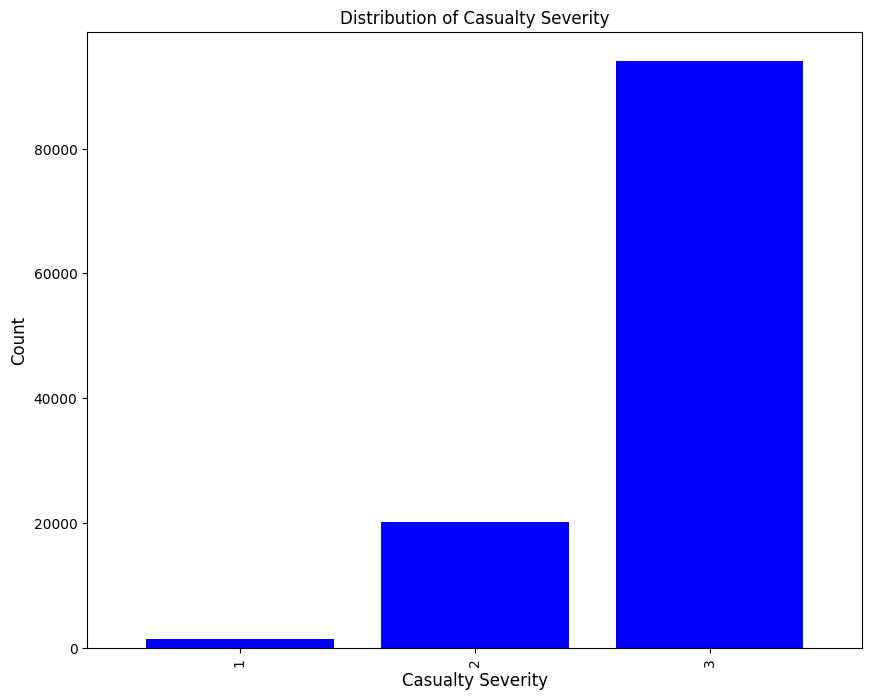

In [128]:
# get the series of unique values of casualty severity
casualty_severity = casualty_df["casualty_severity"].value_counts().sort_index()

# Set up the figure and axis
fig, ax = plt.subplots(figsize=(10, 8))

# Define the bar width 
bar_width = 0.8

# Plot the bar chart with the counts of casualty_severity in year 2020
casualty_severity.plot(kind='bar', color='blue', width=bar_width)

# Add labels and title
plt.xlabel('Casualty Severity', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Distribution of Casualty Severity')
plt.grid(False)

# Show the plot
plt.show()

In [129]:
# count of series of unique values in casualty severity 
casualty_df["casualty_severity"].value_counts()

3    94022
2    20102
1     1460
Name: casualty_severity, dtype: int64

According to the information provided, most casualty severity is 'slight injury' (94022 records) 

### Casualty Type


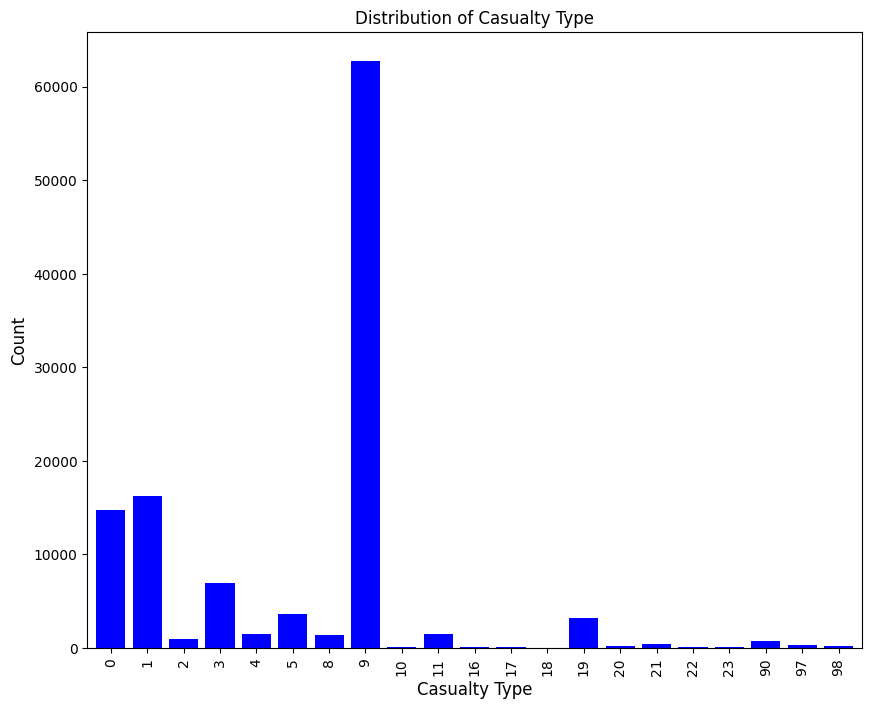

In [130]:
# get the series of unique values of casualty type
casualty_type = casualty_df["casualty_type"].value_counts().sort_index()

# Set up the figure and axis
fig, ax = plt.subplots(figsize=(10, 8))

# Define the bar width 
bar_width = 0.8

# Plot the bar chart with the counts of casualty_type in year 2020
casualty_type.plot(kind='bar', color='blue', width=bar_width)

# Add labels and title
plt.xlabel('Casualty Type', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title('Distribution of Casualty Type')
plt.grid(False)

# Show the plot
plt.show()

In [131]:
# count of series of unique values in casualty type
casualty_df["casualty_type"].value_counts()

9     62698
1     16294
0     14750
3      6993
5      3677
19     3235
4      1546
11     1506
8      1419
2      1001
90      695
21      447
97      301
20      263
98      209
22      155
10      138
23       86
16       86
17       82
18        3
Name: casualty_type, dtype: int64

According to the information provides, car occupants (approximately 62698) were involved in accidents 

# Data Analysis

## Question 1
## Are there significant hours of the day, and days of the week, on which accidents occur?

### Significant hours of the day on which accidents occur

In [132]:
# Convert the 'time' column to datetime data type
accident_df['time'] = pd.to_datetime(accident_df['time'])

In [133]:
# Extract the hour component from the 'time' column
accident_df['hour'] = accident_df['time'].dt.hour

In [134]:
# View the new 'hour' component
accident_df['hour']

0         9
1        13
2         1
3         1
4         2
         ..
91194    14
91195    15
91196    12
91197    14
91198    13
Name: hour, Length: 91199, dtype: int64

In [135]:
# Group the data by hour and count the number of accidents in each hour
hourly_accident_counts = accident_df.groupby('hour').size()

In [136]:
# View the grouped data 'hourly_accident_counts'
hourly_accident_counts.sort_index("desecending")

hour
0     1188
1      915
2      658
3      566
4      508
5      855
6     1830
7     3736
8     5267
9     3917
10    4173
11    4812
12    5395
13    5741
14    6245
15    7361
16    7381
17    7813
18    6618
19    5048
20    3715
21    3106
22    2555
23    1796
dtype: int64

In [137]:
# Find the hour with the most accidents
most_significant_hour = hourly_accident_counts.idxmax()

# Find the hour with the least accidents
least_significant_hour = hourly_accident_counts.idxmin()

In [138]:
# Display the results
print("Most significant hour of accidents:", most_significant_hour)
print("Least significant hour of accidents:", least_significant_hour)

Most significant hour of accidents: 17
Least significant hour of accidents: 4


Based on the data analysis, it is evident that the 17th hour of the day recorded the highest number of accidents, totaling 7813 incidents. This hour stands out as the peak hour for accidents based on the accident data for the year 2020. On the contrary, the 4th hour of the day had the least number of accidents, with a total of 508 incidents.

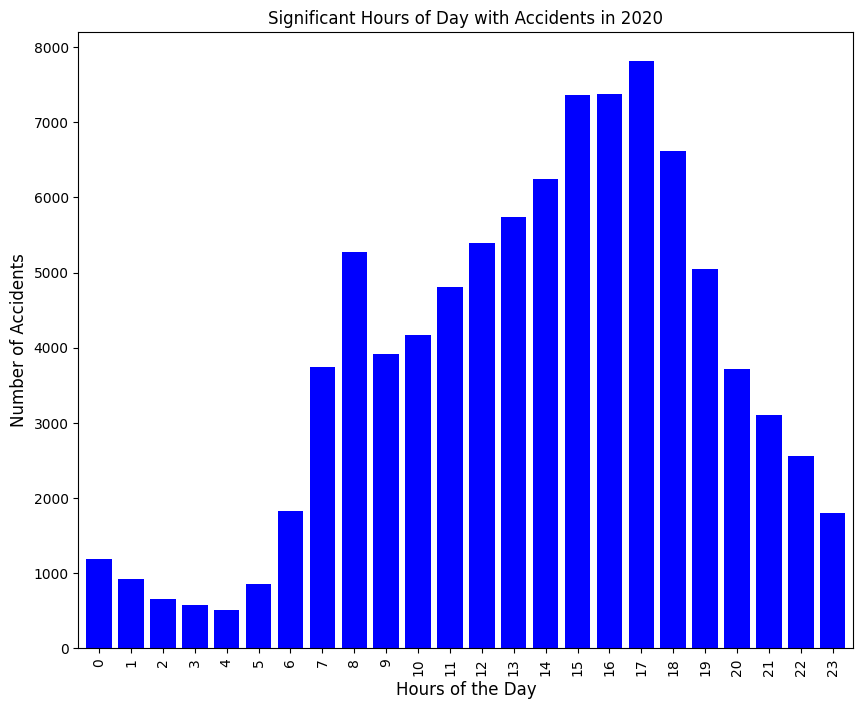

In [139]:
# plot of significant hours of the day on which accidents occur in accident year 2020

# Set up the figure and axis
fig, ax = plt.subplots(figsize=(10, 8))

# Define the bar width 
bar_width = 0.8

# Plot the bar chart with the counts of accidents in each hour
hourly_accident_counts.plot(kind='bar', color='blue', width=bar_width)

# Customize the plot as needed
plt.title('Significant Hours of Day with Accidents in 2020', fontsize=12)
plt.xlabel('Hours of the Day', fontsize=12)
plt.ylabel('Number of Accidents', fontsize=12)
plt.grid(False)
plt.show()

Based on the chart provided, we can deduce the following patterns:

Peak Hour: The data clearly shows that the 17th hour of the day experienced the highest number of accidents, making it the peak hour for accidents during the day. This hour appears to be the time with the most significant risk of accidents.

Low Accident Period: Between the 15th and 16th hours of the day, there is a noticeable decrease in the number of accidents. While the decrease may not be substantial, it indicates a relatively safer period with fewer accidents happening compared to the surrounding hours.

Decreasing Trend: The chart displays a decreasing trend in the number of accidents from around the 18th hour until the 4th hour of the day. This suggests that as the evening progresses into the late night and early morning hours, the frequency of accidents gradually decreases. These later hours generally experience fewer accidents compared to other parts of the day.

These observations provide valuable insights into the temporal patterns of accidents. The significant number of accidents during the peak hour highlights the importance of enhancing safety measures and traffic management during this time. Similarly, the comparatively lower accident counts during the late evening and early morning hours offer an opportunity to promote safe driving practices and raise awareness about road safety during periods of decreased traffic.

It is crucial for road safety stakeholders to consider these patterns while formulating strategies and interventions. By addressing the risk factors associated with the peak hour and promoting safety during the low accident period, it is possible to reduce the number of accidents, prevent injuries, and save lives on the roads.




 

### Significant days of the week on which accidents occur

In [140]:
# Group the data by day of the week and count the number of accidents on each day
accident_counts_by_day = accident_df['day_of_week'].value_counts()
accident_counts_by_day

6    14889
5    14056
4    13564
3    13267
2    12772
7    12336
1    10315
Name: day_of_week, dtype: int64

In [141]:
# Sort the data by the specified order
accident_counts_by_day = accident_counts_by_day.sort_index()
accident_counts_by_day

1    10315
2    12772
3    13267
4    13564
5    14056
6    14889
7    12336
Name: day_of_week, dtype: int64

In [142]:
# Find the day with the most accidents
most_significant_day = accident_counts_by_day.idxmax()

# Find the day with the least accidents
least_significant_day = accident_counts_by_day.idxmin()

# Display the results
print("Most significant day of the week with accidents:", most_significant_day)
print("Least significant day of the week with accidents:", least_significant_day)

Most significant day of the week with accidents: 6
Least significant day of the week with accidents: 1


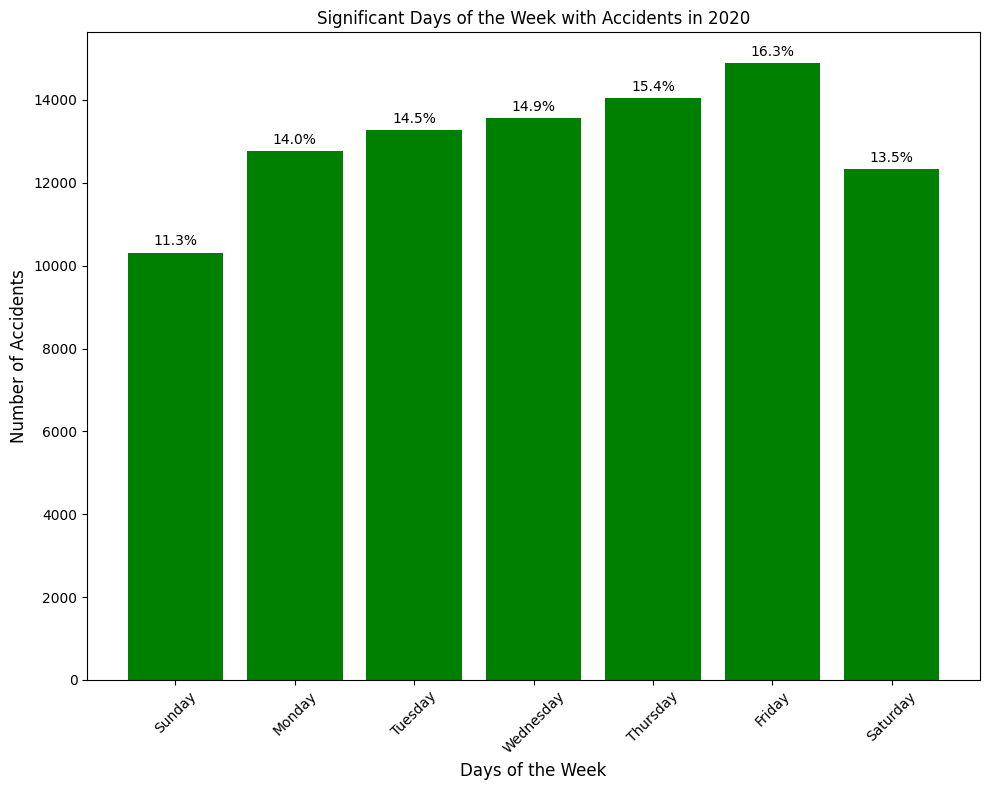

In [143]:
import matplotlib.pyplot as plt

# Set up the figure and axis
fig, ax = plt.subplots(figsize=(10, 8))

# days of week as indicated in stats20
days = ['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday']

# Calculate the total number of accidents
total_accidents = accident_counts_by_day.sum()

# Calculate the percentage of accidents for each day
percentage_by_day = (accident_counts_by_day / total_accidents) * 100

# Plot the bar chart with the counts of accidents in each day of the week
bars = ax.bar(range(7), accident_counts_by_day, color='green', label='Number of Accidents')

# Display the percentage on each bar
for bar, percentage in zip(bars, percentage_by_day):
    height = bar.get_height()
    ax.annotate(f'{percentage:.1f}%', xy=(bar.get_x() + bar.get_width() / 2, height),
                xytext=(0, 3), textcoords='offset points', ha='center', va='bottom')

# Customize the plot as needed
plt.title('Significant Days of the Week with Accidents in 2020', fontsize=12)
plt.xlabel('Days of the Week', fontsize=12)
plt.ylabel('Number of Accidents', fontsize=12)
plt.xticks(range(7), days, rotation=45)
plt.grid(False)
plt.tight_layout()
plt.show()


Based on the chart provided, a clear pattern emerges, revealing the following insights:

Peak Day: Fridays stand out as the day with the highest number of accidents, recording a total of 14889 incidents. This indicates that Fridays have the highest risk of accidents compared to other days of the week.

Decreasing Trend: As the week progresses, there is a gradual decrease in the number of accidents. Saturdays show a lower count than Fridays, followed by a further decline on Sundays, which had the fewest accidents at 10315 incidents. This trend suggests that accident occurrence tends to reduce as the week moves towards the weekend.

Safety on Sundays: Sundays appear to be relatively safer in terms of accident occurrence compared to other days of the week. The lower number of accidents on Sundays indicates a potential period of decreased risk on the roads.

These observations indicate the importance of understanding the weekly variations in accident frequency. Fridays require extra caution due to their higher accident rates, while Sundays offer an opportunity for increased road safety awareness and preventive measures to maintain the lower accident occurrences.

Road safety stakeholders can leverage this information to develop targeted interventions and awareness campaigns, specifically addressing the higher risk on Fridays. By adopting proactive measures and promoting responsible driving behaviors, it is possible to reduce accident rates and enhance road safety for all road users throughout the week.

## Question 2
## For motorbikes, are there significant hours of the day, and days of the week, on which accidents occur? We suggest a focus on: Motorcycle 125cc and under, Motorcycle over 125cc and up to 500cc, and Motorcycle over 500cc.

### Significant hours of the day on which accidents occur involving Motorcycle 125cc and under, Motorcycle over 125cc and up to 500cc, and Motorcycle over 500cc.

In [144]:
# view the series of unique values in the vehicle_type column of vehicle table 
vehicle_df["vehicle_type"].unique()

array([ 9,  8,  3,  2, 11,  1, 90, 19,  4,  5, 21, 97, 20, 98, 10, 17, 23,
       22, 18, 16], dtype=int64)

According to the given information, the vehicle table contains a total of 20 unique vehicle types. For our analysis, we will specifically need vehicle types 2, 3, 4, and 5, which correspond to 'M/cycle 50cc and under', 'M/cycle over 50cc and up to 125cc', 'M/cycle over 125cc and up to 500cc', and 'Motorcycle over 500cc' as described in the Stats 20. These vehicle types are relevant for our analysis.

In [145]:
# Filter the Vehicle DataFrame to include only accidents involving motorcycles of the specified categories
motorcycle_categories = [2, 3, 4, 5]
filtered_data = vehicle_df[vehicle_df['vehicle_type'].isin(motorcycle_categories)]
filtered_data

,vehicle_index,accident_index,accident_year,accident_reference,vehicle_reference,vehicle_type,towing_and_articulation,vehicle_manoeuvre,vehicle_direction_from,vehicle_direction_to,...,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
12,681728,2020010228020,2020,010228020,1,3,0,3,7,3,...,6,1,37,7,114,1,5,YAMAHA XC115,8,1
32,681748,2020010228077,2020,010228077,2,2,0,18,8,4,...,6,1,19,4,-1,-1,-1,-1,5,1
33,681749,2020010228086,2020,010228086,1,3,0,18,7,3,...,6,3,-1,-1,-1,-1,-1,-1,-1,-1
36,681752,2020010228097,2020,010228097,2,3,0,18,1,5,...,6,1,20,4,125,1,4,PEUGEOT TWEET 125,6,1
58,681774,2020010228148,2020,010228148,1,3,0,14,5,1,...,6,1,20,4,125,1,0,HONDA GLR 125,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
167195,848911,2020991010130,2020,991010130,2,3,0,14,7,3,...,6,1,47,8,124,1,17,-1,5,1
167292,849008,2020991011809,2020,991011809,2,3,0,5,7,3,...,2,1,61,9,124,1,4,-1,3,1
167301,849017,2020991012311,2020,991012311,1,3,0,18,8,4,...,1,1,35,6,125,1,3,-1,5,1
167304,849020,2020991012353,2020,991012353,2,4,0,18,6,2,...,5,1,48,8,250,1,5,-1,2,1


In [146]:
# join the filtered data and accident data by 'accident_index'
join_df = pd.merge(accident_df, filtered_data, on = "accident_index")

In [147]:
# view the new DataFrame
join_df

,accident_index,accident_year_x,accident_reference_x,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
0,2020010228020,2020,010228020,529718.0,192342.0,-0.127840,51.614971,1,3,2,...,6,1,37,7,114,1,5,YAMAHA XC115,8,1
1,2020010228077,2020,010228077,531477.0,174550.0,-0.109087,51.454673,1,2,2,...,6,1,19,4,-1,-1,-1,-1,5,1
2,2020010228086,2020,010228086,531043.0,176304.0,-0.114680,51.470537,1,3,1,...,6,3,-1,-1,-1,-1,-1,-1,-1,-1
3,2020010228097,2020,010228097,528428.0,179923.0,-0.150994,51.503659,1,3,2,...,6,1,20,4,125,1,4,PEUGEOT TWEET 125,6,1
4,2020010228148,2020,010228148,518467.0,185248.0,-0.292651,51.553691,1,3,1,...,6,1,20,4,125,1,0,HONDA GLR 125,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14121,2020991010130,2020,991010130,250655.0,658068.0,-4.383591,55.792760,99,3,2,...,6,1,47,8,124,1,17,-1,5,1
14122,2020991011809,2020,991011809,268116.0,656638.0,-4.104624,55.785004,99,3,2,...,2,1,61,9,124,1,4,-1,3,1
14123,2020991012311,2020,991012311,311646.0,683727.0,-3.419652,56.038240,99,2,2,...,1,1,35,6,125,1,3,-1,5,1
14124,2020991012353,2020,991012353,318037.0,745230.0,-3.336269,56.591779,99,3,2,...,5,1,48,8,250,1,5,-1,2,1


According to the information provided, there are 14126 records on the vehicle types 'M/cycle 50cc and under', 'M/cycle over 50cc and up to 125cc', 'M/cycle over 125cc and up to 500cc', and 'Motorcycle over 500cc'. Since our interest is the accidents involving the different motorcycles and not the counts of the motorcycles, we shall sort the dataset by the 'accident index'.

In [148]:
# Drop rows with duplicate by 'accident_index'
accident_motorcycles = join_df.drop_duplicates(subset='accident_index', keep='first')

In [149]:
# view the new dataset 'accident_motorcycles'
accident_motorcycles

,accident_index,accident_year_x,accident_reference_x,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,journey_purpose_of_driver,sex_of_driver,age_of_driver,age_band_of_driver,engine_capacity_cc,propulsion_code,age_of_vehicle,generic_make_model,driver_imd_decile,driver_home_area_type
0,2020010228020,2020,010228020,529718.0,192342.0,-0.127840,51.614971,1,3,2,...,6,1,37,7,114,1,5,YAMAHA XC115,8,1
1,2020010228077,2020,010228077,531477.0,174550.0,-0.109087,51.454673,1,2,2,...,6,1,19,4,-1,-1,-1,-1,5,1
2,2020010228086,2020,010228086,531043.0,176304.0,-0.114680,51.470537,1,3,1,...,6,3,-1,-1,-1,-1,-1,-1,-1,-1
3,2020010228097,2020,010228097,528428.0,179923.0,-0.150994,51.503659,1,3,2,...,6,1,20,4,125,1,4,PEUGEOT TWEET 125,6,1
4,2020010228148,2020,010228148,518467.0,185248.0,-0.292651,51.553691,1,3,1,...,6,1,20,4,125,1,0,HONDA GLR 125,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14121,2020991010130,2020,991010130,250655.0,658068.0,-4.383591,55.792760,99,3,2,...,6,1,47,8,124,1,17,-1,5,1
14122,2020991011809,2020,991011809,268116.0,656638.0,-4.104624,55.785004,99,3,2,...,2,1,61,9,124,1,4,-1,3,1
14123,2020991012311,2020,991012311,311646.0,683727.0,-3.419652,56.038240,99,2,2,...,1,1,35,6,125,1,3,-1,5,1
14124,2020991012353,2020,991012353,318037.0,745230.0,-3.336269,56.591779,99,3,2,...,5,1,48,8,250,1,5,-1,2,1


According to the information provided, there are 13740 (approximately 15%) accident records involving vehicle types 'M/cycle 50cc and under', 'M/cycle over 50cc and up to 125cc', 'M/cycle over 125cc and up to 500cc', and 'Motorcycle over 500cc'

In [150]:
# Group the 'accident_motorcycles' by the hour of the day and motorcycle category, and count the number of accidents in each group
hourly_motorcycles_accident_counts = accident_motorcycles.groupby(['hour', 'vehicle_type']).size().unstack()
hourly_motorcycles_accident_counts

vehicle_type,2,3,4,5
hour,,,,
0,5,66,16,10
1,4,51,17,17
2,6,30,4,7
3,5,24,5,7
4,2,28,9,4
5,5,54,13,41
6,15,115,35,89
7,18,273,75,177
8,52,249,62,133


In [151]:
# Total number of accidents involving the motocycle categories
hourly_motorcycles_accident_counts.sum()

vehicle_type
2    1114
3    7347
4    1641
5    3638
dtype: int64

According to the data analysis, the majority of motorcycle accidents were associated with the 'M/cycle over 50cc and up to 125cc' category, which accounted for a significant number of incidents totaling 7347 occurrences in the year 2020."

In [152]:
# Find the hour with the most accidents for each motorcycle category
most_significant_hours = hourly_motorcycles_accident_counts.idxmax()

# Find the hour with the least accidents for each motorcycle category
least_significant_hours = hourly_motorcycles_accident_counts.idxmin()

# Display the results
print("Most significant hours of the day on which accidents occur involving different motorcycle categories:")
print(most_significant_hours)
print("\n")
print("Least significant hours of the day on which accidents occur involving different motorcycle categories:")
print(least_significant_hours)

Most significant hours of the day on which accidents occur involving different motorcycle categories:
vehicle_type
2    17
3    18
4    17
5    17
dtype: int64


Least significant hours of the day on which accidents occur involving different motorcycle categories:
vehicle_type
2    4
3    3
4    2
5    4
dtype: int64


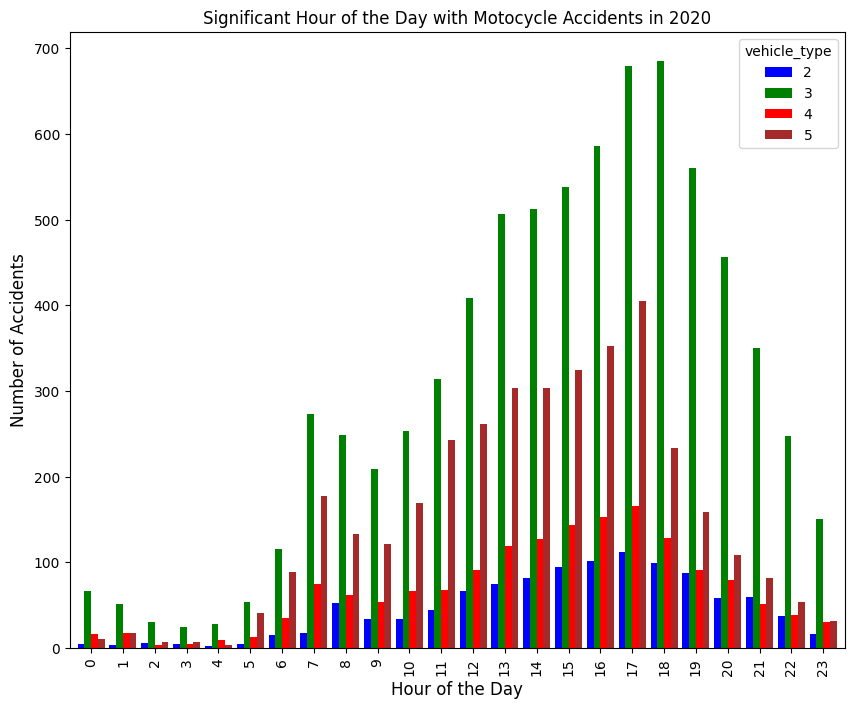

In [153]:
# Plot of significant hours of the day on which accidents occur involving the motorcycle categories

# Set up the figure and axis
fig, ax = plt.subplots(figsize=(10, 8))

# Define colors for each category
colors = ['blue', 'green', 'red', 'brown']

# Define the bar width 
bar_width = 0.85

# Plot the bar chart with the counts of accidents in each hour of the day
hourly_motorcycles_accident_counts.plot(kind='bar', ax=ax, color=colors, width=bar_width)

# Customize the plot as needed
plt.title('Significant Hour of the Day with Motocycle Accidents in 2020', fontsize=12)
plt.xlabel('Hour of the Day', fontsize=12)
plt.ylabel('Number of Accidents', fontsize=12)

plt.show();

Based on the given information, we can deduce the following significant hours of the day on which accidents occur involving different motorcycle categories:

- M/cycle 50cc and under, M/cycle over 125cc and up to 500cc, and Motorcycle over 500cc: The significant hour for accidents involving these motorcycle categories is the 17th hour of the day.

- M/cycle over 50cc and up to 125cc: The significant hour for accidents involving this motorcycle category is the 18th hour of the day.

These observations highlight the importance of the 17th hour for accidents involving M/cycle 50cc and under, M/cycle over 125cc and up to 500cc, and Motorcycle over 500cc, as well as the 18th hour for accidents involving Motorcycle over 500cc. It's crucial for road safety stakeholders to be aware of these specific hours of increased accident occurrences and implement targeted interventions and safety measures to reduce the risk of accidents during these times. By promoting responsible driving behaviors and raising awareness about road safety, it is possible to mitigate the number of accidents and improve overall road safety for all motorcycle riders and other road users.  

### Significant days of the week on which accidents occur involving Motorcycle 125cc and under, Motorcycle over 125cc and up to 500cc, and Motorcycle over 500cc.

In [154]:
# Group the 'accident_motorcycles' by day of the week and motorcycle category, and count the number of accidents in each group
daily_motorcycles_accident_counts = accident_motorcycles.groupby(['day_of_week', 'vehicle_type']).size().unstack()
daily_motorcycles_accident_counts

vehicle_type,2,3,4,5
day_of_week,,,,
1,103,824,205,630
2,161,978,220,451
3,165,1013,228,485
4,158,1069,244,486
5,168,1191,253,511
6,188,1252,259,549
7,171,1020,232,526


In [155]:
# Find the day with the most accidents involving motorcycles
most_significant_day = daily_motorcycles_accident_counts.idxmax()

# Find the day with the least accidents involving motorcycles
least_significant_day = daily_motorcycles_accident_counts.idxmin()

# Display the results
print("Most significant day of the week with accidents involving motorcycles:", most_significant_day)
print("\n")
print("Least significant day of the week with accidents involving motorcycles:", least_significant_day)

Most significant day of the week with accidents involving motorcycles: vehicle_type
2    6
3    6
4    6
5    1
dtype: int64


Least significant day of the week with accidents involving motorcycles: vehicle_type
2    1
3    1
4    1
5    2
dtype: int64


Based on the data analysis, Fridays stand out as the most significant day of the week for accidents involving 'Motorcycle 125cc and under' as well as 'Motorcycle over 125cc and up to 500cc.' On the other hand, Sundays record the highest number of accidents for 'Motorcycle over 500cc.'

Conversely, Sundays exhibit the least significant day of the week for accidents involving 'Motorcycle 125cc and under' and 'Motorcycle over 125cc and up to 500cc.' Meanwhile, Mondays have the fewest accidents for 'Motorcycle over 500cc.' 

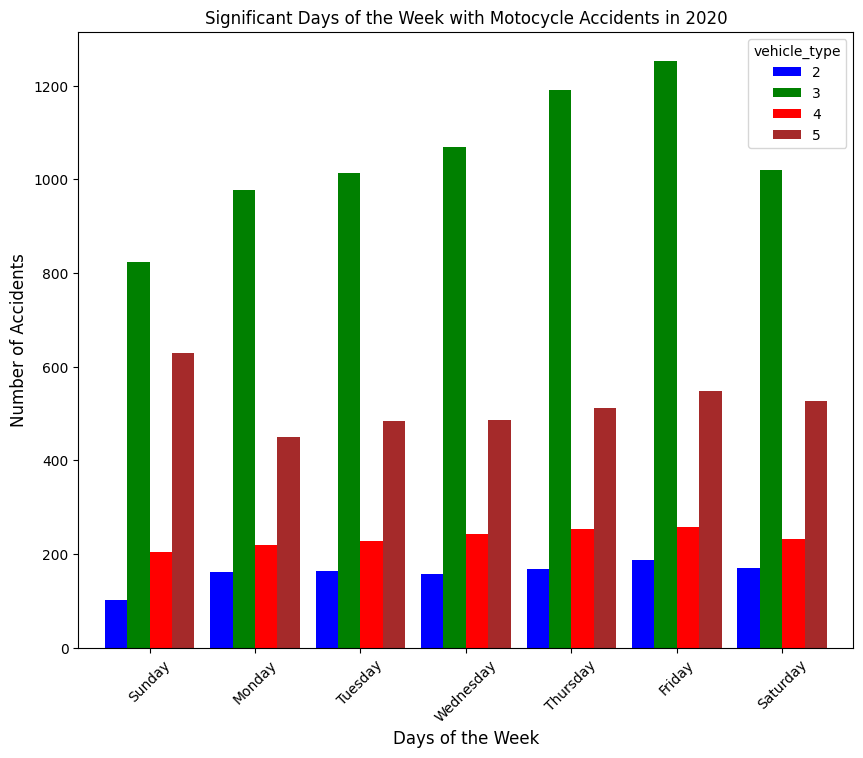

In [156]:
# plot of significant days of the week on which accidents occur by motorcycles in accident year 2020
# Plot of significant days of the week on which accidents occur involving the motorcycle categories

# Set up the figure and axis
fig, ax = plt.subplots(figsize=(10, 8))

# Days of the week as indicated in stats20
days = ['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday']

# Define colors for each category
colors = ['blue', 'green', 'red', 'brown']

# Define the bar width 
bar_width = 0.85

# Plot the bar chart with the counts of accidents in days of the week
daily_motorcycles_accident_counts.plot(kind='bar', ax=ax, color=colors, width=bar_width)

# Customize the plot as needed
plt.title('Significant Days of the Week with Motocycle Accidents in 2020', fontsize=12)
plt.xlabel('Days of the Week', fontsize=12)
plt.ylabel('Number of Accidents', fontsize=12)
plt.xticks(range(7), days, rotation=45)

plt.show();

Based on the chart presented, the data reveals distinct patterns regarding motorcycle accidents for different categories on different days of the week. The key observations are as follows:

- Motorcycle 125cc and under & Motorcycle over 125cc and up to 500cc: 
Fridays emerge as the most significant day of the week in terms of accidents involving both 'Motorcycle 125cc and under' and 'Motorcycle over 125cc and up to 500cc.' These two categories record their highest number of accidents on Fridays. As the week progresses, the number of accidents gradually decreases until Sunday when it reaches the lowest point.

- Motorcycle over 500cc:
On the other hand, Sundays exhibit the highest number of accidents involving 'Motorcycle over 500cc,' making it the most significant day of the week for this particular category. Similar to the previous categories, the number of accidents for 'Motorcycle over 500cc' also decreases as the week progresses, reaching its lowest point on Monday.


## Question 3

## For pedestrians involved in accidents, are there significant hours of the day, and days of the week, on which they are more likely to be involved?

### Significant hours of the day on which pedestrians are most likely to be involved in accidents

In [157]:
# obtain records for pesdestrians in the "casualty_class" column of casualty table for accident_year 2020 i.e. 'pedestrian' represents '3' in the Stats 2020. 
pedestrian = casualty_df[casualty_df["casualty_class"] == 3]

In [158]:
# join the filtered casualty data and accident data by 'accident_index'
pedestrian_df = pd.merge(accident_df, pedestrian, on = "accident_index")

In [159]:
# View the joined DataFrame
pedestrian_df

,accident_index,accident_year_x,accident_reference_x,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile
0,2020010219808,2020,010219808,521389.0,175144.0,-0.254001,51.462262,1,3,1,...,6,3,9,5,0,0,0,0,1,4
1,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,1,3,1,...,1,3,1,1,0,0,0,0,1,2
2,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,1,3,1,...,1,3,1,1,0,0,0,0,1,2
3,2020010228005,2020,010228005,526432.0,182761.0,-0.178719,51.529614,1,3,1,...,5,3,5,9,0,0,0,0,1,3
4,2020010228006,2020,010228006,538676.0,184371.0,-0.001683,51.541210,1,2,1,...,8,2,4,1,0,0,0,0,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14745,2020991023621,2020,991023621,341791.0,733677.0,-2.946947,56.491558,99,2,1,...,8,2,8,1,0,0,0,0,1,4
14746,2020991023880,2020,991023880,342979.0,731116.0,-2.927095,56.468699,99,3,1,...,9,3,5,1,0,0,0,0,1,4
14747,2020991024526,2020,991024526,286242.0,717023.0,-3.841439,56.331864,99,3,1,...,10,3,6,9,0,0,0,0,3,7
14748,2020991029573,2020,991029573,257963.0,658891.0,-4.267565,55.802353,99,3,1,...,9,3,10,1,0,0,0,0,1,10


According to the information provided, there are 14750 records on the pedestrians. Since our interest is the accidents involving the pedestrians and not the counts of the pedestrians, we shall sort the dataset by the 'accident index'.

In [160]:
pedestrian_df

,accident_index,accident_year_x,accident_reference_x,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile
0,2020010219808,2020,010219808,521389.0,175144.0,-0.254001,51.462262,1,3,1,...,6,3,9,5,0,0,0,0,1,4
1,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,1,3,1,...,1,3,1,1,0,0,0,0,1,2
2,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,1,3,1,...,1,3,1,1,0,0,0,0,1,2
3,2020010228005,2020,010228005,526432.0,182761.0,-0.178719,51.529614,1,3,1,...,5,3,5,9,0,0,0,0,1,3
4,2020010228006,2020,010228006,538676.0,184371.0,-0.001683,51.541210,1,2,1,...,8,2,4,1,0,0,0,0,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14745,2020991023621,2020,991023621,341791.0,733677.0,-2.946947,56.491558,99,2,1,...,8,2,8,1,0,0,0,0,1,4
14746,2020991023880,2020,991023880,342979.0,731116.0,-2.927095,56.468699,99,3,1,...,9,3,5,1,0,0,0,0,1,4
14747,2020991024526,2020,991024526,286242.0,717023.0,-3.841439,56.331864,99,3,1,...,10,3,6,9,0,0,0,0,3,7
14748,2020991029573,2020,991029573,257963.0,658891.0,-4.267565,55.802353,99,3,1,...,9,3,10,1,0,0,0,0,1,10


In [161]:
# Drop rows with duplicate by 'accident_index'
accident_pedestrians = pedestrian_df.drop_duplicates(subset='accident_index', keep='first')

In [162]:
# view the new dataset 'accident_pedestrians'
accident_pedestrians

,accident_index,accident_year_x,accident_reference_x,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,age_band_of_casualty,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker,casualty_type,casualty_home_area_type,casualty_imd_decile
0,2020010219808,2020,010219808,521389.0,175144.0,-0.254001,51.462262,1,3,1,...,6,3,9,5,0,0,0,0,1,4
1,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,1,3,1,...,1,3,1,1,0,0,0,0,1,2
3,2020010228005,2020,010228005,526432.0,182761.0,-0.178719,51.529614,1,3,1,...,5,3,5,9,0,0,0,0,1,3
4,2020010228006,2020,010228006,538676.0,184371.0,-0.001683,51.541210,1,2,1,...,8,2,4,1,0,0,0,0,1,3
5,2020010228011,2020,010228011,529324.0,181286.0,-0.137592,51.515704,1,3,1,...,6,3,6,9,0,0,0,0,1,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14745,2020991023621,2020,991023621,341791.0,733677.0,-2.946947,56.491558,99,2,1,...,8,2,8,1,0,0,0,0,1,4
14746,2020991023880,2020,991023880,342979.0,731116.0,-2.927095,56.468699,99,3,1,...,9,3,5,1,0,0,0,0,1,4
14747,2020991024526,2020,991024526,286242.0,717023.0,-3.841439,56.331864,99,3,1,...,10,3,6,9,0,0,0,0,3,7
14748,2020991029573,2020,991029573,257963.0,658891.0,-4.267565,55.802353,99,3,1,...,9,3,10,1,0,0,0,0,1,10


According to the information provided, there are 14193 (approximately 15.5%) accidents involving pedestrians. 

In [163]:
# Group the 'pedestrian_df' by the hour of the day and pedestrian, and count the number of accidents in each group
pedestrian_hourly_accident_counts = accident_pedestrians.groupby(['hour', 'casualty_class']).size().unstack()
pedestrian_hourly_accident_counts

casualty_class,3
hour,
0,162
1,137
2,81
3,77
4,48
5,72
6,171
7,506
8,1023


According to the data, the highest number of accidents (1604 incidents) involving pedestrians occurred at the 15th hour of the day.  

In [164]:
# Find the hour with the most accidents involving pedestrians
most_significant_hour = pedestrian_hourly_accident_counts.idxmax()

# Find the hour with the least accidents involving pedestrians
least_significant_hour = pedestrian_hourly_accident_counts.idxmin()

# Display the results
print("Most significant hour of the day with accidents involving pedestrians:", most_significant_hour)
print("\n")
print("Least significant hour of the day with accidents involving pedestrians:", least_significant_hour)

Most significant hour of the day with accidents involving pedestrians: casualty_class
3    15
dtype: int64


Least significant hour of the day with accidents involving pedestrians: casualty_class
3    4
dtype: int64


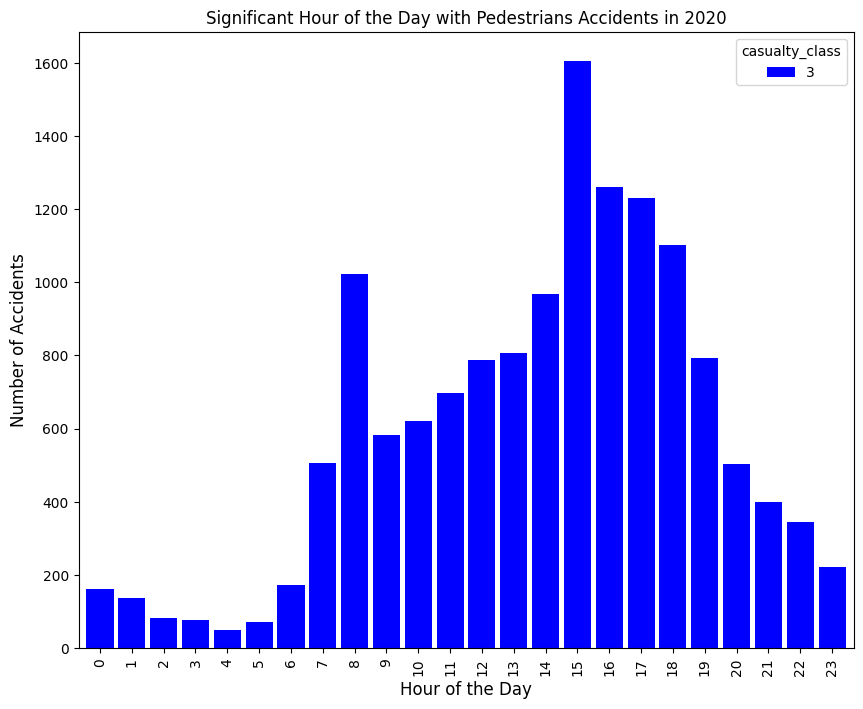

In [165]:
# Plot of significant hours of the day on which accidents occur involving the pedestrians

# Set up the figure and axis
fig, ax = plt.subplots(figsize=(10, 8))

# Define the bar width 
bar_width = 0.85

# Plot the bar chart with the counts of accidents in each hour of the day
pedestrian_hourly_accident_counts.plot(kind='bar', ax=ax, color='blue', width=bar_width)

# Customize the plot as needed
plt.title('Significant Hour of the Day with Pedestrians Accidents in 2020', fontsize=12)
plt.xlabel('Hour of the Day', fontsize=12)
plt.ylabel('Number of Accidents', fontsize=12)
plt.grid(False)

plt.show();

Based on the provided chart, several patterns emerge that provide valuable insights into pedestrian accidents in year 2020:

Peak Hour: The data clearly indicates that the 15th hour of the day experiences the highest number of pedestrian accidents, making it the peak hour for such incidents. During this hour, there is a notable spike in accidents, signifying the time with the most significant risk for pedestrian-related accidents.

Low Accident Period: Between the 2nd and 3rd hours of the day, there is a noticeable decrease in the number of pedestrian accidents. Although the decrease may not be substantial, it does indicate a relatively safer period with fewer accidents compared to the surrounding hours. This period might present a comparatively lower risk for pedestrians.

Decreasing Trend: The chart exhibits a consistent decreasing trend in the number of accidents from around the 16th hour until the 4th hour of the day. This pattern suggests that as the day progresses from the late afternoon into the early morning hours, the likelihood of pedestrian accidents gradually diminishes. Consequently, these hours might be relatively safer for pedestrians.

These patterns can assist in enhancing pedestrian safety measures during specific hours of the day. Focusing on accident prevention and targeted interventions during the peak hour, as well as considering the low accident period, can contribute to reducing pedestrian-related accidents and enhancing overall road safety.

### Significant days of the week on which pedestrians are most likely to be involved in accidents

In [166]:
# Group the 'accident_pedestrians' by the days of the week and pedestrian, and count the number of accidents in each group
pedestrian_daily_accident_counts = accident_pedestrians.groupby(['day_of_week', 'casualty_class']).size().unstack()
pedestrian_daily_accident_counts

casualty_class,3
day_of_week,
1,1200
2,2129
3,2181
4,2165
5,2275
6,2442
7,1801


In [167]:
# Find the day with the most accidents involving pedestrians
most_significant_day = pedestrian_daily_accident_counts.idxmax()

# Find the day with the least accidents involving pedestrians
least_significant_day = pedestrian_daily_accident_counts.idxmin()

# Display the results
print("Most significant day of the week with accidents involving pedestrians:", most_significant_day)
print("\n")
print("Least significant day of the week with accidents involving pedestrians:", least_significant_day)

Most significant day of the week with accidents involving pedestrians: casualty_class
3    6
dtype: int64


Least significant day of the week with accidents involving pedestrians: casualty_class
3    1
dtype: int64


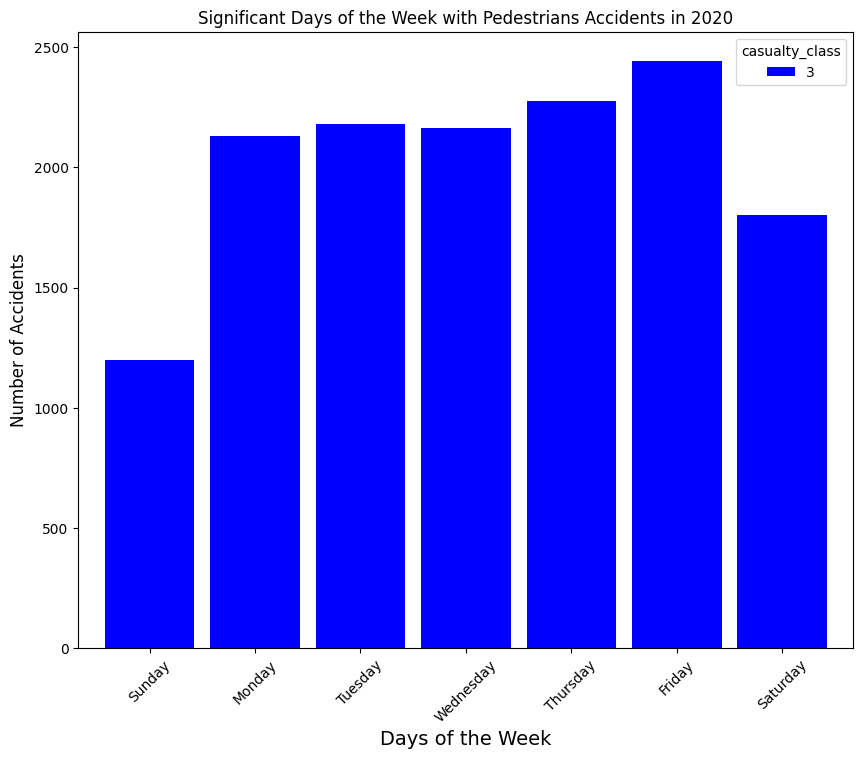

In [168]:
# Plot of significant days of the week on which accidents occur involving pedestrians

# Set up the figure and axis
fig, ax = plt.subplots(figsize=(10, 8))

# Days of the week as indicated in stats20
days = ['Sunday', 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday']

# Define the bar width 
bar_width = 0.85

# Plot the bar chart with the counts of accidents in each day of the week
pedestrian_daily_accident_counts.plot(kind='bar', ax=ax, color="blue", width=bar_width)

# Customize the plot as needed
plt.title('Significant Days of the Week with Pedestrians Accidents in 2020', fontsize=12)
plt.xlabel('Days of the Week', fontsize=14)
plt.ylabel('Number of Accidents', fontsize=12)
plt.xticks(range(7), days, rotation=45)
plt.grid(False)

# show plot
plt.show();

Based on the chart presented, the data reveals distinct patterns regarding pedestrian accidents on different days of the week. The key observations are as follows:

Peak: Friday emerges as the most significant day of the week in terms of accidents (2442 incidents) involving pedestrians. It experiences the highest number of pedestrian accidents compared to all other days.

Decreasing Trend: As the week progresses, the number of pedestrian accidents gradually decreases. From Friday, the number of accidents starts to decline, with Saturday having slightly fewer accidents than Friday, and Sunday having fewer accidents than Saturday.

Lowest Point: The lowest point in pedestrian accidents is observed on Sunday (1200 incidents). It has the least number of pedestrian accidents among all the days of the week.

These observations suggest that there may be factors contributing to the increased risk of pedestrian accidents on Fridays and a potential decrease in risk as the week moves towards the weekend. Further analysis and investigation could be conducted to understand the underlying reasons behind these patterns and implement appropriate measures to improve pedestrian safety, especially on Fridays, and promote safety on other days with higher accident rates.

## Question 4

## Using the apriori algorithm, explore the impact of selected variables on accident severity.  

### Feature Selection

We select features from our tables needed to build our models 

- Likely features to select includes:
    - Accident: accident severity, light conditions, weather conditions and speed limit.

In [169]:
# obtain likley features in the tables
accident_features = ["accident_index", "accident_severity", "speed_limit", "light_conditions", "weather_conditions"]

In [170]:
# Extract a subset of the original data using the chosen features
ac_df = accident_df[accident_features]

In [171]:
# View the new 'ac_df' DataFrame
ac_df.head()

,accident_index,accident_severity,speed_limit,light_conditions,weather_conditions
0,2020010219808,3,20,1,9
1,2020010220496,3,20,1,1
2,2020010228005,3,30,4,1
3,2020010228006,2,30,4,1
4,2020010228011,3,30,4,1


In [172]:
# view the dimension of the new dataframe
ac_df.shape

(91199, 5)

In [173]:
# select the features and target
ac_df = ac_df.drop(["accident_index"], axis = 1)

In [174]:
# View the selected features and target
ac_df

,accident_severity,speed_limit,light_conditions,weather_conditions
0,3,20,1,9
1,3,20,1,1
2,3,30,4,1
3,2,30,4,1
4,3,30,4,1
...,...,...,...,...
91194,2,30,1,1
91195,3,30,1,1
91196,2,60,1,1
91197,3,30,1,1


In [175]:
# encode the features to 0 and 1 
# encode 'accident_severity' column

a_severity = pd.get_dummies(ac_df.accident_severity, prefix="severity")

In [176]:
# view the 'accident_severity' encoded column
a_severity

,severity_1,severity_2,severity_3
0,0,0,1
1,0,0,1
2,0,0,1
3,0,1,0
4,0,0,1
...,...,...,...
91194,0,1,0
91195,0,0,1
91196,0,1,0
91197,0,0,1


In [177]:
# encode 'speed_limit' column
s_limit = pd.get_dummies(ac_df.speed_limit, prefix="speed")

In [178]:
# view the 'speed_limit' encoded column
s_limit

,speed_-1,speed_20,speed_30,speed_40,speed_50,speed_60,speed_70
0,0,1,0,0,0,0,0
1,0,1,0,0,0,0,0
2,0,0,1,0,0,0,0
3,0,0,1,0,0,0,0
4,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...
91194,0,0,1,0,0,0,0
91195,0,0,1,0,0,0,0
91196,0,0,0,0,0,1,0
91197,0,0,1,0,0,0,0


In [179]:
# encode 'light_conditions' column
l_conditions = pd.get_dummies(ac_df.light_conditions, prefix="light")

In [180]:
# view the 'light_conditions' encoded column
l_conditions

,light_-1,light_1,light_4,light_5,light_6,light_7
0,0,1,0,0,0,0
1,0,1,0,0,0,0
2,0,0,1,0,0,0
3,0,0,1,0,0,0
4,0,0,1,0,0,0
...,...,...,...,...,...,...
91194,0,1,0,0,0,0
91195,0,1,0,0,0,0
91196,0,1,0,0,0,0
91197,0,1,0,0,0,0


In [181]:
# encode 'weather_conditions' column
w_conditions = pd.get_dummies(ac_df.weather_conditions, prefix="weather")

In [182]:
# view the 'weather_conditions' encoded column
w_conditions

,weather_-1,weather_1,weather_2,weather_3,weather_4,weather_5,weather_6,weather_7,weather_8,weather_9
0,0,0,0,0,0,0,0,0,0,1
1,0,1,0,0,0,0,0,0,0,0
2,0,1,0,0,0,0,0,0,0,0
3,0,1,0,0,0,0,0,0,0,0
4,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...
91194,0,1,0,0,0,0,0,0,0,0
91195,0,1,0,0,0,0,0,0,0,0
91196,0,1,0,0,0,0,0,0,0,0
91197,0,1,0,0,0,0,0,0,0,0


In [183]:
# concatenating the four encoded variables (severity, speed, weather and light) into a single DataFrame
df_acc_encoded = pd.concat([a_severity, s_limit, w_conditions, l_conditions], axis=1)

In [184]:
# view results
df_acc_encoded

,severity_1,severity_2,severity_3,speed_-1,speed_20,speed_30,speed_40,speed_50,speed_60,speed_70,...,weather_6,weather_7,weather_8,weather_9,light_-1,light_1,light_4,light_5,light_6,light_7
0,0,0,1,0,1,0,0,0,0,0,...,0,0,0,1,0,1,0,0,0,0
1,0,0,1,0,1,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
2,0,0,1,0,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
3,0,1,0,0,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
4,0,0,1,0,0,1,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91194,0,1,0,0,0,1,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
91195,0,0,1,0,0,1,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
91196,0,1,0,0,0,0,0,0,1,0,...,0,0,0,0,0,1,0,0,0,0
91197,0,0,1,0,0,1,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0


### Applying Apriori Algorithmn

In [185]:
# Accident severity and other features 
apriori_freq = apriori(df_acc_encoded, min_support=0.2, use_colnames=True)

In [186]:
apriori_freq

,support,itemsets
0,0.201263,(severity_2)
1,0.783484,(severity_3)
2,0.573033,(speed_30)
3,0.775546,(weather_1)
4,0.706784,(light_1)
5,0.208621,(light_4)
6,0.459983,"(speed_30, severity_3)"
7,0.603186,"(weather_1, severity_3)"
8,0.559337,"(light_1, severity_3)"
9,0.450137,"(speed_30, weather_1)"


Based on the data presented and using a minimum-support threshold of 0.2 (20%);

- The itemset (speed_30, severity_3) having a support of 0.459983 (46%) means that in the accident dataset for year 2020, 46% of the instances (or transactions) contain both the attributes "speed_30" (which represents speed limit of "30mph") and "severity_3" (which represents "slight" severity) together. In other words, nearly half of the instances in the dataset have both these attributes present. In this context, a support value of 0.459983 (46%) for the itemset (speed_30, severity_3) indicates that there is a relatively strong association between the attributes "speed_30" and "severity_3" in the dataset, as they often appear together in the data. 

- The itemset (severity_3, weather_1) having a support of 0.603186 (60%) means that in the dataset, approximately 60% of the transactions (or rows) contain both "severity_3" (which represents "slight" severity) and "weather_1" (which represents 'Fine without high winds' weather condition) together as a combination. In simpler terms, this indicates a strong co-occurrence or association between the severity of an event "slight" severity and a specific weather condition ('Fine without high winds') in the dataset. The high support value suggests that these two attributes often appear together in a significant portion of the dataset.

In [187]:
# Generate the association rule by 'lift'
rules = association_rules(apriori_freq, metric="lift", min_threshold=1.05)
rules

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
0,(light_1),(weather_1),0.706784,0.775546,0.578669,0.818735,1.055688,0.030525,1.238263,0.179904
1,(weather_1),(light_1),0.775546,0.706784,0.578669,0.746144,1.055688,0.030525,1.155047,0.235018
2,"(weather_1, severity_3)",(light_1),0.603186,0.706784,0.453810,0.752354,1.064475,0.027487,1.184013,0.152641
3,(light_1),"(weather_1, severity_3)",0.706784,0.603186,0.453810,0.642077,1.064475,0.027487,1.108656,0.206571
4,"(light_1, speed_30)",(weather_1),0.406540,0.775546,0.337273,0.829620,1.069724,0.021983,1.317376,0.109830
5,"(speed_30, weather_1)",(light_1),0.450137,0.706784,0.337273,0.749269,1.060111,0.019124,1.169445,0.103120
6,(light_1),"(speed_30, weather_1)",0.706784,0.450137,0.337273,0.477194,1.060111,0.019124,1.051755,0.193380
7,(weather_1),"(light_1, speed_30)",0.775546,0.406540,0.337273,0.434885,1.069724,0.021983,1.050159,0.290392
8,"(light_1, speed_30, severity_3)",(weather_1),0.330409,0.775546,0.272097,0.823516,1.061853,0.015850,1.271809,0.086994
9,"(speed_30, weather_1, severity_3)",(light_1),0.359697,0.706784,0.272097,0.756463,1.070288,0.017869,1.203987,0.102564


Based on the data presented and using a minimum threshold of 0.7 (70%);

- The itemsets (severity_3) and (weather_1) having a lift of 0.992690 means that there is a slightly negative association between the "severity_3" attribute (which represents "slight" accident severity) and the "weather_1" attribute (which represents a "Fine without high winds" weather condition). In this case, a lift of 0.992690 indicates that the occurrence of "severity_3" and "weather_1" together is slightly lower than what would be expected if the two attributes were independent. This suggests that accidents with "slight" severity and "Fine without high winds" weather condition tend to happen slightly less often together than would be expected based on their individual frequencies.


- The itemsets (severity_3) and (speed_30) having a lift of 1.024548 means that there is a slightly positive association between the "severity_3" attribute (representing "slight" severity) and the "speed_30" attribute (representing speed limit of "30mph"). In this case, a lift of 1.024548 indicates that the occurrence of "severity_3" and "speed_30" together is slightly higher than what would be expected if the two attributes were independent. This suggests that accidents with slight severity and speed limit of 30mph  tend to happen slightly more often together than would be expected based on their individual frequencies.

- The itemsets (severity_3, weather_1) and (light_1, speed_30) having a lift of 1.109609 indicates that there is a positive association between the two items within each itemset. A lift value greater than 1 suggests that the occurrence of the two items in each itemset is positively correlated, meaning that the presence of one item increases the likelihood of the other item being present as well, more than if they were independent of each other. In this case, a lift value of 1.109609 suggests that the occurrence of severity_3 (representing 'slight' severity) is about 1.109609 times more likely when weather_1 (representing 'Fine without high winds') is present compared to when it's absent, and similarly, the occurrence of light_1 (representing 'daylight') is about 1.109609 times more likely when speed_30 (representing '30mph') is present compared to when it's absent.

## Question 5

## Identify accidents in our region: Kingston upon Hull, Humberside, and the East Riding of Yorkshire etc. You can do this by filtering on LSOA, or police region or another method if you can find one. Run clustering on this data. What do these clusters reveal about the distribution of accidents in our region? 

Given our interest in understanding the distribution of accident in the region: Kingston upon Hull, Humberside and the East Riding of Yorkshire etc. We shall merge the accident and LSOA dataframe to obtain the required information necessary for our analysis.

In [188]:
# Merge the accident and LSOA dataframe
merged_df = accident_df.merge(lsoa_df, left_on="lsoa_of_accident_location", right_on="lsoa01cd")

In [189]:
# obtain records representing entries for "police_force" = 16 (which represents Humberside as indicated in stats20)
accident_loc_df = merged_df[merged_df["police_force"]==16]
accident_loc_df

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,trunk_road_flag,lsoa_of_accident_location,hour,objectid,lsoa01cd,lsoa01nm,lsoa01nmw,shape__area,shape__length,globalid
35821,2020160914930,2020,160914930,506050.0,428813.0,-0.393424,53.744936,16,3,2,...,2,E01012777,11,12777,E01012777,Kingston upon Hull 028E,Kingston upon Hull 028E,3.567509e+05,3963.099631,4c068a55-c2d9-426c-9cfa-94742ef4a3ff
35822,2020160918418,2020,160918418,505576.0,428756.0,-0.400627,53.744520,16,3,2,...,2,E01012777,8,12777,E01012777,Kingston upon Hull 028E,Kingston upon Hull 028E,3.567509e+05,3963.099631,4c068a55-c2d9-426c-9cfa-94742ef4a3ff
35823,2020160936879,2020,160936879,505583.0,428752.0,-0.400523,53.744482,16,3,2,...,2,E01012777,17,12777,E01012777,Kingston upon Hull 028E,Kingston upon Hull 028E,3.567509e+05,3963.099631,4c068a55-c2d9-426c-9cfa-94742ef4a3ff
35824,2020160947046,2020,160947046,506031.0,428789.0,-0.393720,53.744724,16,3,1,...,2,E01012777,19,12777,E01012777,Kingston upon Hull 028E,Kingston upon Hull 028E,3.567509e+05,3963.099631,4c068a55-c2d9-426c-9cfa-94742ef4a3ff
35825,2020160951627,2020,160951627,505692.0,428758.0,-0.398868,53.744514,16,2,2,...,2,E01012777,19,12777,E01012777,Kingston upon Hull 028E,Kingston upon Hull 028E,3.567509e+05,3963.099631,4c068a55-c2d9-426c-9cfa-94742ef4a3ff
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37479,2020161011040,2020,161011040,478094.0,403312.0,-0.823599,53.520707,16,3,2,...,2,E01013244,14,13244,E01013244,North Lincolnshire 020D,North Lincolnshire 020D,5.413456e+06,19987.975175,72c64631-5015-4fe6-a857-931f9433fd10
37480,2020161011144,2020,161011144,519036.0,428776.0,-0.196631,53.741804,16,3,2,...,2,E01013095,17,13095,E01013095,East Riding of Yorkshire 029B,East Riding of Yorkshire 029B,6.221249e+05,5606.223469,5e7ff52f-4524-4ca9-a49d-80b9e461b402
37481,2020161011936,2020,161011936,510941.0,432122.0,-0.318108,53.773648,16,3,2,...,2,E01012815,18,12815,E01012815,Kingston upon Hull 013D,Kingston upon Hull 013D,3.480635e+05,3647.233829,c4d959f1-51ae-4ade-a6fb-dbd860999c4f
37482,2020161012614,2020,161012614,504795.0,439763.0,-0.408728,53.843568,16,3,5,...,2,E01013037,1,13037,E01013037,East Riding of Yorkshire 019B,East Riding of Yorkshire 019B,2.577429e+06,11349.306536,e3117ff6-de67-45f4-8ccd-9608fbacd93e


Based on the given infomation, there are 1663 accident records in the region "Humberside" (which represents Kingston upon Hull, East Riding of Yorkshire, North Lincolnshire, and North East Lincolnshire)

Given our focus on accidents in the specified region, we will extract important columns, including longitude, latitude, and lsoa01nm, to facilitate our analysis.

In [190]:
# view unique values in the 'lsoa01nm' column
accident_loc_df["lsoa01nm"].unique()

array(['Kingston upon Hull 028E', 'North Lincolnshire 022C',
       'Kingston upon Hull 002E', 'North East Lincolnshire 003C',
       'Kingston upon Hull 016D', 'North East Lincolnshire 016C',
       'Kingston upon Hull 026D', 'North Lincolnshire 006D',
       'East Riding of Yorkshire 014A', 'East Riding of Yorkshire 007H',
       'North East Lincolnshire 019A', 'East Riding of Yorkshire 033C',
       'Kingston upon Hull 019D', 'Kingston upon Hull 029D',
       'North Lincolnshire 012B', 'Kingston upon Hull 031D',
       'North Lincolnshire 004D', 'East Riding of Yorkshire 040D',
       'North Lincolnshire 001C', 'North East Lincolnshire 021B',
       'North East Lincolnshire 003B', 'East Riding of Yorkshire 014D',
       'Kingston upon Hull 027B', 'North Lincolnshire 005A',
       'North East Lincolnshire 004C', 'East Riding of Yorkshire 011F',
       'North East Lincolnshire 014D', 'North Lincolnshire 002A',
       'North East Lincolnshire 017B', 'North East Lincolnshire 016B',
    

According to the information presented, the following areas are in 'Humberside' region; Kingston upon Hull, East Riding of Yorkshire, North Lincolnshire, and North East Lincolnshire

In [191]:
# Group each region with a specific name
# define a function for the grouping
 
def group_region(region):
    if region.startswith("Kingston upon Hull"):
        return "Kingston upon Hull"
    elif region.startswith("East Riding of Yorkshire"):
        return "East Riding of Yorkshire"
    elif region.startswith("North Lincolnshire"):
        return "North Lincolnshire"
    else:
        return "North East Lincolnshire"

In [192]:
# Create a new column 'Region' for the grouped region
accident_loc_df["Region"] = accident_loc_df["lsoa01nm"].apply(lambda x: group_region(x))

In [193]:
# Filter the 'accident_loc_df' dataframe and obtain the columns; police force, longitude, latitude, lsoa01nm, and region
accident_loc_reg_df = accident_loc_df[["police_force", "longitude", "latitude", "lsoa01nm", "Region"]]

In [194]:
# View the dataset
accident_loc_reg_df

,police_force,longitude,latitude,lsoa01nm,Region
35821,16,-0.393424,53.744936,Kingston upon Hull 028E,Kingston upon Hull
35822,16,-0.400627,53.744520,Kingston upon Hull 028E,Kingston upon Hull
35823,16,-0.400523,53.744482,Kingston upon Hull 028E,Kingston upon Hull
35824,16,-0.393720,53.744724,Kingston upon Hull 028E,Kingston upon Hull
35825,16,-0.398868,53.744514,Kingston upon Hull 028E,Kingston upon Hull
...,...,...,...,...,...
37479,16,-0.823599,53.520707,North Lincolnshire 020D,North Lincolnshire
37480,16,-0.196631,53.741804,East Riding of Yorkshire 029B,East Riding of Yorkshire
37481,16,-0.318108,53.773648,Kingston upon Hull 013D,Kingston upon Hull
37482,16,-0.408728,53.843568,East Riding of Yorkshire 019B,East Riding of Yorkshire


In [195]:
# Count of series of unique values in Region column
accident_loc_reg_df["Region"].value_counts()

Kingston upon Hull          569
East Riding of Yorkshire    488
North Lincolnshire          304
North East Lincolnshire     302
Name: Region, dtype: int64

Based on the provided information, the number of accidents in the different regions in the year 2020 are as follows:

- Kingston upon Hull: 569 accidents
- East Riding of Yorkshire: 488 accidents
- North Lincolnshire: 304 accidents
- North East Lincolnshire: 302 accidents

This data indicates that Kingston upon Hull had the highest number of accidents in the year 2020 compared to the other regions.

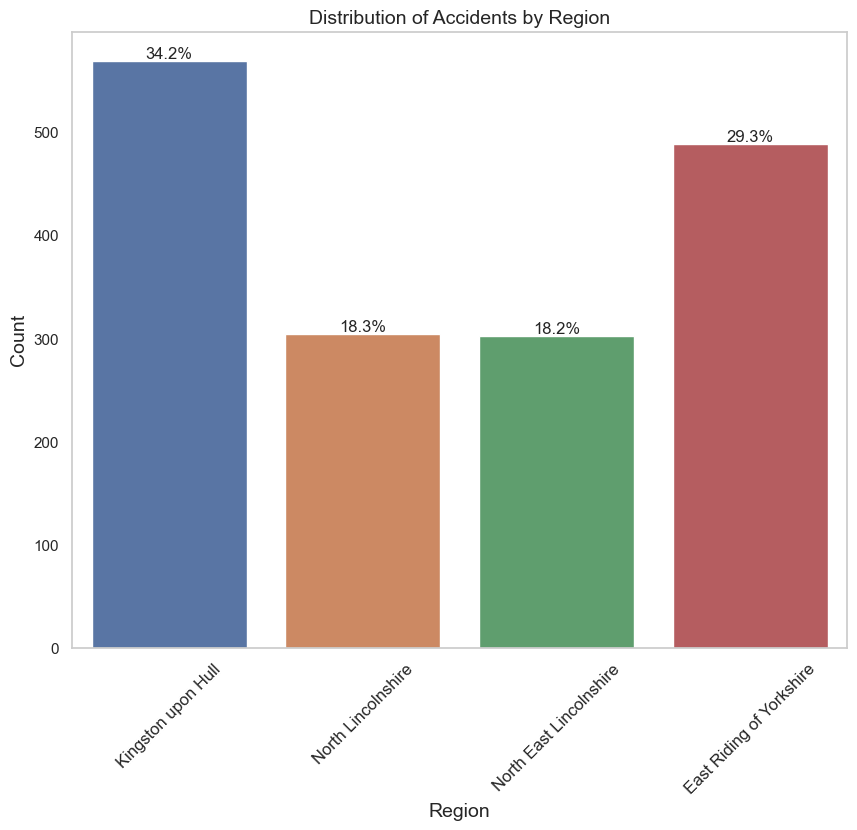

In [196]:
# Count plot of the regions 


# Create a count plot using seaborn
plt.figure(figsize=(10, 8))  # Optional: Adjust the figure size
sns.set(style="whitegrid")  # Optional: Set the plot style
ax = sns.countplot(x="Region", data=accident_loc_reg_df)

# Rotate x-axis labels for better readability
plt.xticks(rotation=45)

# Calculate and display percentages on top of the bars
total = len(accident_loc_reg_df)
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height() / total)
    x = p.get_x() + p.get_width() / 2
    y = p.get_height()
    ax.annotate(percentage, (x, y), ha='center', va='bottom')

# Set plot title and labels (optional)
plt.title("Distribution of Accidents by Region", fontsize=14)
plt.xlabel("Region", fontsize=14)
plt.ylabel("Count", fontsize=14)
plt.xticks(fontsize=12)
plt.grid(False)

# Show the plot
plt.show()

Based on the provided chart, it is evident that approximately 34.2% of the accidents occurred in Kingston upon Hull, making it the region with the highest number of accidents in the year 2020. Both North Lincolnshire and North East Lincolnshire regions had a similar occurrence rate, each accounting for an average of 18.2% of the total accidents in the same year.

### Implementing Clustering on the 'Filtered DataFrame'

### Feature Selection

Here we select the features for our clustering analysis. The features are 'longitude' and 'latitude'. 

In [197]:
# Select the features 'longitude' and 'latitude'
accident_cluster = accident_loc_reg_df[["longitude", "latitude"]]

In [198]:
# view the 'accident_cluster'
accident_cluster

,longitude,latitude
35821,-0.393424,53.744936
35822,-0.400627,53.744520
35823,-0.400523,53.744482
35824,-0.393720,53.744724
35825,-0.398868,53.744514
...,...,...
37479,-0.823599,53.520707
37480,-0.196631,53.741804
37481,-0.318108,53.773648
37482,-0.408728,53.843568


We shall be applying K-means algorithmn for our clustering analysis

#### Determine the Suitable Number of Clusters using Silhouette Scores

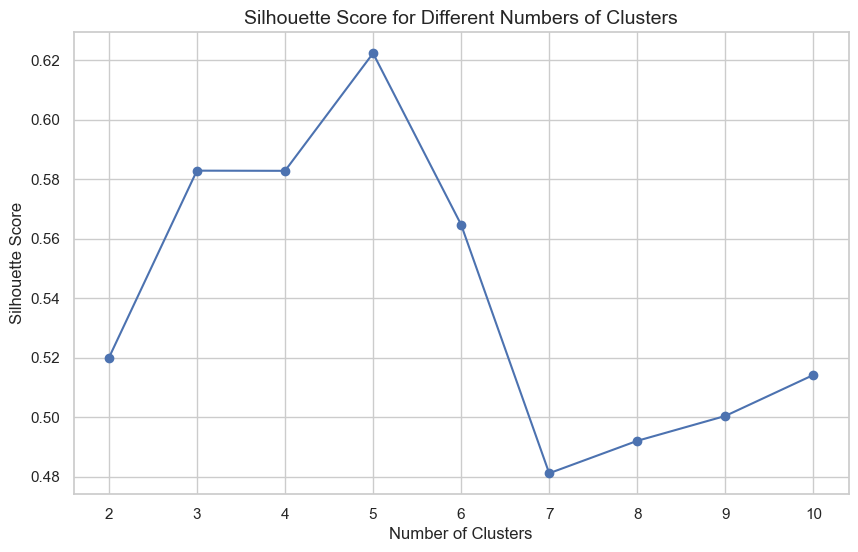

In [199]:
# code source: https://stackoverflow.com/questions/51138686/how-to-use-silhouette-score-in-k-means-clustering-from-sklearn-library

# Define the range of cluster numbers to try
min_clusters = 2
max_clusters = 10

# Initialize lists to store silhouette scores and cluster labels
silhouette_scores = []
cluster_labels_list = []

# Loop over different numbers of clusters
for n_clusters in range(min_clusters, max_clusters+1):
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(accident_cluster)
    silhouette_avg = silhouette_score(accident_cluster, cluster_labels)
    
    silhouette_scores.append(silhouette_avg)
    cluster_labels_list.append(cluster_labels)

# Plot the silhouette scores
plt.figure(figsize=(10, 6))
plt.plot(range(min_clusters, max_clusters+1), silhouette_scores, marker='o')
plt.xlabel("Number of Clusters", fontsize=12)
plt.ylabel("Silhouette Score", fontsize=12)
plt.title("Silhouette Score for Different Numbers of Clusters", fontsize=14)
plt.xticks(range(min_clusters, max_clusters+1))
plt.grid(True)
plt.show()

Based on the chart presented, the highest point on the plot corresponds to the optimal number of clusters, which is 5. This is indicated by the silhouette scores. Therefore, we will proceed to perform k-means clustering with 5 clusters

### Applying K-means algorithmn to the 'accident_cluster' dataframe, with number of clusters (5)

In [200]:
# create an instance class of K-means with number of cluster (5)
kmeans = KMeans(n_clusters=5)

In [201]:
# fit the K-means model to the data
kmeans.fit(accident_cluster)

KMeans(n_clusters=5)

In [202]:
# assign cluster labels to each data point in the dataset
labels = kmeans.predict(accident_cluster)

In [203]:
# extract the coordinate of the cluster centers (centroids) from the fitted K-means model
centroids = kmeans.cluster_centers_

In [204]:
# view the k-means labels
labels

array([4, 4, 4, ..., 4, 4, 4])

In [205]:
# view the centroids
centroids

array([[-0.09147249, 53.57621063],
       [-0.2715766 , 54.0433033 ],
       [-0.64704431, 53.58975577],
       [-0.82599074, 53.80968918],
       [-0.36222849, 53.75941016]])

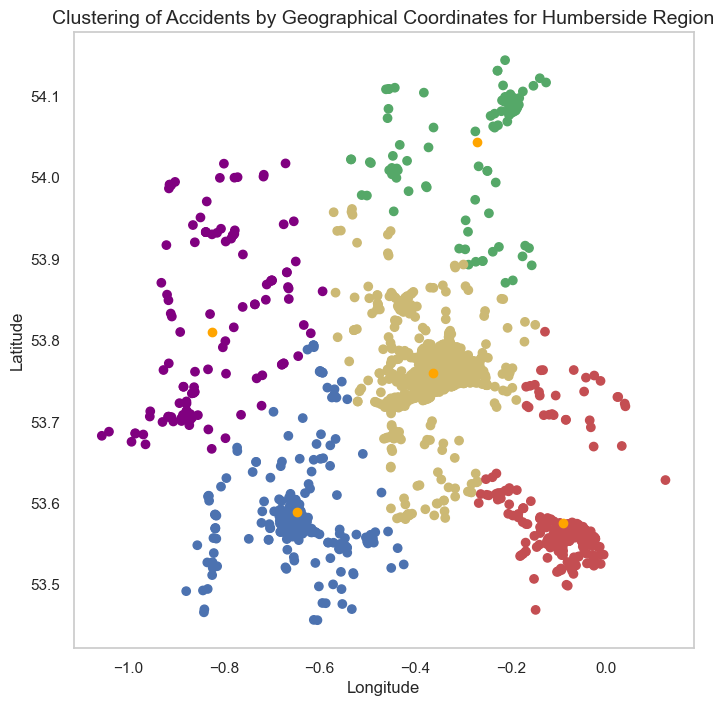

In [206]:
# Plot size
fig = plt.figure(figsize=(8, 8))

# add list of colors 
colmap = {0: 'r', 1: 'g', 2: 'b', 3: 'purple', 4: 'y'}

# Create the list of colors for each label in the 'labels' array
colors = [colmap[label] for label in labels]

# Create the scatter plot for clustered points and apply the colors
plt.scatter(accident_cluster['longitude'], accident_cluster['latitude'], c=colors)

# Plot the cluster centroids in orange
plt.scatter(centroids[:, 0], centroids[:, 1], color='orange')

# Axis labels
plt.ylabel("Latitude", fontsize=12)
plt.xlabel("Longitude", fontsize=12)
plt.title("Clustering of Accidents by Geographical Coordinates for Humberside Region", fontsize=14)
plt.grid(False)

plt.show();

### Using Geopandas to plot the accident cluster points in the Region

In [207]:
# Create a Point geometry from longitude and latitude
geometry = [Point(xy) for xy in zip(accident_cluster['longitude'], accident_cluster['latitude'])]

# Create a GeoDataFrame from the DataFrame
gdf = gpd.GeoDataFrame(accident_cluster, geometry=geometry)

In [208]:
# Add the 'labels' column to the DataFrame
accident_cluster['labels'] = labels

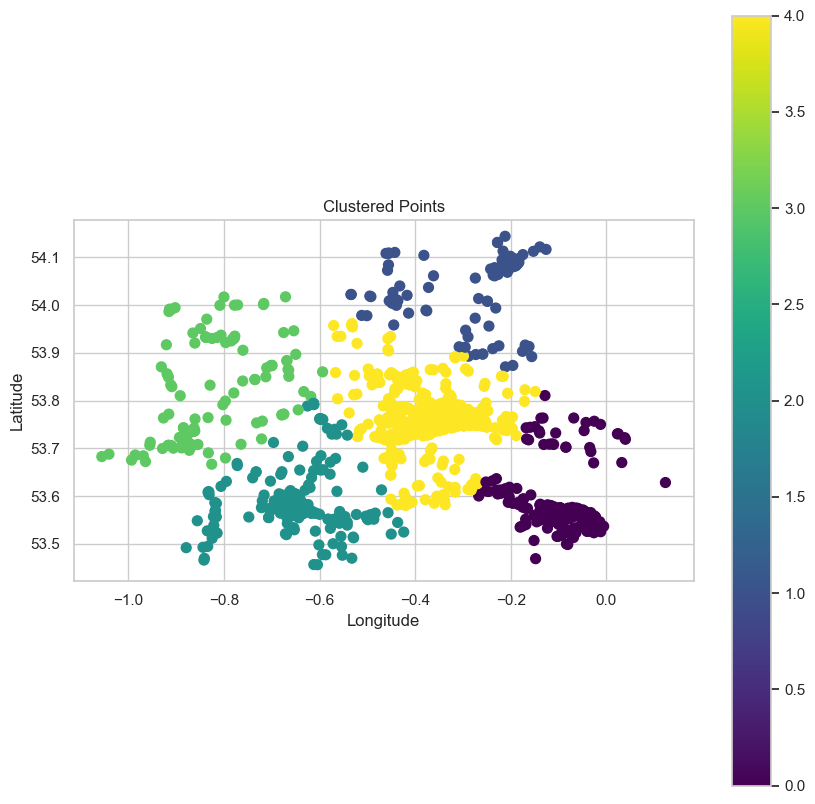

In [209]:
# Create a Point geometry from longitude and latitude
geometry = [Point(xy) for xy in zip(accident_cluster['longitude'], accident_cluster['latitude'])]

# Create a GeoDataFrame from the DataFrame
gdf = gpd.GeoDataFrame(accident_cluster, geometry=geometry)

# Assign the 'cluster_labels' column to the GeoDataFrame
gdf['labels'] = accident_cluster['labels']

# Plot the GeoDataFrame
fig, ax = plt.subplots(figsize=(10, 10))
gdf.plot(ax=ax, column='labels', cmap='viridis', markersize=50, legend=True)

plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.title("Clustered Points")
plt.show()

### Calculating the Silhouette score for the k-means 


In [210]:
kmeans = KMeans(5, random_state=0)
labels = kmeans.fit(accident_cluster).predict(accident_cluster)
silhouette_score(accident_cluster, labels, metric="euclidean")

0.90161566409894

Summary:
- According to the given information, the silhouette score is approximately 0.90 which indicates that the objects are well-clustered and are more similar to their own cluster than to neighboring clusters. This suggests that the clustering is of good quality and that the data points are well-separated into distinct clusters. In general silhouette scores above 0.7 indicate good clustering performance (Kate, 2020).

## Plotting the Accident Cluster Points on a Map

In [211]:
# code source: https://www.youtube.com/watch?v=zEeOaOcxu70

# Get the accident cluster points to plot 

cluster1 = accident_cluster[["latitude", "longitude"]][accident_cluster["labels"] == 0].values.tolist()
cluster2 = accident_cluster[["latitude", "longitude"]][accident_cluster["labels"] == 1].values.tolist()
cluster3 = accident_cluster[["latitude", "longitude"]][accident_cluster["labels"] == 2].values.tolist()
cluster4 = accident_cluster[["latitude", "longitude"]][accident_cluster["labels"] == 3].values.tolist()
cluster5 = accident_cluster[["latitude", "longitude"]][accident_cluster["labels"] == 4].values.tolist()

In [212]:
# define map features
map = folium.Map(location=[53.7695044, -0.3562201], zoom_start = 10, tiles = "openstreetmap")
map

In [213]:
# code source: https://www.youtube.com/watch?v=zEeOaOcxu70

# locate accident cluster points/locations on the map

for i in cluster1:
    folium.CircleMarker(i, radius=2, color="blue", fill_color="lightblue").add_to(map)
    
for i in cluster2:
    folium.CircleMarker(i, radius=2, color="red", fill_color="lightred").add_to(map)

for i in cluster3:
    folium.CircleMarker(i, radius=2, color="green", fill_color="lightgreen").add_to(map)

for i in cluster4:
    folium.CircleMarker(i, radius=2, color="purple", fill_color="lightpurple").add_to(map)

for i in cluster5:
    folium.CircleMarker(i, radius=2, color="brown", fill_color="lightbrown").add_to(map)

In [214]:
map

Analyzing the map depiction, it becomes apparent that Kingston upon Hull (Hull) had the highest occurrence of accidents in the year 2020, outpacing all other regions. A close second is North East Lincolnshire (Grimsby), signifying a notable concentration of accidents. Occupying the third spot is North Lincolnshire (Scunthorpe), while East Riding of Yorkshire (Bridlington) secures the fourth position. Notably, East Riding of Yorkshire (Goole) follows suit, establishing its presence. Subsequently, the remaining areas exhibit a declining pattern in terms of accident frequency. It also evident that some region encroached into other cluster points 

In [215]:
# code source: https://www.youtube.com/watch?v=zEeOaOcxu70

# Get the cluster points to plot
clusters = [
    accident_cluster[["latitude", "longitude"]][accident_cluster["labels"] == label].values.tolist()
    for label in range(5)
]

# Calculate the total number of accidents in each cluster
cluster_sizes = [len(cluster) for cluster in clusters]

# Define map features
map = folium.Map(location=[53.7695044, -0.3562201], zoom_start=10, tiles="openstreetmap")

# Create a MarkerCluster layer
marker_cluster = plugins.MarkerCluster().add_to(map)

# Loop through clusters and add markers
for label, cluster in enumerate(clusters):
    for location in cluster:
        folium.CircleMarker(
            location=location,
            radius=5,  # Adjust the radius as needed
            color="blue",  # Change the color as needed
            fill_color="blue",  # Change the fill color as needed
            fill_opacity=0.7,  # Adjust the fill opacity as needed
            popup=f"Total Accidents: {cluster_sizes[label]}"
        ).add_to(marker_cluster)
map

In the displayed map that illustrates the geographical distribution of accidents across the region, each individual marker corresponds to a specific accident location within a cluster. The popup associated with each marker reveals the total count of accidents within that particular cluster. The very first marker represents the comprehensive count of accidents, totaling 1663, encompassing the geographical areas of Humberside, Kingston upon Hull, East Riding of Yorkshire, and more.

Upon the initial zoom-in, you will encounter four distinct clusters of accidents within the aforementioned regions. Upon further zooming in, you will observe an increasing number of clusters, each associated with its respective tally of accidents or accident locations.

Notably, Kingston upon Hull (Hull) significantly surpasses other cities in terms of accident frequency, establishing its prominence in the dataset. 

In [216]:
# count of cluster
len(cluster1)   # The first cluster 

333

In [217]:
# count of cluster 
len(cluster2)             # The second cluster

110

In [218]:
# count of cluster 
len(cluster3)                 # The third cluster

261

In [219]:
# count of cluster 
len(cluster4)                # The forth cluster

128

In [220]:
# count of cluster 
len(cluster5)                  # The fifth cluster

831

## Question 6

## Using outlier detection methods, identify unusual entries in your data set. Should you keep these entries in your data? 

Here we shall be focusing on outliers in the accident dataset in year 2020.  

## Outlier Detection

In this section, our attention will be directed towards exploring the distribution of essential numerical columns through boxplots. The primary objective is to identify potential outliers within our dataset. To achieve this, we will employ a range of outlier detection methods, including:

- Boxplot Analysis: 
- Local Outlier Factor (LOF)
- Isolation Forest: 



### Boxplot Analysis

In this section, we will delve into the exploration of pertinent columns within our dataset by employing the boxplot visualization technique. This method will allow us to gain valuable insights into the distribution, central tendency, spread, and potential outliers present in these specific columns. By focusing on this visualization approach, we aim to uncover important patterns and anomalies within the data, contributing to a more comprehensive understanding of the underlying trends and characteristics.

In [221]:
# The accident data for year 2020
accident_df

,accident_index,accident_year,accident_reference,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,lsoa_of_accident_location,hour
0,2020010219808,2020,010219808,521389.0,175144.0,-0.254001,51.462262,1,3,1,...,1,9,9,0,0,1,3,2,E01004576,9
1,2020010220496,2020,010220496,529337.0,176237.0,-0.139253,51.470327,1,3,1,...,1,1,1,0,0,1,1,2,E01003034,13
2,2020010228005,2020,010228005,526432.0,182761.0,-0.178719,51.529614,1,3,1,...,4,1,2,0,0,1,1,2,E01004726,1
3,2020010228006,2020,010228006,538676.0,184371.0,-0.001683,51.541210,1,2,1,...,4,1,1,0,0,1,1,2,E01003617,1
4,2020010228011,2020,010228011,529324.0,181286.0,-0.137592,51.515704,1,3,1,...,4,1,1,0,0,1,1,2,E01004763,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91194,2020991027064,2020,991027064,343034.0,731654.0,-2.926320,56.473539,99,2,2,...,1,1,1,0,0,1,1,-1,-1,14
91195,2020991029573,2020,991029573,257963.0,658891.0,-4.267565,55.802353,99,3,1,...,1,1,1,0,0,1,2,-1,-1,15
91196,2020991030297,2020,991030297,383664.0,810646.0,-2.271903,57.186317,99,2,2,...,1,1,1,0,0,2,1,-1,-1,12
91197,2020991030900,2020,991030900,277161.0,674852.0,-3.968753,55.950940,99,3,2,...,1,1,1,0,0,1,2,-1,-1,14


In [222]:
# Filter out numerical columns 
num_columns = accident_df.select_dtypes(include=[np.number])
num_columns

,accident_year,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,day_of_week,...,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,hour
0,2020,521389.0,175144.0,-0.254001,51.462262,1,3,1,1,3,...,9,1,9,9,0,0,1,3,2,9
1,2020,529337.0,176237.0,-0.139253,51.470327,1,3,1,2,2,...,4,1,1,1,0,0,1,1,2,13
2,2020,526432.0,182761.0,-0.178719,51.529614,1,3,1,1,4,...,0,4,1,2,0,0,1,1,2,1
3,2020,538676.0,184371.0,-0.001683,51.541210,1,2,1,1,4,...,4,4,1,1,0,0,1,1,2,1
4,2020,529324.0,181286.0,-0.137592,51.515704,1,3,1,2,4,...,0,4,1,1,0,0,1,1,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91194,2020,343034.0,731654.0,-2.926320,56.473539,99,2,2,1,4,...,0,1,1,1,0,0,1,1,-1,14
91195,2020,257963.0,658891.0,-4.267565,55.802353,99,3,1,1,6,...,0,1,1,1,0,0,1,2,-1,15
91196,2020,383664.0,810646.0,-2.271903,57.186317,99,2,2,1,4,...,0,1,1,1,0,0,2,1,-1,12
91197,2020,277161.0,674852.0,-3.968753,55.950940,99,3,2,1,3,...,0,1,1,1,0,0,1,2,-1,14


According to the information provided, there are 91199 rows and 30 columns in the numerical (accident) dataset

In [223]:
# information on the datatypes in the numerical dataset
num_columns.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 91199 entries, 0 to 91198
Data columns (total 30 columns):
 #   Column                                       Non-Null Count  Dtype  
---  ------                                       --------------  -----  
 0   accident_year                                91199 non-null  int64  
 1   location_easting_osgr                        91199 non-null  float64
 2   location_northing_osgr                       91199 non-null  float64
 3   longitude                                    91199 non-null  float64
 4   latitude                                     91199 non-null  float64
 5   police_force                                 91199 non-null  int64  
 6   accident_severity                            91199 non-null  int64  
 7   number_of_vehicles                           91199 non-null  int64  
 8   number_of_casualties                         91199 non-null  int64  
 9   day_of_week                                  91199 non-null  int64  
 10

In [224]:
# Summary statistics of the numerical columns
num_columns.describe()

,accident_year,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,day_of_week,...,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,hour
count,91199.0,91199.000000,9.119900e+04,91199.000000,91199.000000,91199.000000,91199.000000,91199.000000,91199.000000,91199.000000,...,91199.000000,91199.000000,91199.000000,91199.000000,91199.000000,91199.000000,91199.000000,91199.000000,91199.000000,91199.000000
mean,2020.0,456489.266779,2.737545e+05,-1.189236,52.350983,27.488043,2.768232,1.835272,1.267382,4.121558,...,1.185309,2.065308,1.702047,1.391583,0.244740,0.180594,1.323205,1.415268,1.721521,13.811928
std,0.0,93505.601190,1.473425e+05,1.367682,1.327491,24.548964,0.456682,0.677272,0.681473,1.932200,...,2.445924,1.747690,1.845786,0.925690,1.318554,1.149791,0.468031,0.665469,0.801491,5.051206
min,2020.0,65947.000000,1.271500e+04,-7.497375,49.970479,1.000000,1.000000,1.000000,1.000000,1.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,1.000000,-1.000000,-1.000000,0.000000
25%,2020.0,392900.500000,1.745735e+05,-2.107417,51.457259,4.000000,3.000000,1.000000,1.000000,2.000000,...,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,2.000000,10.000000
50%,2020.0,465545.000000,2.085990e+05,-1.046912,51.763385,22.000000,3.000000,2.000000,1.000000,4.000000,...,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,2.000000,14.000000
75%,2020.0,530167.000000,3.783435e+05,-0.125277,53.297063,45.000000,3.000000,2.000000,1.000000,6.000000,...,0.000000,4.000000,1.000000,2.000000,0.000000,0.000000,2.000000,2.000000,2.000000,18.000000
max,2020.0,655138.000000,1.184351e+06,1.756257,60.541144,99.000000,3.000000,13.000000,41.000000,7.000000,...,9.000000,7.000000,9.000000,9.000000,9.000000,9.000000,3.000000,3.000000,2.000000,23.000000


Based on the summary statistics presented, there are most columns have minimum values of '-1', these are likely outliers in these columns.

### Boxplot Analysis

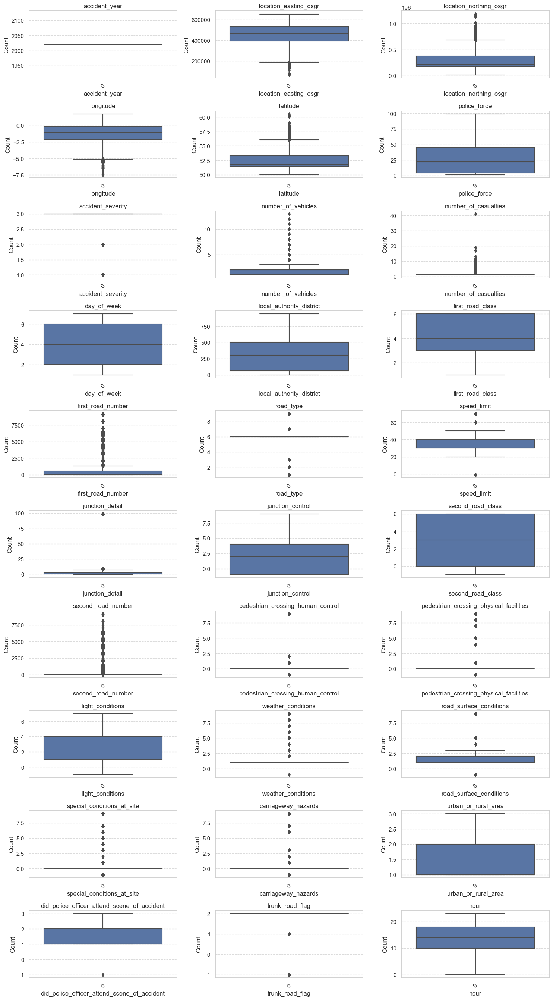

In [225]:
# Columns to plot for boxplot
columns_to_plot = num_columns.columns

# Plot boxplots for each selected column as subplots
num_cols = 3  # Number of columns for subplots
num_rows = (len(columns_to_plot) - 1) // num_cols + 1  # Calculate the number of rows based on the number of columns to plot

plt.figure(figsize=(15, 27))  # Adjust the figure size to accommodate all subplots
for i, column in enumerate(columns_to_plot):
    plt.subplot(num_rows, num_cols, i + 1)
    sns.boxplot(data=num_columns[column])  # Assuming numerical_columns contains your data
    plt.title(column)
    plt.xlabel(column)
    plt.ylabel("Count")
    plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
    plt.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()

The presented boxplots clearly indicate the presence of outliers within our dataset. These outliers can significantly impact the accuracy and reliability of our analysis. Therefore, it is imperative to employ outlier detection methods to address this issue more comprehensively. These methods will enable us to identify, isolate, and potentially handle the outliers appropriately, leading to a more accurate analysis and model building process. By taking the necessary steps to treat these outliers, we aim to enhance the robustness of our dataset and subsequently improve the quality of our analysis results. 

### Applying Local Outlier Factor (LOF) Method on Longitude and Latitude 

In [226]:
# Extract the 'longitude' and 'latitude' 
LOF_loc = num_columns[["longitude", "latitude"]]

In [227]:
# View the data
LOF_loc

,longitude,latitude
0,-0.254001,51.462262
1,-0.139253,51.470327
2,-0.178719,51.529614
3,-0.001683,51.541210
4,-0.137592,51.515704
...,...,...
91194,-2.926320,56.473539
91195,-4.267565,55.802353
91196,-2.271903,57.186317
91197,-3.968753,55.950940


In [228]:
# Create an instance of the object with contamination of 0.0025
lof_model = LocalOutlierFactor(contamination=0.0025)

In [229]:
# Run fit and predict on the data and save in a variable 'y_pred' 
y_pred = lof_model.fit_predict(LOF_loc)

In [230]:
LOF_Scores = lof_model.negative_outlier_factor_

LOF_pred = pd.Series(y_pred).replace([-1, 1], [1, 0])

# The normal data
LOF_anomalies = np.array(LOF_loc)[LOF_pred == 1]

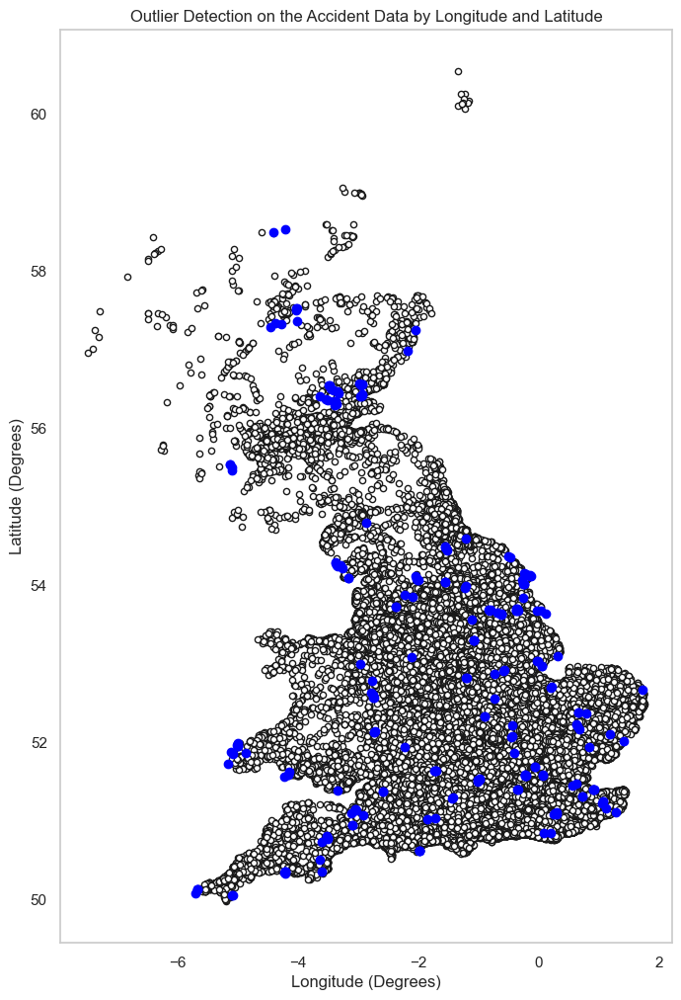

In [231]:
# The data is loaded in 'LOF_loc' and 'LOF_anomalies' as numpy ndarray

plt.figure(figsize=(8, 12))

# Scatter plot for the majority of data points (non-anomalies)
plt.scatter(LOF_loc["longitude"], LOF_loc["latitude"], c='white', s=20, edgecolor='k')

# Convert the 'LOF_anomalies' ndarray into a DataFrame
LOF_anomalies_df = pd.DataFrame(LOF_anomalies, columns=["longitude", "latitude"])

# Scatter plot for anomalies (assuming the columns exist)
plt.scatter(LOF_anomalies_df['longitude'], LOF_anomalies_df['latitude'], c='blue')

# labels
plt.xlabel("Longitude (Degrees)")
plt.ylabel("Latitude (Degrees)")
plt.title("Outlier Detection on the Accident Data by Longitude and Latitude")
plt.grid(False)


plt.show()

The chart highlights a distinct pattern where the blue data points, identifiable as outliers, visibly diverge from the cluster of normal data points. This conspicuous deviation serves as a clear illustration of univariate outliers, falling within the category of mild outliers due to their relatively subtle departure from the norm. Mild outliers, also known as "minor outliers" or "moderate outliers," are data points that exhibit a slight deviation from the overall pattern of a dataset. These outliers are not significantly different from the rest of the data points and may not have a substantial impact on the analysis or modeling being performed. They are generally considered less extreme than other types of outliers. 


In [232]:
# Add the y_pred scores to your dataframe 
LOF_loc['y_pred'] = y_pred

In [233]:
# inspecting the 'df_Lof_num' to view the columns 'y_pred'
LOF_loc

,longitude,latitude,y_pred
0,-0.254001,51.462262,1
1,-0.139253,51.470327,1
2,-0.178719,51.529614,1
3,-0.001683,51.541210,1
4,-0.137592,51.515704,1
...,...,...,...
91194,-2.926320,56.473539,1
91195,-4.267565,55.802353,1
91196,-2.271903,57.186317,1
91197,-3.968753,55.950940,1


In [234]:
# View the records of non-outliers
non_outliers = LOF_loc[LOF_loc["y_pred"]==1]
non_outliers

,longitude,latitude,y_pred
0,-0.254001,51.462262,1
1,-0.139253,51.470327,1
2,-0.178719,51.529614,1
3,-0.001683,51.541210,1
4,-0.137592,51.515704,1
...,...,...,...
91194,-2.926320,56.473539,1
91195,-4.267565,55.802353,1
91196,-2.271903,57.186317,1
91197,-3.968753,55.950940,1


In [235]:
# View the records of outliers
outliers = LOF_loc[LOF_loc['y_pred']==-1]
outliers

,longitude,latitude,y_pred
2084,-0.218375,51.572210,-1
5168,-0.213525,51.574456,-1
6812,-0.213001,51.573836,-1
8678,0.061024,51.580232,-1
8782,-0.222733,51.578849,-1
...,...,...,...
90390,-2.186363,56.983913,-1
90521,-4.287379,57.324954,-1
90745,-3.403505,56.345372,-1
90979,-5.129652,55.532958,-1


Given the details provided, the Local Outlier Factor (LOF) algorithm was applied with a contamination level of 0.0025. The model identified a total of 228 records within the data points (geographical coordinates) that are considered outliers and 90971 records as non-outliers according to the LOF scores. 

### Applying Local Outlier Factor (LOF) Method on Longitude and Latitude (Humberside Region)

In [236]:
# save a copy of the dataset
LOF_loc_Hum = accident_cluster.copy()

In [237]:
# get the features
LOF_Hum = LOF_loc_Hum[["longitude", "latitude"]]

In [238]:
# Create an instance of the object with contamination of 0.0025
LOF_model = LocalOutlierFactor(contamination=0.0025)

In [239]:
# Run fit and predict on the data and save in a variable 'y_pred1' 
y_pred1 = LOF_model.fit_predict(LOF_Hum)

In [240]:
LOF_Scores_Hum = LOF_model.negative_outlier_factor_

LOF_pred1 = pd.Series(y_pred1).replace([-1, 1], [1, 0])

# The normal data 
LOF_anomalies1 = np.array(LOF_Hum)[LOF_pred1 == 1]

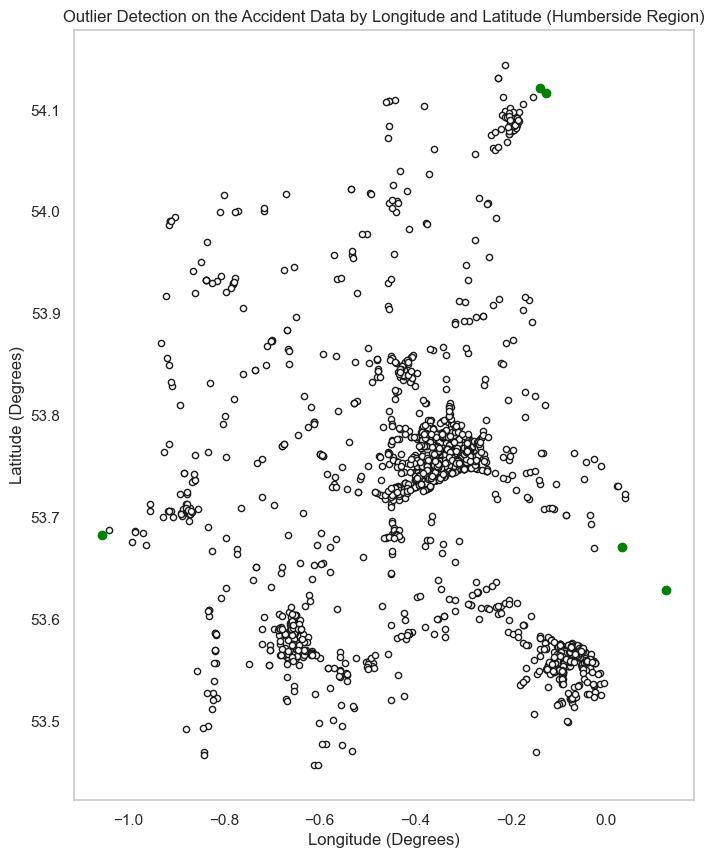

In [241]:
# The data is loaded in 'LOF_loc' and 'LOF_anomalies' as numpy ndarray

plt.figure(figsize=(8, 10))

# Scatter plot for the majority of data points (non-anomalies)
plt.scatter(LOF_Hum["longitude"], LOF_Hum["latitude"], c='white', s=20, edgecolor='k')

# Convert the 'LOF_anomalies' ndarray into a DataFrame
LOF_anomalies_df = pd.DataFrame(LOF_anomalies1, columns=["longitude", "latitude"])

# Scatter plot for anomalies (assuming the columns exist)
plt.scatter(LOF_anomalies_df['longitude'], LOF_anomalies_df['latitude'], c='green')

# labels
plt.xlabel("Longitude (Degrees)")
plt.ylabel("Latitude (Degrees)")
plt.title("Outlier Detection on the Accident Data by Longitude and Latitude (Humberside Region)", fontsize=12)
plt.grid(False)


plt.show()

The chart brings attention to a discernible pattern wherein the green data points, discerned as outliers, exist within the confines of the normal data points. This divergence manifests as a clear depiction of univariate outliers, aligned with the realm of mild outliers given their modest divergence from the established norm.

In [242]:
# Add the y_pred1 scores to your dataframe 
LOF_Hum['y_pred1'] = y_pred1

In [243]:
# inspecting the 'LOF_Hum' to view the columns 'y_pred1'
LOF_Hum

,longitude,latitude,y_pred1
35821,-0.393424,53.744936,1
35822,-0.400627,53.744520,1
35823,-0.400523,53.744482,1
35824,-0.393720,53.744724,1
35825,-0.398868,53.744514,1
...,...,...,...
37479,-0.823599,53.520707,1
37480,-0.196631,53.741804,1
37481,-0.318108,53.773648,1
37482,-0.408728,53.843568,1


In [244]:
# View the records of non-outliers
non_outliers = LOF_Hum[LOF_Hum["y_pred1"]==1]
non_outliers

,longitude,latitude,y_pred1
35821,-0.393424,53.744936,1
35822,-0.400627,53.744520,1
35823,-0.400523,53.744482,1
35824,-0.393720,53.744724,1
35825,-0.398868,53.744514,1
...,...,...,...
37479,-0.823599,53.520707,1
37480,-0.196631,53.741804,1
37481,-0.318108,53.773648,1
37482,-0.408728,53.843568,1


In [245]:
# View the records of outliers
outliers = LOF_Hum[LOF_Hum['y_pred1']==-1]
outliers

,longitude,latitude,y_pred1
37307,0.123813,53.628577,-1
37308,0.032434,53.670403,-1
37428,-0.125999,54.116532,-1
37429,-0.139122,54.121760,-1
37466,-1.055770,53.682905,-1


Given the details provided, the Local Outlier Factor (LOF) algorithm was applied with a contamination level of 0.0025. The model identified a total of 5 records of the data points (geographical coordinates) within Humberside region as outliers and 1658 records as non-outliers according to the LOF scores. 

### Applying Isolation Forest Method on Numerical (Accident) Data

In [246]:
# Create a copy of the numrerical data
ISF_num = num_columns.copy()

In [247]:
# Create an isolation forest object with contamination of 0.01
iforest_model = IsolationForest(contamination = 0.01)

In [248]:
# Fit the isolation forest to the numerical data
iforest_model.fit(ISF_num)

IsolationForest(contamination=0.01)

In [249]:
# Run the “predict” method on the data frame to get an array with flags indicating if the data point is an outlier or not
if_scores = iforest_model.decision_function(ISF_num)
y_pred_isf = iforest_model.predict(ISF_num)

In [250]:
# Print the number of outliers detected
number_outliers = (y_pred_isf == -1).sum()
print("Number of outliers detected:", number_outliers)

Number of outliers detected: 912


In [251]:
# Add the y_pred scores to your dataframe 
ISF_num['y_pred_isf'] = y_pred_isf

In [252]:
# inspecting the 'ISF_num' to view the columns 'y_pred'
ISF_num

,accident_year,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,day_of_week,...,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,hour,y_pred_isf
0,2020,521389.0,175144.0,-0.254001,51.462262,1,3,1,1,3,...,1,9,9,0,0,1,3,2,9,1
1,2020,529337.0,176237.0,-0.139253,51.470327,1,3,1,2,2,...,1,1,1,0,0,1,1,2,13,1
2,2020,526432.0,182761.0,-0.178719,51.529614,1,3,1,1,4,...,4,1,2,0,0,1,1,2,1,1
3,2020,538676.0,184371.0,-0.001683,51.541210,1,2,1,1,4,...,4,1,1,0,0,1,1,2,1,1
4,2020,529324.0,181286.0,-0.137592,51.515704,1,3,1,2,4,...,4,1,1,0,0,1,1,2,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91194,2020,343034.0,731654.0,-2.926320,56.473539,99,2,2,1,4,...,1,1,1,0,0,1,1,-1,14,1
91195,2020,257963.0,658891.0,-4.267565,55.802353,99,3,1,1,6,...,1,1,1,0,0,1,2,-1,15,1
91196,2020,383664.0,810646.0,-2.271903,57.186317,99,2,2,1,4,...,1,1,1,0,0,2,1,-1,12,1
91197,2020,277161.0,674852.0,-3.968753,55.950940,99,3,2,1,3,...,1,1,1,0,0,1,2,-1,14,1


In [253]:
# View the records of outliers
outliers_ISF = ISF_num[ISF_num['y_pred_isf']==-1]
outliers_ISF

,accident_year,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,day_of_week,...,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,hour,y_pred_isf
33,2020,531124.0,189815.0,-0.108489,51.591936,1,3,2,1,4,...,4,9,9,9,0,1,3,2,20,-1
154,2020,523741.0,185810.0,-0.216421,51.557612,1,3,2,1,7,...,7,2,9,9,9,1,3,2,19,-1
218,2020,525786.0,172277.0,-0.191758,51.435537,1,3,2,1,2,...,1,9,9,0,9,1,3,2,15,-1
305,2020,531631.0,183668.0,-0.103473,51.536578,1,2,1,1,3,...,4,9,9,9,9,1,3,2,18,-1
447,2020,535595.0,184692.0,-0.045959,51.544842,1,3,2,1,5,...,1,9,9,9,9,1,3,2,14,-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91159,2020,312914.0,698211.0,-3.404037,56.168563,99,3,1,1,1,...,6,1,2,0,2,2,1,-1,1,-1
91167,2020,366456.0,748951.0,-2.548388,56.631179,99,2,2,5,2,...,6,1,4,0,0,2,1,-1,16,-1
91177,2020,327696.0,1019412.0,-3.262293,59.055529,99,3,1,2,3,...,6,2,2,0,0,2,1,-1,17,-1
91183,2020,277989.0,650526.0,-3.944559,55.732713,99,2,3,4,6,...,1,1,1,0,0,1,2,-1,16,-1


In [254]:
# View the records of non-outliers 
non_outliers_ISF = ISF_num[ISF_num['y_pred_isf']==1]
non_outliers_ISF

,accident_year,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,day_of_week,...,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,hour,y_pred_isf
0,2020,521389.0,175144.0,-0.254001,51.462262,1,3,1,1,3,...,1,9,9,0,0,1,3,2,9,1
1,2020,529337.0,176237.0,-0.139253,51.470327,1,3,1,2,2,...,1,1,1,0,0,1,1,2,13,1
2,2020,526432.0,182761.0,-0.178719,51.529614,1,3,1,1,4,...,4,1,2,0,0,1,1,2,1,1
3,2020,538676.0,184371.0,-0.001683,51.541210,1,2,1,1,4,...,4,1,1,0,0,1,1,2,1,1
4,2020,529324.0,181286.0,-0.137592,51.515704,1,3,1,2,4,...,4,1,1,0,0,1,1,2,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91194,2020,343034.0,731654.0,-2.926320,56.473539,99,2,2,1,4,...,1,1,1,0,0,1,1,-1,14,1
91195,2020,257963.0,658891.0,-4.267565,55.802353,99,3,1,1,6,...,1,1,1,0,0,1,2,-1,15,1
91196,2020,383664.0,810646.0,-2.271903,57.186317,99,2,2,1,4,...,1,1,1,0,0,2,1,-1,12,1
91197,2020,277161.0,674852.0,-3.968753,55.950940,99,3,2,1,3,...,1,1,1,0,0,1,2,-1,14,1


Based on the information provided, the Isolation Forest (IF) algorithm was employed using a contamination level of 0.01. This specific configuration aimed to detect anomalies within the dataset, and the results indicate that a total of 912 records were identified as outliers based on the IF scores. The choice of a contamination level of 0.01 implies that approximately 1% of the data is expected to be outliers according to the assumptions made during the analysis. However, the decision on keeping these outliers solely depends on the domain knowledge and specific context of the data.

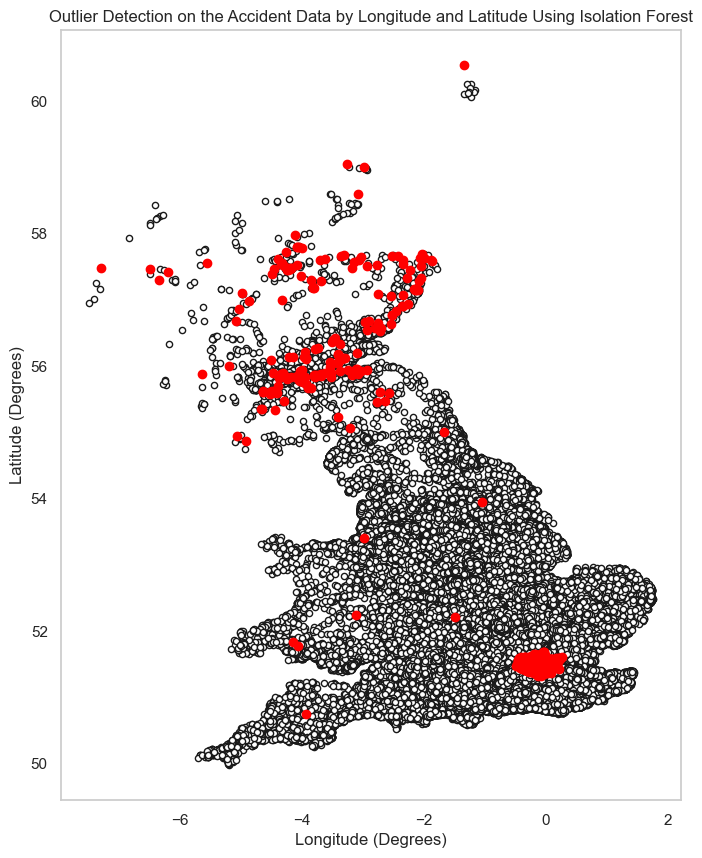

In [255]:
# The data is loaded in 'LOF_loc' and 'LOF_anomalies' as numpy ndarray

plt.figure(figsize=(8, 10))

# Scatter plot for the majority of data points (non-anomalies)
plt.scatter(ISF_num["longitude"], ISF_num["latitude"], c='white', s=20, edgecolor='k')

# Convert the 'LOF_anomalies' ndarray into a DataFrame
LOF_anomalies_df = pd.DataFrame(outliers_ISF, columns=["longitude", "latitude"])

# Scatter plot for anomalies (assuming the columns exist)
plt.scatter(LOF_anomalies_df['longitude'], LOF_anomalies_df['latitude'], c='red')

# labels
plt.xlabel("Longitude (Degrees)")
plt.ylabel("Latitude (Degrees)")
plt.title("Outlier Detection on the Accident Data by Longitude and Latitude Using Isolation Forest", fontsize=12)
plt.grid(False)


plt.show()

The IF algorithm detected 912 outlier records among 90287 data points in the accident data in 2020 using a contamination level of 0.01. The geographical coordinates (longitude and latitude) were plotted, and the outliers depicted in red on the chart presented, exhibits mild deviations from the usual points. 

In [256]:
num_columns

,accident_year,location_easting_osgr,location_northing_osgr,longitude,latitude,police_force,accident_severity,number_of_vehicles,number_of_casualties,day_of_week,...,pedestrian_crossing_physical_facilities,light_conditions,weather_conditions,road_surface_conditions,special_conditions_at_site,carriageway_hazards,urban_or_rural_area,did_police_officer_attend_scene_of_accident,trunk_road_flag,hour
0,2020,521389.0,175144.0,-0.254001,51.462262,1,3,1,1,3,...,9,1,9,9,0,0,1,3,2,9
1,2020,529337.0,176237.0,-0.139253,51.470327,1,3,1,2,2,...,4,1,1,1,0,0,1,1,2,13
2,2020,526432.0,182761.0,-0.178719,51.529614,1,3,1,1,4,...,0,4,1,2,0,0,1,1,2,1
3,2020,538676.0,184371.0,-0.001683,51.541210,1,2,1,1,4,...,4,4,1,1,0,0,1,1,2,1
4,2020,529324.0,181286.0,-0.137592,51.515704,1,3,1,2,4,...,0,4,1,1,0,0,1,1,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91194,2020,343034.0,731654.0,-2.926320,56.473539,99,2,2,1,4,...,0,1,1,1,0,0,1,1,-1,14
91195,2020,257963.0,658891.0,-4.267565,55.802353,99,3,1,1,6,...,0,1,1,1,0,0,1,2,-1,15
91196,2020,383664.0,810646.0,-2.271903,57.186317,99,2,2,1,4,...,0,1,1,1,0,0,2,1,-1,12
91197,2020,277161.0,674852.0,-3.968753,55.950940,99,3,2,1,3,...,0,1,1,1,0,0,1,2,-1,14


## Question 7

## Can you develop a classification model using the provided data that accurately predicts fatal injuries sustained in road traffic accidents, with the aim of informing and improving road safety measures?


### Feature Selection

Here we shall merge the accident, vehicle and causlty table, and select some relevant feature that accurately predicts factal injuries sustained in road traffic accidents

In [257]:
# merge the accident, vehicle and casualty dataset
merged_df = accident_df.merge(vehicle_df, on='accident_index').merge(casualty_df, on='accident_index')

In [258]:
# Get the features relevant for our analysis 
Relevant_columns = merged_df[["longitude", "latitude", "speed_limit", "road_surface_conditions", "weather_conditions", 
           "towing_and_articulation", "hit_object_in_carriageway", "light_conditions", "vehicle_manoeuvre", 
           "accident_severity", "time", "day_of_week", "road_type", "junction_detail", "special_conditions_at_site", 
           "junction_control", "police_force", "urban_or_rural_area", "did_police_officer_attend_scene_of_accident", 
           "lsoa_of_accident_location", "sex_of_driver", "age_of_driver", "driver_imd_decile", "engine_capacity_cc", 
           "journey_purpose_of_driver", "casualty_class", "casualty_severity", "pedestrian_location", "pedestrian_movement", 
           "car_passenger", "bus_or_coach_passenger", "pedestrian_road_maintenance_worker"]]

### Data Preprocessing 

In [259]:
# View the columns
Relevant_columns

,longitude,latitude,speed_limit,road_surface_conditions,weather_conditions,towing_and_articulation,hit_object_in_carriageway,light_conditions,vehicle_manoeuvre,accident_severity,...,driver_imd_decile,engine_capacity_cc,journey_purpose_of_driver,casualty_class,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker
0,-0.254001,51.462262,20,9,9,9,0,1,5,3,...,4,1968,6,3,3,9,5,0,0,0
1,-0.139253,51.470327,20,1,1,0,0,1,4,3,...,7,1395,2,3,3,1,1,0,0,0
2,-0.139253,51.470327,20,1,1,0,0,1,4,3,...,7,1395,2,3,3,1,1,0,0,0
3,-0.178719,51.529614,30,2,1,0,0,4,18,3,...,-1,-1,6,3,3,5,9,0,0,0
4,-0.001683,51.541210,30,1,1,0,0,4,18,2,...,2,1798,1,3,2,4,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
220430,-2.271903,57.186317,60,1,1,0,0,1,7,2,...,7,1968,1,1,2,0,0,0,0,0
220431,-2.271903,57.186317,60,1,1,0,0,1,16,2,...,9,1301,5,1,2,0,0,0,0,0
220432,-3.968753,55.950940,30,1,1,0,0,1,7,3,...,5,1995,6,1,3,0,0,0,0,0
220433,-3.968753,55.950940,30,1,1,0,0,1,18,3,...,9,-1,6,1,3,0,0,0,0,0


### Treating wrong entries in the DataFrame columns

In [260]:
# did police officer attend scence of accident column
# count of series of unique values in did police officer attend scence of accident column
Relevant_columns["did_police_officer_attend_scene_of_accident"].value_counts()

 1    158740
 2     42923
 3     18771
-1         1
Name: did_police_officer_attend_scene_of_accident, dtype: int64

Based on the given information, there is 1 record having '-1' entries in the did police officer attend scence of accident column. According to 'Road Safety Open Dataset Data Guide', -1 entries in did police officer attend scence of accident column indicates "Data missing or out of range". However, since did police officer attend scence of accident is a categorical variable and has less occurences of '-1' entries, the '-1' entries shall be replaced with the modal value.

In [261]:
# Replace -1 entries with the modal value 
Relevant_columns["did_police_officer_attend_scene_of_accident"] = Relevant_columns["did_police_officer_attend_scene_of_accident"].replace(-1, Relevant_columns["did_police_officer_attend_scene_of_accident"].mode()[0]) 

In [262]:
# lsoa of accident location
# check for -1 entries 
Relevant_columns["lsoa_of_accident_location"].value_counts()

-1           9001
E01016012     166
E01023722     128
E01032739     128
E01004736     123
             ... 
E01021040       1
E01009244       1
E01009136       1
E01021513       1
E01018664       1
Name: lsoa_of_accident_location, Length: 25931, dtype: int64

Based on the given information, there are 9000 records having '-1' entries in the lsoa of accident location column. According to 'Road Safety Open Dataset Data Guide', -1 entries in lsoa of accident location column indicates "Data missing or out of range". However, since lsoa of accident location is a categorical variable, the '-1' entries shall be replaced with the modal value.

In [263]:
# Replace -1 entries with the modal value 
Relevant_columns["lsoa_of_accident_location"] = Relevant_columns["lsoa_of_accident_location"].replace(-1, Relevant_columns["lsoa_of_accident_location"].mode()[0]) 

In [264]:
# age of driver
# check for -1 entries 
Relevant_columns["age_of_driver"].value_counts()

-1      27373
 30      6948
 29      4990
 28      4908
 25      4907
        ...  
 97         4
 98         4
 99         3
 3          2
 100        1
Name: age_of_driver, Length: 99, dtype: int64

Based on the given information, there are 27373 records having '-1' entries in the age of driver column. According to 'Road Safety Open Dataset Data Guide', -1 entries in age of driver column indicates "Data missing or out of range". However, since age of driver is a numerical variable, the '-1' entries shall be replaced with the median value.

In [265]:
# Replace -1 entries with the median value 
Relevant_columns["age_of_driver"] = Relevant_columns["age_of_driver"].replace(-1, Relevant_columns["age_of_driver"].median()) 

In [266]:
# driver imd decile
# check for -1 entries 
Relevant_columns["driver_imd_decile"].value_counts()

-1     38272
 2     21896
 3     21386
 1     21091
 4     20079
 5     19428
 6     18405
 7     16678
 8     15563
 9     14860
 10    12777
Name: driver_imd_decile, dtype: int64

Based on the given information, there are 38272 records having '-1' entries in the driver imd decile column. According to 'Road Safety Open Dataset Data Guide', -1 entries in driver imd decile column indicates "Data missing or out of range". However, since driver imd decile is a categorical variable, the '-1' entries shall be replaced with the modal value.

In [267]:
# Replace -1 entries with the modal value 
Relevant_columns["driver_imd_decile"] = Relevant_columns["driver_imd_decile"].replace(-1, Relevant_columns["driver_imd_decile"].mode()[0])

In [268]:
# engine capacity cc
# check for -1 entries 
Relevant_columns["engine_capacity_cc"].value_counts()

-1       51172
 1598    12830
 1995     7761
 1968     7612
 998      6587
         ...  
 6500        1
 192         1
 1310        1
 6124        1
 6781        1
Name: engine_capacity_cc, Length: 985, dtype: int64

Based on the given information, there are 51172 records having '-1' entries in the engine capacity cc column. According to 'Road Safety Open Dataset Data Guide', -1 entries in engine capacity cc column indicates "Data missing or out of range". However, since engine capacity cc is a numerical variable, the '-1' entries shall be replaced with the median value.

In [269]:
# Replace -1 entries with the modal value 
Relevant_columns["engine_capacity_cc"] = Relevant_columns["engine_capacity_cc"].replace(-1, Relevant_columns["engine_capacity_cc"].median())

In [270]:
# journey purpose of driver
# check for -1 entries 
Relevant_columns["journey_purpose_of_driver"].value_counts()

 6    128428
 5     37226
 1     29940
 2     21615
 3      2303
 4       692
-1       231
Name: journey_purpose_of_driver, dtype: int64

Based on the given information, there are 231 records having '-1' entries in the journey purpose of driver column. According to 'Road Safety Open Dataset Data Guide', -1 entries in journey purpose of driver column indicates "Data missing or out of range". However, since journey purpose of driver is a categorical variable and has less occurences of '-1' entries, the '-1' entries shall be replaced with the modal value.

In [271]:
# Replace -1 entries with the modal value 
Relevant_columns["journey_purpose_of_driver"] = Relevant_columns["journey_purpose_of_driver"].replace(-1, Relevant_columns["journey_purpose_of_driver"].mode()[0]) 

In [272]:
# casualty class
# check for -1 entries 
Relevant_columns["casualty_class"].value_counts()

1    161430
2     42995
3     16010
Name: casualty_class, dtype: int64

According to the given information, there are no missing or wrongly imputed entries in casualty class column

In [273]:
# casualty severity
# check for -1 entries 
Relevant_columns["casualty_severity"].value_counts()

3    182535
2     35332
1      2568
Name: casualty_severity, dtype: int64

According to the given information, there are no missing or wrongly imputed entries in casualty severity column

In [274]:
# pedestrian location
# check for -1 entries 
Relevant_columns["pedestrian_location"].value_counts()

 0     204425
 5       6027
 1       2494
 6       2044
 9       1999
 10      1576
 4        859
 8        816
 7        100
 2         71
 3         22
-1          2
Name: pedestrian_location, dtype: int64

Based on the given information, there are 2 records having '-1' entries in the pedestian location column. According to 'Road Safety Open Dataset Data Guide', -1 entries in pedestian location column indicates "Data missing or out of range". However, since pedestian location is a categorical variable and has less occurences of '-1' entries, the '-1' entries shall be replaced with the modal value.

In [275]:
# Replace -1 entries with the modal value 
Relevant_columns["pedestrian_location"] = Relevant_columns["pedestrian_location"].replace(-1, Relevant_columns["pedestrian_location"].mode()[0]) 

In [276]:
# pedestrian movement
# check for -1 entries 
Relevant_columns["pedestrian_movement"].value_counts()

 0    204423
 9      4750
 1      4719
 3      3178
 5      1024
 2       791
 4       600
 8       442
 7       375
 6       131
-1         2
Name: pedestrian_movement, dtype: int64

Based on the given information, there are 2 records having '-1' entries in the pedestian movement column. According to 'Road Safety Open Dataset Data Guide', -1 entries in pedestian movement column indicates "Data missing or out of range". However, since pedestian movement is a categorical variable and has less occurences of '-1' entries, the '-1' entries shall be replaced with the modal value.

In [277]:
# car passenger
# check for -1 entries 
Relevant_columns["car_passenger"].value_counts()

 0    181913
 1     24653
 2     13031
-1       631
 9       207
Name: car_passenger, dtype: int64

Based on the given information, there are 631 records having '-1' entries in the car passenger column. According to 'Road Safety Open Dataset Data Guide', -1 entries in car passenger column indicates "Data missing or out of range". However, since car passenger is a categorical variable and has less occurences of '-1' entries, the '-1' entries shall be replaced with the modal value.

In [278]:
# Replace -1 entries with the modal value 
Relevant_columns["car_passenger"] = Relevant_columns["car_passenger"].replace(-1, Relevant_columns["car_passenger"].mode()[0]) 

In [279]:
# bus or coach passenger
# check for -1 entries 
Relevant_columns["bus_or_coach_passenger"].value_counts()

 0    218493
 4      1317
 3       435
 2        85
 1        57
-1        34
 9        14
Name: bus_or_coach_passenger, dtype: int64

Based on the given information, there are 34 records having '-1' entries in the bus or coach passenger column. According to 'Road Safety Open Dataset Data Guide', -1 entries in bus or coach passenger column indicates "Data missing or out of range". However, since bus or coach passenger is a categorical variable and has less occurences of '-1' entries, the '-1' entries shall be replaced with the modal value.

In [280]:
# Replace -1 entries with the modal value 
Relevant_columns["bus_or_coach_passenger"] = Relevant_columns["bus_or_coach_passenger"].replace(-1, Relevant_columns["bus_or_coach_passenger"].mode()[0]) 

In [281]:
# pedestrian road maintenance worker
# check for -1 entries 
Relevant_columns["pedestrian_road_maintenance_worker"].value_counts()

 0    219435
 2       810
-1       103
 1        87
Name: pedestrian_road_maintenance_worker, dtype: int64

Based on the given information, there are 87 records having '-1' entries in the pedestrian road maintenance worker column. According to 'Road Safety Open Dataset Data Guide', -1 entries in pedestrian road maintenance worker column indicates "Data missing or out of range". However, since pedestrian road maintenance worker is a categorical variable and has less occurences of '-1' entries, the '-1' entries shall be replaced with the modal value.

In [282]:
# Replace -1 entries with the modal value 
Relevant_columns["pedestrian_road_maintenance_worker"] = Relevant_columns["pedestrian_road_maintenance_worker"].replace(-1, Relevant_columns["pedestrian_road_maintenance_worker"].mode()[0]) 

In [283]:
# sex of driver
# check for -1 entries 
Relevant_columns["sex_of_driver"].value_counts()

 1    140676
 2     57393
 3     22351
-1        15
Name: sex_of_driver, dtype: int64

Based on the given information, there are 15 records having '-1' entries in the sex of driver column. According to 'Road Safety Open Dataset Data Guide', -1 entries in sex of driver column indicates "Data missing or out of range". However, since sex of driver is a categorical variable and has less occurences of '-1' entries, the '-1' entries shall be replaced with the modal value.

In [284]:
# Replace -1 entries with the modal value 
Relevant_columns["sex_of_driver"] = Relevant_columns["sex_of_driver"].replace(-1, Relevant_columns["sex_of_driver"].mode()[0]) 

In [285]:
# urban or rural area column
# count of series of unique values in urban or rural area column
Relevant_columns["urban_or_rural_area"].value_counts()

1    141659
2     78742
3        34
Name: urban_or_rural_area, dtype: int64

According to the given information, there are no wrongly imputed entries in the urban or rural column

In [286]:
# police force
# count of series of unique values in police force column
Relevant_columns["police_force"].value_counts()

1     45677
20    10334
99     8961
46     8836
47     7789
44     6989
13     6852
43     6710
50     6539
42     6531
6      6397
4      6221
45     5702
14     5167
52     4902
5      4104
16     4065
31     3904
10     3900
41     3876
30     3683
22     3539
32     3465
36     3377
7      3299
35     3292
40     2959
33     2888
12     2872
55     2851
37     2390
62     2352
54     2335
21     2229
23     2220
34     2128
63     1809
53     1742
3      1643
11     1548
60     1499
17     1470
61     1189
48      200
Name: police_force, dtype: int64

According to the given information, there are no wrongly imputed entries in police force column

In [287]:
# road type
# count of series of unique values in road type column
Relevant_columns["road_type"].value_counts()

6    158857
3     37462
1     12419
9      3961
2      3874
7      3862
Name: road_type, dtype: int64

According to the information presented, there are no wrongly imputed entries in road type column

In [288]:
# longitude column
# check for '-1' entries
Relevant_columns[Relevant_columns["longitude"]==-1]

,longitude,latitude,speed_limit,road_surface_conditions,weather_conditions,towing_and_articulation,hit_object_in_carriageway,light_conditions,vehicle_manoeuvre,accident_severity,...,driver_imd_decile,engine_capacity_cc,journey_purpose_of_driver,casualty_class,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker


Based on the given information, there are no wrongly imputed or missing data in the longitude column 

In [289]:
# latitude column
# check for '-1' entries
Relevant_columns[Relevant_columns["latitude"]==-1]

,longitude,latitude,speed_limit,road_surface_conditions,weather_conditions,towing_and_articulation,hit_object_in_carriageway,light_conditions,vehicle_manoeuvre,accident_severity,...,driver_imd_decile,engine_capacity_cc,journey_purpose_of_driver,casualty_class,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker


Based on the given information, there are no wrongly imputed or missing data in the latitude column 

In [290]:
# time column
# check for '-1' entries
Relevant_columns[Relevant_columns["time"]=="-1"]

,longitude,latitude,speed_limit,road_surface_conditions,weather_conditions,towing_and_articulation,hit_object_in_carriageway,light_conditions,vehicle_manoeuvre,accident_severity,...,driver_imd_decile,engine_capacity_cc,journey_purpose_of_driver,casualty_class,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker


Based on the given information, there are no wrongly imputed or missing data in the time column 

In [291]:
# day of week column
# check for '-1' entries
Relevant_columns[Relevant_columns["day_of_week"]==-1]

,longitude,latitude,speed_limit,road_surface_conditions,weather_conditions,towing_and_articulation,hit_object_in_carriageway,light_conditions,vehicle_manoeuvre,accident_severity,...,driver_imd_decile,engine_capacity_cc,journey_purpose_of_driver,casualty_class,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker


Based on the given information, there are no wrongly imputed or missing data in the day of week column 

In [292]:
# Speed limit column
# count of series of unique values in speed limit column
Relevant_columns["speed_limit"].value_counts()

 30    119608
 60     30390
 20     22675
 40     21168
 70     15290
 50     11290
-1         14
Name: speed_limit, dtype: int64

Based on the given information, there are 14 records having '-1' entries in the speed limit column. According to 'Road Safety Open Dataset Data Guide', -1 entries in speed limit column indicates "Data missing or out of range". However, since speed limit is a categorical variable and has less occurences of '-1' entries, the '-1' entries shall be replaced with the modal value.

In [293]:
# Replace -1 entries with the modal value 
Relevant_columns["speed_limit"] = Relevant_columns["speed_limit"].replace(-1, Relevant_columns["speed_limit"].mode()[0]) 

In [294]:
# Road surface conditions column

# count of series of unique values in road surface conditions 
Relevant_columns["road_surface_conditions"].value_counts()

 1    151085
 2     64669
 4      1653
 9      1618
-1       666
 5       375
 3       369
Name: road_surface_conditions, dtype: int64

Based on the given information, there are 666 records having '-1' entries in the road surface conditions column. According to 'Road Safety Open Dataset Data Guide', -1 entries in road surface conditions column indicates "Data missing or out of range". However, since road surface conditions is a categorical variable and has less occurences of '-1' entries, the '-1' entries shall be replaced with the modal value.

In [295]:
# Replace -1 entries with the modal value 
Relevant_columns["road_surface_conditions"] = Relevant_columns["road_surface_conditions"].replace(-1, Relevant_columns["road_surface_conditions"].mode()[0])

In [296]:
# Weather conditions column

# count of series of unique values in weather conditions 
Relevant_columns["weather_conditions"].value_counts()

 1    172135
 2     27953
 8      6116
 9      4872
 5      3974
 4      3416
 7      1304
 3       498
 6       166
-1         1
Name: weather_conditions, dtype: int64

Based on the given information, there is 1 record having '-1' entries in the weather conditions column. According to 'Road Safety Open Dataset Data Guide', -1 entries in weather conditions column indicates "Data missing or out of range". However, since weather conditions is a categorical variable and has less occurences of '-1' entries, the '-1' entries shall be replaced with the modal value.

In [297]:
# Replace -1 entries with the modal value 
Relevant_columns["weather_conditions"] = Relevant_columns["weather_conditions"].replace(-1, Relevant_columns["weather_conditions"].mode()[0])

In [298]:
# Towing and articulation column

# count of series of unique values in towing and articulation 
Relevant_columns["towing_and_articulation"].value_counts()

 0    212615
 9      3942
 1      1800
-1       816
 4       815
 5       303
 3       117
 2        27
Name: towing_and_articulation, dtype: int64

Based on the given information, there are 816 records having '-1' entries in the towing and articulation column. According to 'Road Safety Open Dataset Data Guide', -1 entries in towing and articulation column indicates "Data missing or out of range". However, since towing and articulation is a categorical variable and has less occurences of '-1' entries, the '-1' entries shall be replaced with the modal value.

In [299]:
# Replace -1 entries with the modal value 
Relevant_columns["towing_and_articulation"] = Relevant_columns["towing_and_articulation"].replace(-1, Relevant_columns["towing_and_articulation"].mode()[0])

In [300]:
# Hit object in carriageway column

# count of series of unique values in hit object in carriageway
Relevant_columns["hit_object_in_carriageway"].value_counts()

 0     194123
 99     13927
 4       4238
 10      3604
 7       1262
 11      1055
-1        780
 9        296
 8        288
 12       260
 1        199
 6        182
 2        155
 5         66
Name: hit_object_in_carriageway, dtype: int64

Based on the given information, there are 780 records having '-1' entries in the hit object in carriageway column. According to 'Road Safety Open Dataset Data Guide', -1 entries in hit object in carriageway column indicates "Data missing or out of range". However, since hit object in carriageway is a categorical variable and has less occurences of '-1' entries, the '-1' entries shall be replaced with the modal value.

In [301]:
# Replace -1 entries with the modal value 
Relevant_columns["hit_object_in_carriageway"] = Relevant_columns["hit_object_in_carriageway"].replace(-1, Relevant_columns["hit_object_in_carriageway"].mode()[0])

In [302]:
# light conditions 
# count of series of unique values in light conditions
Relevant_columns["light_conditions"].value_counts()

 1    156641
 4     45609
 6     12020
 7      4635
 5      1529
-1         1
Name: light_conditions, dtype: int64

Based on the given information, there is 1 record having '-1' entries in the light conditions column. According to 'Road Safety Open Dataset Data Guide', -1 entries in light conditions column indicates "Data missing or out of range". However, since light conditions is a categorical variable and has less occurences of '-1' entries, the '-1' entries shall be replaced with the modal value.

In [303]:
# Replace -1 entries with the modal value 
Relevant_columns["light_conditions"] = Relevant_columns["light_conditions"].replace(-1, Relevant_columns["light_conditions"].mode()[0])

In [304]:
# Vehicle manoeuvre

# count of series of unique values in vehicle manoeuvre
Relevant_columns["vehicle_manoeuvre"].value_counts()

 18    105203
 9      18950
 99     14142
 4      12936
 3      10045
 2       9488
 5       9133
 17      7763
 16      6860
 7       6634
 13      4041
 10      3185
 1       2381
 12      1753
 14      1677
 6       1559
 11      1532
 15      1371
 8        951
-1        831
Name: vehicle_manoeuvre, dtype: int64

Based on the given information, there are 831 records having '-1' entries in the vehicle manoeuvre column. According to 'Road Safety Open Dataset Data Guide', -1 entries in vehicle manoeuvre column indicates "Data missing or out of range". However, since vehicle manoeuvre is a categorical variable and has less occurences of '-1' entries, the '-1' entries shall be replaced with the modal value.

In [305]:
# Replace -1 entries with the modal value 
Relevant_columns["vehicle_manoeuvre"] = Relevant_columns["vehicle_manoeuvre"].replace(-1, Relevant_columns["vehicle_manoeuvre"].mode()[0])

In [306]:
# Junction detail
# count of series of unique values in junction detail
Relevant_columns["junction_detail"].value_counts()

 0     92981
 3     60925
 6     22483
 1     16634
 9     10762
 8      4553
 5      3080
 7      3078
 99     3017
 2      2918
-1         4
Name: junction_detail, dtype: int64

Based on the given information, there are 4 records having '-1' entries in the junction detail column. According to 'Road Safety Open Dataset Data Guide', -1 entries in junction detail column indicates "Data missing or out of range". However, since junction detail is a categorical variable and has less occurences of '-1' entries, the '-1' entries shall be replaced with the modal value.

In [307]:
# Replace -1 entries with the modal value 
Relevant_columns["junction_detail"] = Relevant_columns["junction_detail"].replace(-1, Relevant_columns["junction_detail"].mode()[0])

In [308]:
# Special conditions at site
# count of series of unique values in special conditions at site
Relevant_columns["special_conditions_at_site"].value_counts()

 0    211680
 4      3094
 9      2784
 7       633
 1       548
-1       488
 5       409
 3       393
 6       292
 2       114
Name: special_conditions_at_site, dtype: int64

Based on the given information, there are 488 records having '-1' entries in the special conditions at site column. According to 'Road Safety Open Dataset Data Guide', -1 entries in special conditions at site column indicates "Data missing or out of range". However, since special conditions at site is a categorical variable and has less occurences of '-1' entries, the '-1' entries shall be replaced with the modal value.

In [309]:
# Replace -1 entries with the modal value 
Relevant_columns["special_conditions_at_site"] = Relevant_columns["special_conditions_at_site"].replace(-1, Relevant_columns["special_conditions_at_site"].mode()[0])

In [310]:
# View the cleaned dataframe
Relevant_columns

,longitude,latitude,speed_limit,road_surface_conditions,weather_conditions,towing_and_articulation,hit_object_in_carriageway,light_conditions,vehicle_manoeuvre,accident_severity,...,driver_imd_decile,engine_capacity_cc,journey_purpose_of_driver,casualty_class,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker
0,-0.254001,51.462262,20,9,9,9,0,1,5,3,...,4,1968,6,3,3,9,5,0,0,0
1,-0.139253,51.470327,20,1,1,0,0,1,4,3,...,7,1395,2,3,3,1,1,0,0,0
2,-0.139253,51.470327,20,1,1,0,0,1,4,3,...,7,1395,2,3,3,1,1,0,0,0
3,-0.178719,51.529614,30,2,1,0,0,4,18,3,...,-1,1398,6,3,3,5,9,0,0,0
4,-0.001683,51.541210,30,1,1,0,0,4,18,2,...,2,1798,1,3,2,4,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
220430,-2.271903,57.186317,60,1,1,0,0,1,7,2,...,7,1968,1,1,2,0,0,0,0,0
220431,-2.271903,57.186317,60,1,1,0,0,1,16,2,...,9,1301,5,1,2,0,0,0,0,0
220432,-3.968753,55.950940,30,1,1,0,0,1,7,3,...,5,1995,6,1,3,0,0,0,0,0
220433,-3.968753,55.950940,30,1,1,0,0,1,18,3,...,9,1398,6,1,3,0,0,0,0,0


According to the information provided, there are 80457 duplicated records in the new dataframe. This shall be treated

In [311]:
# drop duplicated records
Relevant_columns.drop_duplicates()

,longitude,latitude,speed_limit,road_surface_conditions,weather_conditions,towing_and_articulation,hit_object_in_carriageway,light_conditions,vehicle_manoeuvre,accident_severity,...,driver_imd_decile,engine_capacity_cc,journey_purpose_of_driver,casualty_class,casualty_severity,pedestrian_location,pedestrian_movement,car_passenger,bus_or_coach_passenger,pedestrian_road_maintenance_worker
0,-0.254001,51.462262,20,9,9,9,0,1,5,3,...,4,1968,6,3,3,9,5,0,0,0
1,-0.139253,51.470327,20,1,1,0,0,1,4,3,...,7,1395,2,3,3,1,1,0,0,0
3,-0.178719,51.529614,30,2,1,0,0,4,18,3,...,-1,1398,6,3,3,5,9,0,0,0
4,-0.001683,51.541210,30,1,1,0,0,4,18,2,...,2,1798,1,3,2,4,1,0,0,0
5,-0.137592,51.515704,30,1,1,0,0,4,18,3,...,-1,2993,6,3,3,6,9,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
220430,-2.271903,57.186317,60,1,1,0,0,1,7,2,...,7,1968,1,1,2,0,0,0,0,0
220431,-2.271903,57.186317,60,1,1,0,0,1,16,2,...,9,1301,5,1,2,0,0,0,0,0
220432,-3.968753,55.950940,30,1,1,0,0,1,7,3,...,5,1995,6,1,3,0,0,0,0,0
220433,-3.968753,55.950940,30,1,1,0,0,1,18,3,...,9,1398,6,1,3,0,0,0,0,0


In [312]:
# check for missing values 
Relevant_columns.isnull().sum()

longitude                                      0
latitude                                       0
speed_limit                                    0
road_surface_conditions                        0
weather_conditions                             0
towing_and_articulation                        0
hit_object_in_carriageway                      0
light_conditions                               0
vehicle_manoeuvre                              0
accident_severity                              0
time                                           0
day_of_week                                    0
road_type                                      0
junction_detail                                0
special_conditions_at_site                     0
junction_control                               0
police_force                                   0
urban_or_rural_area                            0
did_police_officer_attend_scene_of_accident    0
lsoa_of_accident_location                      0
sex_of_driver       

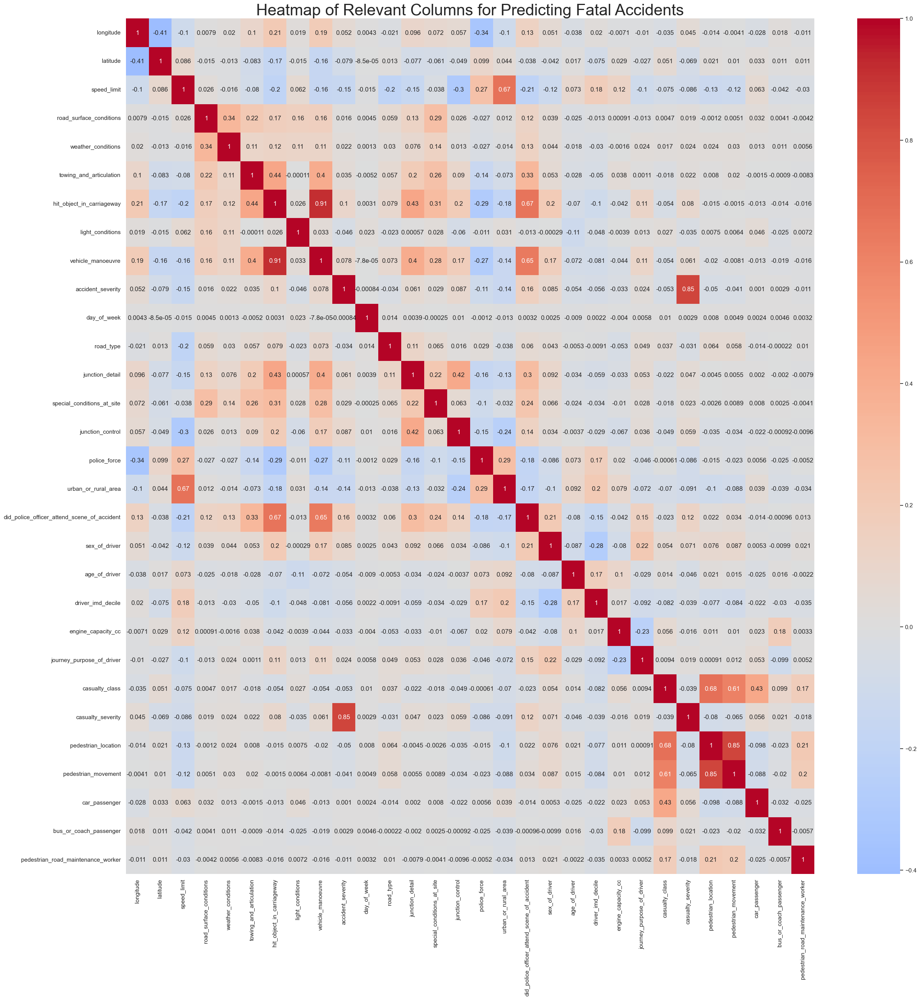

In [313]:
# Heat of the selected features

# Calculate the correlation matrix
corr_matrix = Relevant_columns.corr()

# Create a heatmap using seaborn
plt.figure(figsize=(29, 29))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", center=0)
plt.title("Heatmap of Relevant Columns for Predicting Fatal Accidents", fontsize=30)
plt.grid(False)
plt.show()

### Feature Selection 

In [314]:
# Prepare data for modeling
X = Relevant_columns.drop(columns=['accident_severity', 'time', 'lsoa_of_accident_location'])
y = Relevant_columns['accident_severity']

### Split Data

In [315]:
# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

### Normalize Data

In [316]:
# Standardize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

### Train Model

In [317]:
## Building the model with Gradient Boosting Classfier

In [318]:
# Train a Gradient Boosting Classifier
model = GradientBoostingClassifier(random_state=42)
model.fit(X_train_scaled, y_train)

GradientBoostingClassifier(random_state=42)

### Make Predictions

In [319]:
# Make predictions
y_pred = model.predict(X_train_scaled)

### Model Evaluation

In [320]:
# Evaluate the model
accuracy = accuracy_score(y_train, y_pred)
classification_rep = classification_report(y_train, y_pred)

print("Accuracy:", accuracy)
print("Classification Report:\n", classification_rep)

Accuracy: 0.9472463538004401
Classification Report:
               precision    recall  f1-score   support

           1       1.00      0.64      0.78      3408
           2       0.98      0.77      0.86     35746
           3       0.94      1.00      0.97    137194

    accuracy                           0.95    176348
   macro avg       0.97      0.81      0.87    176348
weighted avg       0.95      0.95      0.94    176348



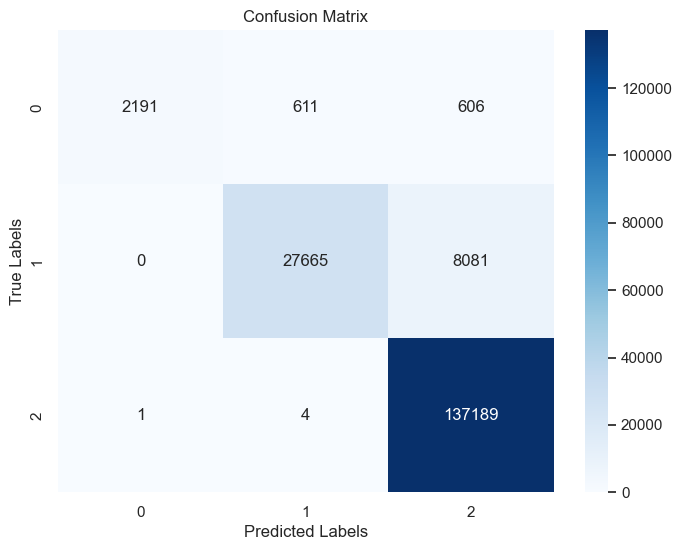

In [321]:
# Calculate confusion matrix
cm = confusion_matrix(y_train, y_pred)

# Create a heatmap for the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

In [322]:
# Make predictions
y_pred_test = model.predict(X_test_scaled)

In [323]:
# Evaluate the model
accuracy = accuracy_score(y_test, y_pred_test)
classification_rep = classification_report(y_test, y_pred_test)

print("Accuracy:", accuracy)
print("Classification Report:\n", classification_rep)

Accuracy: 0.9465828929162792
Classification Report:
               precision    recall  f1-score   support

           1       1.00      0.64      0.78       823
           2       0.98      0.77      0.86      9082
           3       0.94      1.00      0.97     34182

    accuracy                           0.95     44087
   macro avg       0.97      0.81      0.87     44087
weighted avg       0.95      0.95      0.94     44087



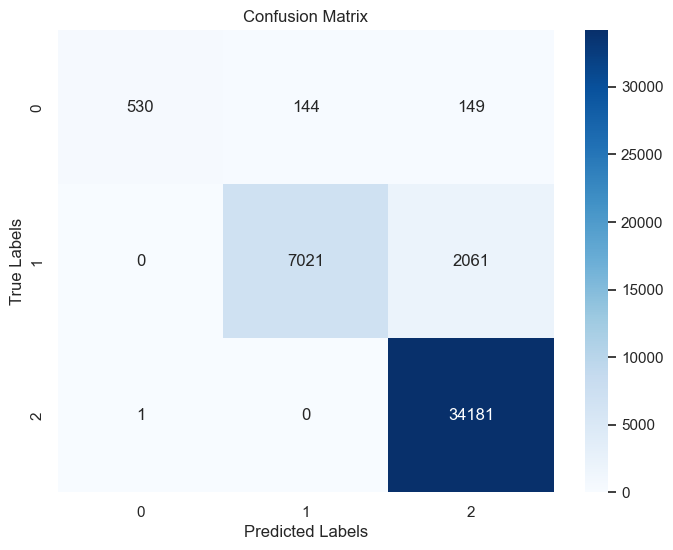

In [324]:
# Calculate confusion matrix
cm = confusion_matrix(y_test, y_pred_test)

# Create a heatmap for the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

Summary: 
    
- The model (Gradient Boosting Classifier) achieved an accuracy of 0.9472 on the training data and 0.9465 on the testing data. However, it did misclassify 1217 labels in the training data and 293 labels in the testing data for the predicted variable.

Considering the achieved results, it is advisable to utilize SMOTE for balancing the training data.

### Applying SMOTE 

In [325]:
# Initialize SMOTE
smote = SMOTE(random_state=42)

# Perform SMOTE on the training data
X_resampled, y_resampled = smote.fit_resample(X_train, y_train)

X_train, y_train = X_resampled, y_resampled

In [326]:
X_train.shape

(411582, 29)

In [327]:
y_train.shape

(411582,)

In [328]:
y_train.value_counts()

3    137194
2    137194
1    137194
Name: accident_severity, dtype: int64

In [329]:
# Standardize the features
scaler2 = StandardScaler()
X_train_scaled2 = scaler2.fit_transform(X_train)
X_test_scaled2 = scaler2.transform(X_test)

In [332]:
# Train a Gradien Boosting Classifier
model2 = GradientBoostingClassifier(random_state=42)
model2.fit(X_train_scaled2, y_train)

KeyboardInterrupt: 

In [ ]:
# Make predictions
y_pred2 = model2.predict(X_train_scaled2)

In [ ]:
# Evaluate the model
accuracy2 = accuracy_score(y_train, y_pred2)
classification_rep2 = classification_report(y_train, y_pred2)

print("Accuracy:", accuracy2)
print("Classification Report:\n", classification_rep2)

In [ ]:
# Calculate confusion matrix
cm = confusion_matrix(y_train, y_pred2)

# Create a heatmap for the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

In [ ]:
# Make predictions
y_pred3 = model2.predict(X_test_scaled2)

In [ ]:
# Evaluate the model
accuracy3 = accuracy_score(y_test, y_pred3)
classification_rep3 = classification_report(y_test, y_pred3)

print("Accuracy:", accuracy3)
print("Classification Report:\n", classification_rep3)

In [ ]:
# Calculate confusion matrix
cm = confusion_matrix(y_test, y_pred3)

# Create a heatmap for the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

Summary:

- Upon implementing SMOTE, the model demonstrated an accuracy of 0.8844 for the training data and 0.9465 for the testing data. Nevertheless, it still misclassified 29309 labels in the training data and 254 labels in the testing data for the predicted variable.

### Applying Random Forest Classifier 

In [ ]:
# Train a Random Forest Classifier
model3 = RandomForestClassifier(random_state=42)
model3.fit(X_train_scaled2, y_train)

In [ ]:
# Make predictions
y_pred4 = model3.predict(X_test_scaled2)

In [ ]:
# Evaluate the model
accuracy4 = accuracy_score(y_test, y_pred4)
classification_rep4 = classification_report(y_test, y_pred4)

print("Accuracy:", accuracy4)
print("Classification Report:\n", classification_rep4)

In [ ]:
# Calculate confusion matrix
cm = confusion_matrix(y_test, y_pred4)

# Create a heatmap for the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix")
plt.xlabel("Predicted Labels")
plt.ylabel("True Labels")
plt.show()

Summary
- The Random Forest Classifier yielded an improved accuracy of 0.9703 on testing data, though it still misclassified 138 labels. This enhancement highlights the selected variables' effective predictive capability for fatal injuries in RTAs, showcasing a strong relationship. The significant influence of variables such as longitude, latitude, speed limit, road surface and weather conditions, road type, and lighting conditions and more, on fatal injuries emphasizes the importance of improved road safety measures, including engineering enhancements, intelligent traffic management, advanced vehicle safety features, and timely weather alerts to mitigate risks.
